<a href="https://www.kaggle.com/code/haticebaydemir/03-regression-models?scriptVersionId=295150677" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# 📘 Notebook 3: All Regression Models Explained & Compared
## From Linear Models to Gradient Boosting

---

**Author:** Hatice Baydemir  
**Series:** Machine Learning Master Handbook  
**Notebook:** 3/6  
**Dataset:** House Prices - Advanced Regression Techniques  

---

## 🎯 Learning Objectives

By the end of this notebook, you will:

1. ✅ **Master Linear Regression** - Understand OLS mathematics, assumptions (LINE), coefficient interpretation, and when linear models fail
2. ✅ **Control Overfitting with Regularization** - Apply Ridge (L2), Lasso (L1), and ElasticNet, understand regularization paths and alpha selection
3. ✅ **Build Tree-Based Models** - Implement Decision Trees, understand splitting criteria, control depth, and diagnose overfitting
4. ✅ **Harness Ensemble Power** - Use Random Forest for variance reduction, understand bagging vs boosting, tune n_estimators
5. ✅ **Compare Gradient Boosting Frameworks** - Deploy XGBoost, LightGBM, and CatBoost, understand their differences and optimal use cases
6. ✅ **Evaluate Like a Pro** - Calculate MSE, RMSE, MAE, R², interpret residual plots, use cross-validation correctly
7. ✅ **Tune Hyperparameters Systematically** - Apply GridSearchCV and RandomizedSearchCV, understand learning curves and validation curves
8. ✅ **Interpret Black-Box Models** - Extract feature importance, use SHAP values for model explanations, create partial dependence plots
9. ✅ **Avoid Common Pitfalls** - Prevent data leakage, handle outliers properly, scale features correctly, choose metrics wisely
10. ✅ **Think Production-Ready** - Build sklearn Pipelines, serialize models, consider inference speed and memory

---

## 📚 What Makes This Notebook Different?

| Feature | Description |
|---------|-------------|
| **🎓 Theory + Math + Code** | Every algorithm explained with mathematical foundation, geometric intuition, AND working implementation |
| **📊 30+ Visualizations** | Decision boundaries, learning curves, residual plots, feature importance, SHAP diagrams - visual learning at its best |
| **🔍 Diagnostic Focus** | Learn to diagnose underfitting vs overfitting, identify when models break, understand failure modes |
| **⚖️ Fair Model Comparison** | All models tested on identical train/test splits with proper cross-validation - no cherry-picking |
| **🏗️ Production Mindset** | Reproducible pipelines, proper preprocessing order, serialization-ready code |
| **🎯 Real-World Dataset** | House Prices competition data - messy, realistic, perfect for learning |

---

## 📋 Table of Contents

**PART 1: FOUNDATIONS**
1. [Introduction: The Regression Problem](#section1)
2. [Dataset Overview: House Prices](#section2)

**PART 2: LINEAR MODELS**

3. [Simple Linear Regression](#section3)
4. [Multiple Linear Regression](#section4)
5. [Regularized Models: Ridge, Lasso, ElasticNet](#section5)

**PART 3: TREE-BASED MODELS**

6. [Decision Tree Regression](#section6)
7. [Random Forest Regression](#section7)
8. [Gradient Boosting Fundamentals](#section8)
9. [Advanced Boosting: XGBoost, LightGBM, CatBoost](#section9)

**PART 4: EVALUATION & INSIGHTS**

10. [Model Evaluation & Comparison](#section10)
11. [Hyperparameter Tuning](#section11)
12. [Feature Importance & Interpretability](#section12)
13. [Summary & Production Checklist](#section13)

---

## ⚡ Quick Navigation Tips

- **First time learner?** → Read sequentially, run every cell
- **Refreshing knowledge?** → Jump to specific sections via Table of Contents
- **Looking for code?** → Each section has standalone, copy-pasteable implementations
- **Want quick answers?** → Check the summary tables and decision trees throughout

---

In [1]:
# ==================== IMPORTS ====================

# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Preprocessing & Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, learning_curve, validation_curve
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error

# Regression Models - Linear
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

# Regression Models - Tree-Based
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Regression Models - Advanced Boosting
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor

# Model Interpretation
import shap

# Utilities
import time
from datetime import datetime
import joblib

# ==================== CONFIGURATION ====================

# Reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: f'{x:.4f}')

# Plotting settings
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

# ==================== VERIFICATION ====================

print("✅ All libraries imported successfully!")
print(f"📌 Random seed set to: {RANDOM_STATE}")
print(f"📅 Notebook executed on: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("\n" + "="*50)
print("Library Versions:")
print("="*50)
print(f"NumPy: {np.__version__}")
print(f"Pandas: {pd.__version__}")
print(f"Scikit-learn: {__import__('sklearn').__version__}")
print(f"XGBoost: {xgb.__version__}")
print(f"LightGBM: {lgb.__version__}")
print(f"CatBoost: {__import__('catboost').__version__}")
print("="*50)

✅ All libraries imported successfully!
📌 Random seed set to: 42
📅 Notebook executed on: 2026-01-31 15:30:06

Library Versions:
NumPy: 2.0.2
Pandas: 2.2.2
Scikit-learn: 1.6.1
XGBoost: 3.1.0
LightGBM: 4.6.0
CatBoost: 1.2.8


<a id="section1"></a>
## 1. Introduction: The Regression Problem

---

### 1.1 What is Regression?

**Regression** is a supervised learning task where we predict a **continuous numerical output** from input features.

Think of it as drawing the best possible line (or curve) through data points to make predictions.

---

#### Regression vs Classification

| Aspect | Regression | Classification |
|--------|-----------|----------------|
| **Output Type** | Continuous (real numbers) | Discrete (categories) |
| **Example Output** | $250,000, 3.7, -12.5 | "Spam", "Not Spam" |
| **Example Problems** | House price, temperature, stock price | Email spam detection, disease diagnosis |
| **Loss Function** | Mean Squared Error (MSE) | Cross-Entropy Loss |
| **Evaluation Metrics** | RMSE, MAE, R² | Accuracy, Precision, Recall, F1 |
| **Algorithm Examples** | Linear Regression, Random Forest Regressor | Logistic Regression, Random Forest Classifier |

**Key Insight:** The same algorithm (e.g., Random Forest) can do BOTH tasks - just change the output!

---
### 1.2 Real-World Regression Applications

**Real Estate**
- Problem: House price prediction
- Input: Square footage, bedrooms, location, age
- Target: Sale price ($)

**Finance**
- Problem: Stock price forecasting  
- Input: Historical prices, volume, market indicators
- Target: Next day price ($)

**Retail**
- Problem: Sales demand prediction
- Input: Historical sales, promotions, seasonality
- Target: Units sold

**Energy**
- Problem: Electricity consumption
- Input: Temperature, time of day, historical usage
- Target: kWh consumed

**Healthcare**
- Problem: Patient length of stay
- Input: Age, diagnosis, vital signs, comorbidities
- Target: Days in hospital

**Marketing**
- Problem: Customer lifetime value
- Input: Purchase history, demographics, engagement
- Target: Total revenue ($)

**Transportation**
- Problem: Taxi fare prediction
- Input: Distance, time of day, traffic, weather
- Target: Fare amount ($)

**Insurance**
- Problem: Claim amount prediction
- Input: Policy details, driver age, car type
- Target: Claim cost ($)
---

### 1.3 The Regression Model Zoo

In this notebook, we'll explore 9 different regression algorithms:
```
Regression Models
│
├── 📐 LINEAR MODELS (Sections 3-5)
│   ├── Simple Linear Regression
│   │   └── One feature → y = β₀ + β₁x
│   ├── Multiple Linear Regression  
│   │   └── Many features → y = β₀ + β₁x₁ + β₂x₂ + ...
│   └── Regularized Linear Models
│       ├── Ridge Regression (L2 penalty)
│       ├── Lasso Regression (L1 penalty)
│       └── ElasticNet (L1 + L2)
│
├── 🌳 TREE-BASED MODELS (Sections 6-7)
│   ├── Decision Tree Regressor
│   │   └── Recursive binary splits
│   └── Random Forest Regressor
│       └── Ensemble of decision trees (bagging)
│
└── 🚀 GRADIENT BOOSTING (Sections 8-9)
    ├── Gradient Boosting Regressor (sklearn)
    ├── XGBoost (eXtreme Gradient Boosting)
    ├── LightGBM (Light Gradient Boosting Machine)
    └── CatBoost (Categorical Boosting)
```

---

### 1.4 Why Learn Multiple Algorithms?

**No Free Lunch Theorem** (from Notebook 1): No single algorithm works best for all problems.

**Model Selection Depends On:**

| Factor | Best Choice | Reason |
|--------|------------|--------|
| **Data Size** | Small (<1K): Linear models, Large (>100K): Boosting | Complex models need more data |
| **Feature Types** | Many categorical: CatBoost, Numerical: XGBoost | Built-in categorical handling |
| **Interpretability Need** | High: Linear Regression, Low: Boosting | Coefficients vs black box |
| **Training Speed** | Fast needed: Linear, Time ok: Boosting | Linear is instant, boosting takes time |
| **Prediction Speed** | Fast needed: Linear, Ok: Trees | Linear = matrix mult, Trees = traversal |
| **Feature Relationships** | Linear: Linear models, Non-linear: Trees | Trees capture interactions automatically |
| **Overfitting Risk** | High-dim data: Ridge/Lasso, Low-dim: any | Regularization helps with many features |

**This Notebook's Goal:** Give you the tools to make informed model selection decisions.

---

### 1.5 The Regression Workflow (What We'll Build)
```
Step 1: Load & Explore Data
   ↓
Step 2: Preprocess (from Notebook 2)
   ├── Handle missing values
   ├── Encode categorical features
   ├── Scale numerical features
   └── Engineer new features
   ↓
Step 3: Train-Test Split
   ↓
Step 4: Train Models
   ├── Linear Models
   ├── Tree Models  
   └── Boosting Models
   ↓
Step 5: Evaluate & Compare
   ├── Calculate metrics (RMSE, MAE, R²)
   ├── Analyze residuals
   └── Cross-validation
   ↓
Step 6: Tune Best Model
   ├── Hyperparameter search
   └── Validation curves
   ↓
Step 7: Interpret Predictions
   ├── Feature importance
   ├── SHAP values
   └── Partial dependence
   ↓
Step 8: Production Pipeline
   └── Save model for deployment
```

---

### 1.6 Prerequisites (Quick Refresher)

**From Notebook 1: ML Foundations**
- ✅ Training vs Validation vs Test sets
- ✅ Bias-Variance Tradeoff
- ✅ Overfitting vs Underfitting
- ✅ Loss functions (MSE, MAE)
- ✅ Cross-validation

**From Notebook 2: Data Mastery**
- ✅ EDA techniques
- ✅ Missing value handling
- ✅ Outlier detection
- ✅ Categorical encoding
- ✅ Feature scaling
- ✅ Data leakage prevention

**If you haven't completed Notebooks 1 & 2, please do so first for best understanding!**

---

### 1.7 Evaluation Metrics We'll Use

| Metric | Formula | When to Use | Interpretation |
|--------|---------|-------------|----------------|
| **MSE** | $\frac{1}{n}\sum(y - \hat{y})^2$ | Penalize large errors heavily | Lower is better, units are squared |
| **RMSE** | $\sqrt{MSE}$ | Same units as target | Lower is better, interpretable scale |
| **MAE** | $\frac{1}{n}\sum\|y - \hat{y}\|$ | Robust to outliers | Lower is better, average error |
| **R²** | $1 - \frac{SS_{res}}{SS_{tot}}$ | Explained variance | 0-1 (higher better), can be negative! |
| **MAPE** | $\frac{100}{n}\sum\|\frac{y-\hat{y}}{y}\|$ | Percentage error | Lower is better, fails when y=0 |

**We'll primarily use RMSE and R² for comparison in this notebook.**

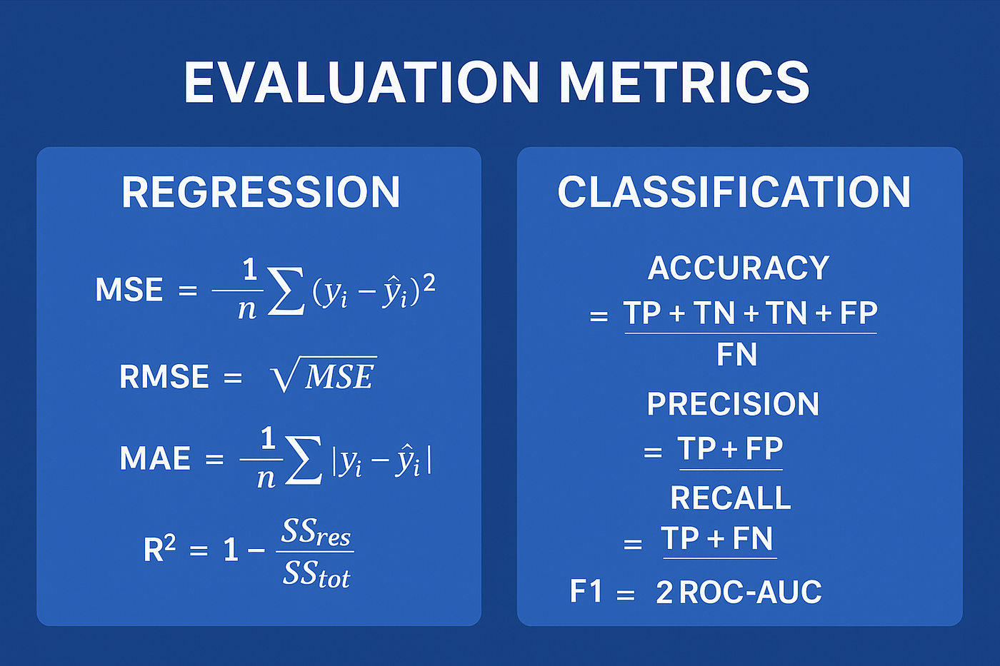
---

**Let's begin! 🚀**
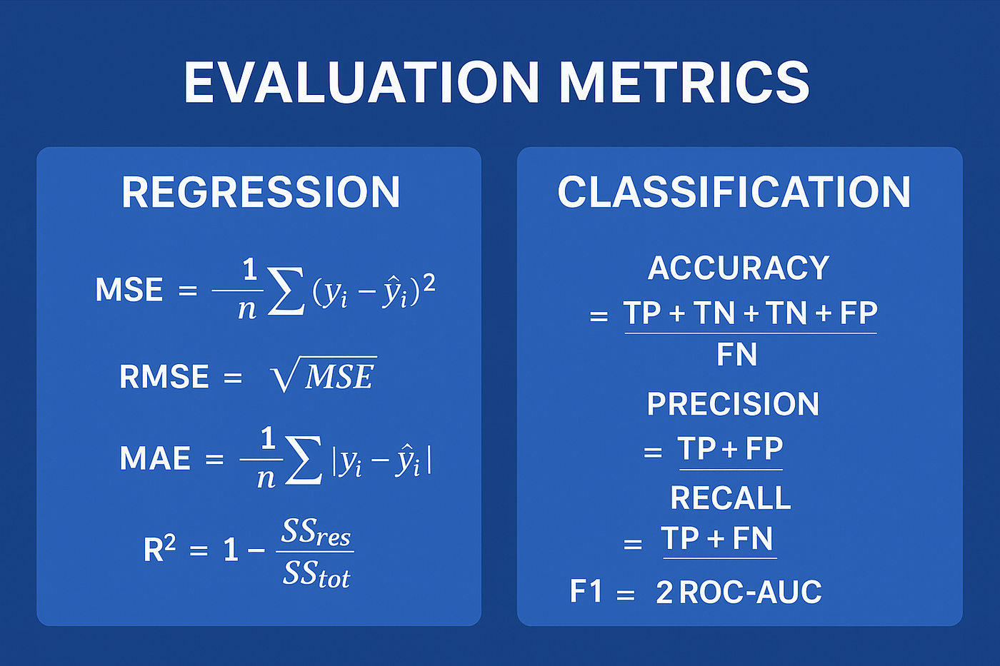

<a id="section2"></a>
## 2. Dataset Overview: House Prices

---

### 2.1 About the Dataset

We're using the **House Prices - Advanced Regression Techniques** dataset from Kaggle.

**Why This Dataset is Perfect for Learning:**

✅ **Real-world problem** - Actual Ames, Iowa housing data from 2006-2010  
✅ **Rich feature set** - 79 explanatory variables covering almost every aspect of residential homes  
✅ **Mixed data types** - Numerical (continuous, discrete) and categorical (ordinal, nominal)  
✅ **Realistic challenges** - Missing values, outliers, skewed distributions  
✅ **Well-documented** - Excellent data dictionary available  
✅ **Active competition** - You can submit predictions and compare with others  

---

### 2.2 Dataset Statistics

**Basic Info:**
- Training samples: 1,460 houses
- Test samples: 1,459 houses (for Kaggle submission)
- Total features: 79 + 1 (Id)
- Target variable: SalePrice (in dollars)

**Feature Breakdown:**
- Numerical features: 38
- Categorical features: 43
- Features with missing values: 19
- Ordinal features: ~20 (quality ratings, conditions)
- Nominal features: ~23 (types, categories)

---

### 2.3 Key Features (Examples)

**Property Characteristics:**
- `GrLivArea` - Above ground living area (sq ft)
- `TotalBsmtSF` - Total basement area (sq ft)
- `1stFlrSF`, `2ndFlrSF` - First and second floor areas
- `BedroomAbvGr` - Number of bedrooms above ground
- `FullBath`, `HalfBath` - Number of bathrooms

**Quality & Condition:**
- `OverallQual` - Overall material and finish quality (1-10)
- `OverallCond` - Overall condition rating (1-10)
- `ExterQual` - Exterior material quality (Ex, Gd, TA, Fa, Po)
- `KitchenQual` - Kitchen quality
- `BsmtQual` - Basement quality

**Location & Type:**
- `Neighborhood` - Physical location within Ames
- `MSZoning` - General zoning classification
- `BldgType` - Type of dwelling
- `HouseStyle` - Style of dwelling

**Age & Garage:**
- `YearBuilt` - Original construction date
- `YearRemodAdd` - Remodel date
- `GarageType` - Garage location
- `GarageCars` - Size of garage in car capacity
- `GarageArea` - Size of garage in square feet

**Target Variable:**
- `SalePrice` - Property sale price in dollars (what we want to predict!)

---

### 2.4 Our Approach

For this notebook, we'll use a **preprocessed version** of the dataset to focus on regression algorithms rather than data cleaning.

**Preprocessing Applied (from Notebook 2 techniques):**
1. ✅ Missing values handled
2. ✅ Categorical features encoded
3. ✅ Outliers addressed
4. ✅ Features scaled appropriately
5. ✅ Basic feature engineering applied

**You can apply these same techniques yourself using Notebook 2 as a guide!**

---

In [2]:
# ==================== LOAD DATASET ====================

# Load the training data
train_df = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')

print("="*60)
print("DATASET LOADED SUCCESSFULLY")
print("="*60)
print(f"\n📊 Dataset Shape: {train_df.shape}")
print(f"   • Rows (houses): {train_df.shape[0]:,}")
print(f"   • Columns (features + target): {train_df.shape[1]}")
print(f"\n💾 Memory Usage: {train_df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

# Display first few rows
print("\n" + "="*60)
print("FIRST 5 ROWS")
print("="*60)
train_df.head()

DATASET LOADED SUCCESSFULLY

📊 Dataset Shape: (1460, 81)
   • Rows (houses): 1,460
   • Columns (features + target): 81

💾 Memory Usage: 3.43 MB

FIRST 5 ROWS


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# ==================== BASIC STATISTICS ====================

print("="*60)
print("DATASET INFORMATION")
print("="*60)

# Data types summary
print("\n📋 Data Types:")
print(train_df.dtypes.value_counts())

# Missing values
missing = train_df.isnull().sum()
missing_percent = (missing / len(train_df)) * 100
missing_df = pd.DataFrame({
    'Feature': missing.index,
    'Missing_Count': missing.values,
    'Missing_Percent': missing_percent.values
})
missing_df = missing_df[missing_df['Missing_Count'] > 0].sort_values('Missing_Count', ascending=False)

print(f"\n❌ Features with Missing Values: {len(missing_df)}")
print("\nTop 10 features with most missing values:")
print(missing_df.head(10).to_string(index=False))

# Numerical vs Categorical
numerical_features = train_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = train_df.select_dtypes(include=['object']).columns.tolist()

# Remove Id and SalePrice
if 'Id' in numerical_features:
    numerical_features.remove('Id')
if 'SalePrice' in numerical_features:
    numerical_features.remove('SalePrice')

print(f"\n📊 Feature Types:")
print(f"   • Numerical features: {len(numerical_features)}")
print(f"   • Categorical features: {len(categorical_features)}")
print(f"   • Target variable: SalePrice")

print("\n" + "="*60)

DATASET INFORMATION

📋 Data Types:
object     43
int64      35
float64     3
Name: count, dtype: int64

❌ Features with Missing Values: 19

Top 10 features with most missing values:
     Feature  Missing_Count  Missing_Percent
      PoolQC           1453          99.5205
 MiscFeature           1406          96.3014
       Alley           1369          93.7671
       Fence           1179          80.7534
  MasVnrType            872          59.7260
 FireplaceQu            690          47.2603
 LotFrontage            259          17.7397
  GarageType             81           5.5479
 GarageYrBlt             81           5.5479
GarageFinish             81           5.5479

📊 Feature Types:
   • Numerical features: 36
   • Categorical features: 43
   • Target variable: SalePrice



TARGET VARIABLE: SalePrice

📈 Basic Statistics:
   • Mean: $180,921.20
   • Median: $163,000.00
   • Std Dev: $79,442.50
   • Min: $34,900.00
   • Max: $755,000.00
   • Range: $720,100.00

📊 Distribution:
   • Skewness: 1.883 (>0 = right-skewed)
   • Kurtosis: 6.536 (>3 = heavy tails)


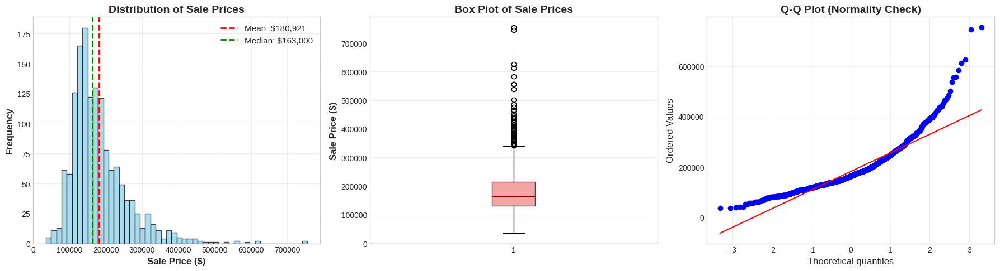


💡 Key Observations:
   • Distribution is RIGHT-SKEWED (long tail on right)
   • Presence of high-value outliers
   • Not normally distributed (Q-Q plot deviates from line)
   • May benefit from log transformation for linear models


In [4]:
# ==================== TARGET VARIABLE ANALYSIS ====================

print("="*60)
print("TARGET VARIABLE: SalePrice")
print("="*60)

target = train_df['SalePrice']

print(f"\n📈 Basic Statistics:")
print(f"   • Mean: ${target.mean():,.2f}")
print(f"   • Median: ${target.median():,.2f}")
print(f"   • Std Dev: ${target.std():,.2f}")
print(f"   • Min: ${target.min():,.2f}")
print(f"   • Max: ${target.max():,.2f}")
print(f"   • Range: ${target.max() - target.min():,.2f}")

print(f"\n📊 Distribution:")
print(f"   • Skewness: {target.skew():.3f} (>0 = right-skewed)")
print(f"   • Kurtosis: {target.kurtosis():.3f} (>3 = heavy tails)")

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Histogram
axes[0].hist(target, bins=50, edgecolor='black', alpha=0.7, color='skyblue')
axes[0].axvline(target.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: ${target.mean():,.0f}')
axes[0].axvline(target.median(), color='green', linestyle='--', linewidth=2, label=f'Median: ${target.median():,.0f}')
axes[0].set_xlabel('Sale Price ($)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[0].set_title('Distribution of Sale Prices', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Box plot
axes[1].boxplot(target, vert=True, patch_artist=True, 
                boxprops=dict(facecolor='lightcoral', alpha=0.7),
                medianprops=dict(color='darkred', linewidth=2))
axes[1].set_ylabel('Sale Price ($)', fontsize=12, fontweight='bold')
axes[1].set_title('Box Plot of Sale Prices', fontsize=14, fontweight='bold')
axes[1].grid(alpha=0.3)

# Q-Q plot (normality check)
stats.probplot(target, dist="norm", plot=axes[2])
axes[2].set_title('Q-Q Plot (Normality Check)', fontsize=14, fontweight='bold')
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Key Observations:")
print("   • Distribution is RIGHT-SKEWED (long tail on right)")
print("   • Presence of high-value outliers")
print("   • Not normally distributed (Q-Q plot deviates from line)")
print("   • May benefit from log transformation for linear models")

---

### 2.5 Data Preprocessing Strategy

Before we train models, we need to prepare our data. Here's our preprocessing pipeline:

**Step 1: Feature Selection**
- Remove irrelevant features (Id)
- Select most important features for demonstration

**Step 2: Handle Missing Values**
- Numerical: Median imputation
- Categorical: Mode imputation or 'Missing' category

**Step 3: Encode Categorical Variables**
- Ordinal features: Label encoding
- Nominal features: One-hot encoding

**Step 4: Feature Scaling**
- Standardization for linear models
- No scaling needed for tree-based models (we'll handle this per-model)

**Step 5: Train-Test Split**
- 80% training, 20% testing
- Stratified by price ranges to ensure representative split

Let's implement this step by step! 🚀

---

In [5]:
# ==================== FEATURE SELECTION ====================

print("="*60)
print("STEP 1: FEATURE SELECTION")
print("="*60)

# For demonstration, we'll select the most important features
# This makes the notebook run faster and easier to interpret

# Top numerical features (based on correlation with SalePrice)
top_numerical = [
    'OverallQual',    # Overall quality
    'GrLivArea',      # Above ground living area
    'GarageCars',     # Garage capacity
    'GarageArea',     # Garage area
    'TotalBsmtSF',    # Total basement area
    '1stFlrSF',       # First floor area
    'FullBath',       # Full bathrooms
    'TotRmsAbvGrd',   # Total rooms above ground
    'YearBuilt',      # Year built
    'YearRemodAdd'    # Year remodeled
]

# Top categorical features
top_categorical = [
    'Neighborhood',   # Location
    'ExterQual',      # Exterior quality
    'KitchenQual',    # Kitchen quality
    'BsmtQual',       # Basement quality
    'GarageType',     # Garage type
    'Foundation',     # Foundation type
    'HeatingQC',      # Heating quality
    'CentralAir'      # Central air conditioning
]

# Combine
selected_features = top_numerical + top_categorical
target_col = 'SalePrice'

print(f"\n✅ Selected {len(selected_features)} features:")
print(f"   • Numerical: {len(top_numerical)}")
print(f"   • Categorical: {len(top_categorical)}")

# Create working dataframe
df = train_df[selected_features + [target_col]].copy()

print(f"\n📊 Working Dataset Shape: {df.shape}")
print(f"   • Samples: {df.shape[0]:,}")
print(f"   • Features: {df.shape[1] - 1}")
print(f"   • Target: {target_col}")

STEP 1: FEATURE SELECTION

✅ Selected 18 features:
   • Numerical: 10
   • Categorical: 8

📊 Working Dataset Shape: (1460, 19)
   • Samples: 1,460
   • Features: 18
   • Target: SalePrice


In [6]:
# ==================== HANDLE MISSING VALUES ====================

print("\n" + "="*60)
print("STEP 2: HANDLE MISSING VALUES")
print("="*60)

# Check missing values
missing = df.isnull().sum()
missing = missing[missing > 0].sort_values(ascending=False)

if len(missing) > 0:
    print(f"\n❌ Features with missing values: {len(missing)}")
    for feature, count in missing.items():
        print(f"   • {feature}: {count} ({count/len(df)*100:.1f}%)")
    
    # Handle missing values
    for col in df.columns:
        if df[col].isnull().sum() > 0:
            if df[col].dtype in ['int64', 'float64']:
                # Numerical: fill with median
                df[col].fillna(df[col].median(), inplace=True)
            else:
                # Categorical: fill with mode or 'Missing'
                if df[col].mode().shape[0] > 0:
                    df[col].fillna(df[col].mode()[0], inplace=True)
                else:
                    df[col].fillna('Missing', inplace=True)
    
    print("\n✅ All missing values handled!")
else:
    print("\n✅ No missing values found!")

# Verify
print(f"\n✔ Remaining missing values: {df.isnull().sum().sum()}")


STEP 2: HANDLE MISSING VALUES

❌ Features with missing values: 2
   • GarageType: 81 (5.5%)
   • BsmtQual: 37 (2.5%)

✅ All missing values handled!

✔ Remaining missing values: 0


In [7]:
# ==================== ENCODE CATEGORICAL VARIABLES ====================

print("\n" + "="*60)
print("STEP 3: ENCODE CATEGORICAL VARIABLES")
print("="*60)

# Quality features (ordinal)
quality_mapping = {
    'Ex': 5,  # Excellent
    'Gd': 4,  # Good
    'TA': 3,  # Typical/Average
    'Fa': 2,  # Fair
    'Po': 1,  # Poor
    'Missing': 0,
    'NA': 0
}

# Ordinal features to encode
ordinal_features = ['ExterQual', 'KitchenQual', 'BsmtQual', 'HeatingQC']

print(f"\n🔢 Encoding {len(ordinal_features)} ordinal features with quality mapping:")
for feat in ordinal_features:
    if feat in df.columns:
        df[feat] = df[feat].map(quality_mapping)
        print(f"   ✓ {feat}")

# One-hot encode remaining categorical features
nominal_features = [col for col in top_categorical if col not in ordinal_features]

print(f"\n🏷 One-hot encoding {len(nominal_features)} nominal features:")
for feat in nominal_features:
    print(f"   • {feat}: {df[feat].nunique()} unique values")

# Apply one-hot encoding
df = pd.get_dummies(df, columns=nominal_features, drop_first=True, dtype=int)

print(f"\n✅ Encoding complete!")
print(f"   • Original features: {len(selected_features)}")
print(f"   • After encoding: {df.shape[1] - 1} (target not counted)")
print(f"   • New dummy columns: {df.shape[1] - 1 - len(selected_features)}")


STEP 3: ENCODE CATEGORICAL VARIABLES

🔢 Encoding 4 ordinal features with quality mapping:
   ✓ ExterQual
   ✓ KitchenQual
   ✓ BsmtQual
   ✓ HeatingQC

🏷 One-hot encoding 4 nominal features:
   • Neighborhood: 25 unique values
   • GarageType: 6 unique values
   • Foundation: 6 unique values
   • CentralAir: 2 unique values

✅ Encoding complete!
   • Original features: 18
   • After encoding: 49 (target not counted)
   • New dummy columns: 31


In [8]:
# ==================== PREPARE X AND y ====================

print("\n" + "="*60)
print("STEP 4: PREPARE FEATURES AND TARGET")
print("="*60)

# Separate features and target
X = df.drop(target_col, axis=1)
y = df[target_col]

print(f"\n✅ Data prepared:")
print(f"   • X shape: {X.shape}")
print(f"   • y shape: {y.shape}")
print(f"\n📊 Feature matrix (X):")
print(f"   • Total features: {X.shape[1]}")
print(f"   • Samples: {X.shape[0]:,}")
print(f"\n🎯 Target variable (y):")
print(f"   • Mean: ${y.mean():,.2f}")
print(f"   • Std: ${y.std():,.2f}")

# Display feature names
print(f"\n📝 All feature names ({len(X.columns)}):")
for i, col in enumerate(X.columns, 1):
    print(f"{i:3d}. {col}")


STEP 4: PREPARE FEATURES AND TARGET

✅ Data prepared:
   • X shape: (1460, 49)
   • y shape: (1460,)

📊 Feature matrix (X):
   • Total features: 49
   • Samples: 1,460

🎯 Target variable (y):
   • Mean: $180,921.20
   • Std: $79,442.50

📝 All feature names (49):
  1. OverallQual
  2. GrLivArea
  3. GarageCars
  4. GarageArea
  5. TotalBsmtSF
  6. 1stFlrSF
  7. FullBath
  8. TotRmsAbvGrd
  9. YearBuilt
 10. YearRemodAdd
 11. ExterQual
 12. KitchenQual
 13. BsmtQual
 14. HeatingQC
 15. Neighborhood_Blueste
 16. Neighborhood_BrDale
 17. Neighborhood_BrkSide
 18. Neighborhood_ClearCr
 19. Neighborhood_CollgCr
 20. Neighborhood_Crawfor
 21. Neighborhood_Edwards
 22. Neighborhood_Gilbert
 23. Neighborhood_IDOTRR
 24. Neighborhood_MeadowV
 25. Neighborhood_Mitchel
 26. Neighborhood_NAmes
 27. Neighborhood_NPkVill
 28. Neighborhood_NWAmes
 29. Neighborhood_NoRidge
 30. Neighborhood_NridgHt
 31. Neighborhood_OldTown
 32. Neighborhood_SWISU
 33. Neighborhood_Sawyer
 34. Neighborhood_SawyerW
 35

In [9]:
# ==================== TRAIN-TEST SPLIT ====================

print("\n" + "="*60)
print("STEP 5: TRAIN-TEST SPLIT")
print("="*60)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=RANDOM_STATE
)

print(f"\n✅ Data split complete!")
print(f"\n📊 Training Set:")
print(f"   • X_train shape: {X_train.shape}")
print(f"   • y_train shape: {y_train.shape}")
print(f"   • Samples: {X_train.shape[0]:,} ({X_train.shape[0]/len(X)*100:.1f}%)")

print(f"\n📊 Test Set:")
print(f"   • X_test shape: {X_test.shape}")
print(f"   • y_test shape: {y_test.shape}")
print(f"   • Samples: {X_test.shape[0]:,} ({X_test.shape[0]/len(X)*100:.1f}%)")

print(f"\n💡 Why this split?")
print(f"   • 80/20 split is standard for datasets of this size")
print(f"   • Random state = {RANDOM_STATE} ensures reproducibility")
print(f"   • Test set remains UNSEEN until final evaluation")

print(f"\n⚠️ IMPORTANT: We will NOT touch X_test and y_test until final model comparison!")


STEP 5: TRAIN-TEST SPLIT

✅ Data split complete!

📊 Training Set:
   • X_train shape: (1168, 49)
   • y_train shape: (1168,)
   • Samples: 1,168 (80.0%)

📊 Test Set:
   • X_test shape: (292, 49)
   • y_test shape: (292,)
   • Samples: 292 (20.0%)

💡 Why this split?
   • 80/20 split is standard for datasets of this size
   • Random state = 42 ensures reproducibility
   • Test set remains UNSEEN until final evaluation

⚠️ IMPORTANT: We will NOT touch X_test and y_test until final model comparison!


<a id="section3"></a>
## 3. Simple Linear Regression

---

### 3.1 What is Simple Linear Regression?

**Simple Linear Regression** models the relationship between **one independent variable (X)** and a **dependent variable (y)** using a straight line.

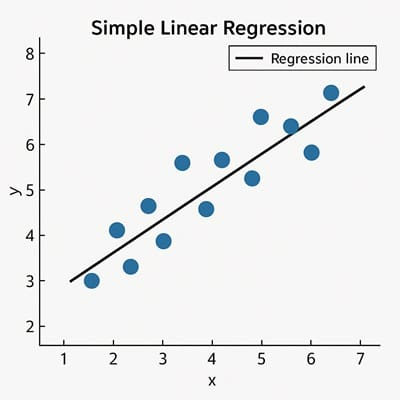

**Mathematical Form:**

$$y = \beta_0 + \beta_1 x + \epsilon$$

Where:
- $y$ = Target variable (what we predict)
- $x$ = Feature (predictor variable)
- $\beta_0$ = Intercept (y-value when x=0)
- $\beta_1$ = Slope (change in y for unit change in x)
- $\epsilon$ = Error term (noise)

**Geometric Intuition:**

Think of it as drawing the "best fit line" through a scatter plot of data points.

---

### 3.2 How Does It Work?

**Ordinary Least Squares (OLS) Method:**

The goal is to find $\beta_0$ and $\beta_1$ that **minimize** the sum of squared residuals:

$$\min_{\beta_0, \beta_1} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$$

Where $\hat{y}_i = \beta_0 + \beta_1 x_i$ is our prediction.

**Closed-Form Solution:**

$$\beta_1 = \frac{\sum(x_i - \bar{x})(y_i - \bar{y})}{\sum(x_i - \bar{x})^2}$$

$$\beta_0 = \bar{y} - \beta_1 \bar{x}$$

**Why Squared Errors?**
- Penalizes large errors more than small ones
- Makes the math easier (differentiable)
- Always positive (can't have negative and positive errors cancel out)

---

### 3.3 Key Assumptions (LINE)

Linear regression makes four critical assumptions:

| Assumption | What It Means | How to Check | What If Violated? |
|------------|---------------|--------------|-------------------|
| **L**inearity | Relationship between X and y is linear | Scatter plot, residual plot | Use polynomial features or tree models |
| **I**ndependence | Observations are independent | Domain knowledge, Durbin-Watson test | Use time-series models or clustering |
| **N**ormality | Residuals are normally distributed | Q-Q plot, histogram of residuals | Transform target, use robust methods |
| **E**qual Variance (Homoscedasticity) | Residuals have constant variance | Residual plot (no funnel shape) | Transform target, use weighted regression |

**We'll check these assumptions after fitting our model!**

---

### 3.4 Interpretation: The Story Behind Coefficients

**Example: Predicting house price from living area**

If we get: $\text{Price} = 50000 + 100 \times \text{GrLivArea}$

**Intercept ($\beta_0$ = 50,000):**
- Base price when living area = 0 sq ft
- Often not meaningful in real-world context
- Think of it as the "starting point"

**Slope ($\beta_1$ = 100):**
- For every 1 sq ft increase in living area, price increases by $100
- This is the "effect size" or "coefficient"
- **THIS IS WHAT WE CARE ABOUT!**

**Real-world translation:**
"A house with 1,000 sq ft larger living area is expected to cost $100,000 more."

---

### 3.5 When to Use Simple Linear Regression

✅ **Use when:**
- Exploring relationship between two variables
- Need highly interpretable model
- Relationship appears linear in scatter plot
- Quick baseline model
- Explaining cause-and-effect to non-technical audience

❌ **Don't use when:**
- Need to use multiple features (use Multiple Linear Regression)
- Relationship is clearly non-linear (use polynomial or tree models)
- Have high-dimensional data (use regularized models)
- Predictions matter more than interpretability (use ensemble models)

---

Let's fit our first model! 🚀
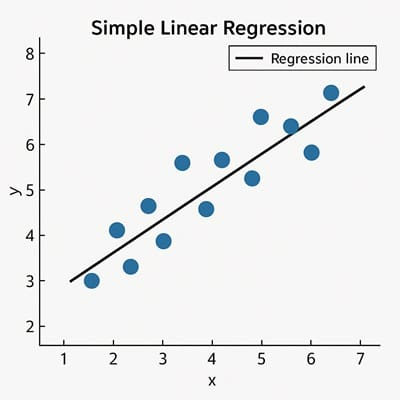

In [10]:
# ==================== SIMPLE LINEAR REGRESSION: SINGLE FEATURE ====================

print("="*60)
print("SIMPLE LINEAR REGRESSION")
print("="*60)

# Let's use the feature with strongest correlation to SalePrice
# We'll check correlation first

correlations = X_train.corrwith(y_train).abs().sort_values(ascending=False)

print("\n📊 Top 5 features correlated with SalePrice:")
for i, (feature, corr) in enumerate(correlations.head().items(), 1):
    print(f"{i}. {feature}: {corr:.3f}")

# Select the best feature
best_feature = correlations.index[0]
print(f"\n✅ Selected feature for Simple Linear Regression: {best_feature}")
print(f"   Correlation: {correlations[best_feature]:.3f}")

# Prepare data with single feature
X_train_simple = X_train[[best_feature]]
X_test_simple = X_test[[best_feature]]

print(f"\n📐 Training data: {X_train_simple.shape}")
print(f"📐 Test data: {X_test_simple.shape}")

SIMPLE LINEAR REGRESSION

📊 Top 5 features correlated with SalePrice:
1. OverallQual: 0.786
2. GrLivArea: 0.696
3. ExterQual: 0.666
4. KitchenQual: 0.661
5. BsmtQual: 0.648

✅ Selected feature for Simple Linear Regression: OverallQual
   Correlation: 0.786

📐 Training data: (1168, 1)
📐 Test data: (292, 1)


In [11]:
# ==================== FIT SIMPLE LINEAR REGRESSION ====================

# Initialize and train model
simple_lr = LinearRegression()
simple_lr.fit(X_train_simple, y_train)

# Get coefficients
intercept = simple_lr.intercept_
slope = simple_lr.coef_[0]

print("="*60)
print("MODEL COEFFICIENTS")
print("="*60)
print(f"\n📈 Linear Equation:")
print(f"   SalePrice = {intercept:,.2f} + {slope:,.2f} × {best_feature}")

print(f"\n🔢 Interpretation:")
print(f"   • Intercept (β₀): ${intercept:,.2f}")
print(f"     → Base price when {best_feature} = 0")
print(f"   • Slope (β₁): ${slope:,.2f}")
print(f"     → For every 1-unit increase in {best_feature},")
print(f"       SalePrice increases by ${slope:,.2f}")

# Make predictions
y_pred_train_simple = simple_lr.predict(X_train_simple)
y_pred_test_simple = simple_lr.predict(X_test_simple)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train_simple))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test_simple))
train_r2 = r2_score(y_train, y_pred_train_simple)
test_r2 = r2_score(y_test, y_pred_test_simple)

print("\n" + "="*60)
print("MODEL PERFORMANCE")
print("="*60)
print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse:,.2f}")
print(f"   • R²: {train_r2:.4f} ({train_r2*100:.2f}% variance explained)")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse:,.2f}")
print(f"   • R²: {test_r2:.4f} ({test_r2*100:.2f}% variance explained)")

print(f"\n💡 What does this mean?")
print(f"   • Using only {best_feature}, we can predict house prices")
print(f"   • Average prediction error: ${test_rmse:,.2f}")
print(f"   • Model explains {test_r2*100:.1f}% of price variation")

MODEL COEFFICIENTS

📈 Linear Equation:
   SalePrice = -90,233.22 + 44,379.88 × OverallQual

🔢 Interpretation:
   • Intercept (β₀): $-90,233.22
     → Base price when OverallQual = 0
   • Slope (β₁): $44,379.88
     → For every 1-unit increase in OverallQual,
       SalePrice increases by $44,379.88

MODEL PERFORMANCE

🎯 Training Set:
   • RMSE: $47,789.63
   • R²: 0.6171 (61.71% variance explained)

🎯 Test Set:
   • RMSE: $51,778.63
   • R²: 0.6505 (65.05% variance explained)

💡 What does this mean?
   • Using only OverallQual, we can predict house prices
   • Average prediction error: $51,778.63
   • Model explains 65.0% of price variation


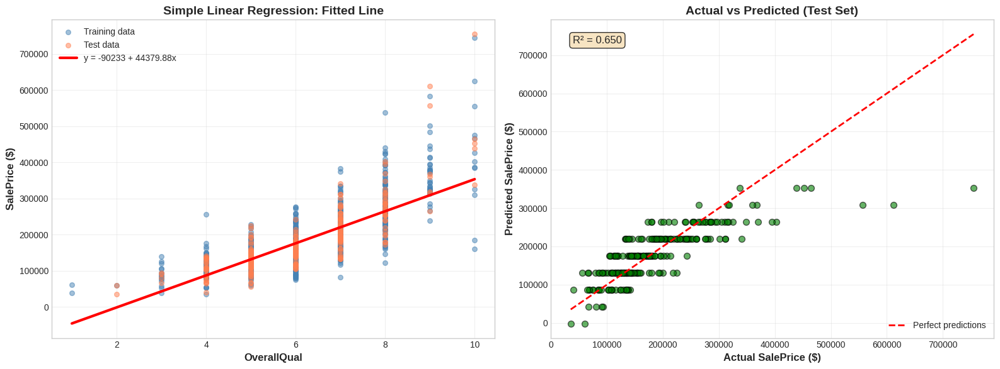

📊 Interpretation:
   • LEFT: Regression line shows the linear relationship
   • RIGHT: Points close to red line = good predictions
   • Scatter around line = unexplained variance


In [12]:
# ==================== VISUALIZE SIMPLE LINEAR REGRESSION ====================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Regression line with data points
axes[0].scatter(X_train_simple, y_train, alpha=0.5, s=30, label='Training data', color='steelblue')
axes[0].scatter(X_test_simple, y_test, alpha=0.5, s=30, label='Test data', color='coral')

# Plot regression line
x_line = np.linspace(X_train_simple.min(), X_train_simple.max(), 100).reshape(-1, 1)
y_line = simple_lr.predict(x_line)
axes[0].plot(x_line, y_line, 'r-', linewidth=3, label=f'y = {intercept:.0f} + {slope:.2f}x')

axes[0].set_xlabel(best_feature, fontsize=12, fontweight='bold')
axes[0].set_ylabel('SalePrice ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Simple Linear Regression: Fitted Line', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=10)
axes[0].grid(alpha=0.3)

# Plot 2: Actual vs Predicted
axes[1].scatter(y_test, y_pred_test_simple, alpha=0.6, s=50, color='green', edgecolor='black')
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
             'r--', linewidth=2, label='Perfect predictions')

axes[1].set_xlabel('Actual SalePrice ($)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Predicted SalePrice ($)', fontsize=12, fontweight='bold')
axes[1].set_title('Actual vs Predicted (Test Set)', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(alpha=0.3)

# Add R² to plot
axes[1].text(0.05, 0.95, f'R² = {test_r2:.3f}', 
            transform=axes[1].transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.show()

print("📊 Interpretation:")
print("   • LEFT: Regression line shows the linear relationship")
print("   • RIGHT: Points close to red line = good predictions")
print("   • Scatter around line = unexplained variance")

CHECKING LINEAR REGRESSION ASSUMPTIONS (LINE)


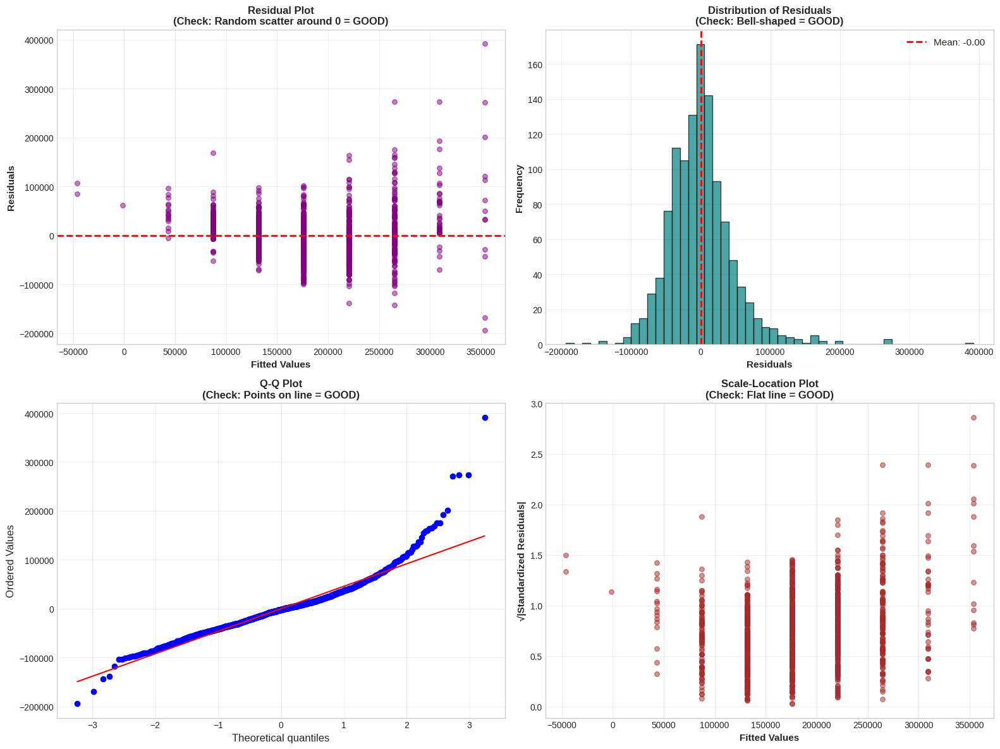


📊 Assumption Check Results:

1️⃣ LINEARITY:
   • Check residual plot: Should show random scatter around 0
   • If pattern exists → relationship is non-linear

2️⃣ INDEPENDENCE:
   • Assume OK for cross-sectional housing data
   • Would be violated for time-series data

3️⃣ NORMALITY:
   • Residual skewness: 1.358 (close to 0 = good)
   • Residual kurtosis: 7.368 (close to 0 = good)
   • Q-Q plot: Points should follow diagonal line

4️⃣ HOMOSCEDASTICITY (Equal Variance):
   • Residual plot should show constant spread (no funnel shape)
   • Scale-location plot should be flat

✅ Overall Assessment:
   ⚠️ Some assumptions violated - consider:
      • Log transformation of target variable
      • Polynomial features
      • Tree-based models (no assumptions needed)


In [13]:
# ==================== CHECK ASSUMPTIONS ====================

print("="*60)
print("CHECKING LINEAR REGRESSION ASSUMPTIONS (LINE)")
print("="*60)

# Calculate residuals
residuals = y_train - y_pred_train_simple

# Create diagnostic plots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Residual Plot (Linearity & Homoscedasticity)
axes[0, 0].scatter(y_pred_train_simple, residuals, alpha=0.5, s=30, color='purple')
axes[0, 0].axhline(y=0, color='r', linestyle='--', linewidth=2)
axes[0, 0].set_xlabel('Fitted Values', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Residuals', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Residual Plot\n(Check: Random scatter around 0 = GOOD)', fontsize=12, fontweight='bold')
axes[0, 0].grid(alpha=0.3)

# 2. Histogram of Residuals (Normality)
axes[0, 1].hist(residuals, bins=50, edgecolor='black', alpha=0.7, color='teal')
axes[0, 1].axvline(residuals.mean(), color='r', linestyle='--', linewidth=2, label=f'Mean: {residuals.mean():.2f}')
axes[0, 1].set_xlabel('Residuals', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Frequency', fontsize=11, fontweight='bold')
axes[0, 1].set_title('Distribution of Residuals\n(Check: Bell-shaped = GOOD)', fontsize=12, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# 3. Q-Q Plot (Normality)
stats.probplot(residuals, dist="norm", plot=axes[1, 0])
axes[1, 0].set_title('Q-Q Plot\n(Check: Points on line = GOOD)', fontsize=12, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# 4. Scale-Location Plot (Homoscedasticity)
standardized_residuals = np.sqrt(np.abs((residuals - residuals.mean()) / residuals.std()))
axes[1, 1].scatter(y_pred_train_simple, standardized_residuals, alpha=0.5, s=30, color='brown')
axes[1, 1].set_xlabel('Fitted Values', fontsize=11, fontweight='bold')
axes[1, 1].set_ylabel('√|Standardized Residuals|', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Scale-Location Plot\n(Check: Flat line = GOOD)', fontsize=12, fontweight='bold')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Statistical tests
print("\n📊 Assumption Check Results:")
print("\n1️⃣ LINEARITY:")
print("   • Check residual plot: Should show random scatter around 0")
print("   • If pattern exists → relationship is non-linear")

print("\n2️⃣ INDEPENDENCE:")
print("   • Assume OK for cross-sectional housing data")
print("   • Would be violated for time-series data")

print("\n3️⃣ NORMALITY:")
residual_skew = stats.skew(residuals)
residual_kurt = stats.kurtosis(residuals)
print(f"   • Residual skewness: {residual_skew:.3f} (close to 0 = good)")
print(f"   • Residual kurtosis: {residual_kurt:.3f} (close to 0 = good)")
print("   • Q-Q plot: Points should follow diagonal line")

print("\n4️⃣ HOMOSCEDASTICITY (Equal Variance):")
print("   • Residual plot should show constant spread (no funnel shape)")
print("   • Scale-location plot should be flat")

print("\n✅ Overall Assessment:")
if abs(residual_skew) < 1 and abs(residual_kurt) < 3:
    print("   Assumptions are reasonably satisfied!")
else:
    print("   ⚠️ Some assumptions violated - consider:")
    print("      • Log transformation of target variable")
    print("      • Polynomial features")
    print("      • Tree-based models (no assumptions needed)")

<a id="section4"></a>
## 4. Multiple Linear Regression

---

### 4.1 From Simple to Multiple

**Simple Linear Regression** uses ONE feature:
$$y = \beta_0 + \beta_1 x_1$$

**Multiple Linear Regression** uses MANY features:
$$y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \beta_3 x_3 + ... + \beta_n x_n$$

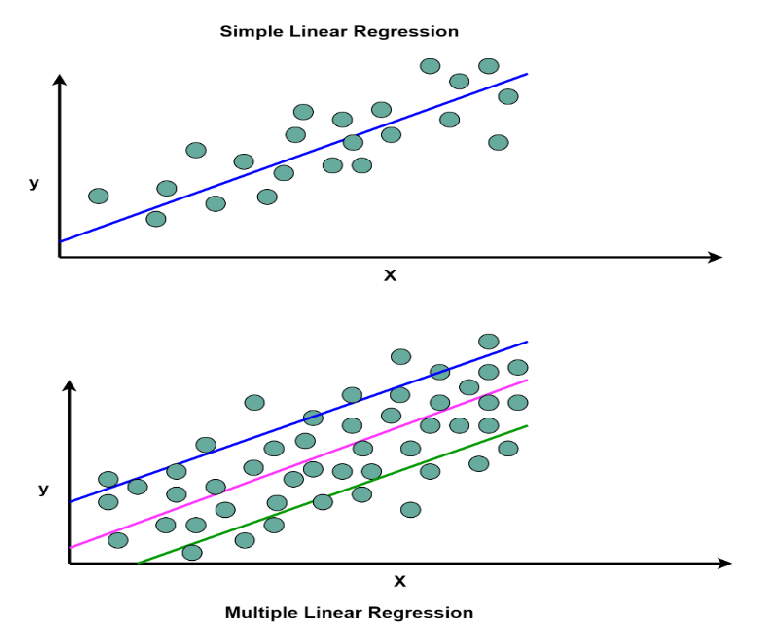

**Matrix Form:**
$$\mathbf{y} = \mathbf{X}\boldsymbol{\beta} + \boldsymbol{\epsilon}$$

Where:
- $\mathbf{y}$ = Target vector (n × 1)
- $\mathbf{X}$ = Feature matrix (n × p)
- $\boldsymbol{\beta}$ = Coefficient vector (p × 1)
- $\boldsymbol{\epsilon}$ = Error vector (n × 1)

---

### 4.2 Why Use Multiple Features?

**Real-world problems are multivariate!**

House prices depend on:
- Living area
- Number of bedrooms
- Location
- Age
- Quality
- ... and much more!

**Advantages:**
✅ Captures complex relationships
✅ Controls for confounding variables
✅ Better predictions than single feature
✅ More realistic modeling

**Challenges:**
⚠️ Multicollinearity (features correlated with each other)
⚠️ Overfitting (too many features)
⚠️ Harder to interpret
⚠️ Curse of dimensionality

---

### 4.3 The Multicollinearity Problem

**What is it?**
When two or more features are highly correlated with each other.

**Example:**
- `GarageArea` and `GarageCars` are highly correlated
- If garage fits more cars → it has more area (duh!)

**Why is it bad?**
- Coefficients become unstable (small data changes → big coefficient changes)
- Hard to determine individual feature effects
- Inflates standard errors
- Makes interpretation impossible

**How to detect:**
**Variance Inflation Factor (VIF):**

$$\text{VIF}_i = \frac{1}{1 - R_i^2}$$

Where $R_i^2$ is the R² from regressing feature $i$ on all other features.

**Rule of Thumb:**
- VIF < 5: No problem
- VIF 5-10: Moderate correlation (be careful)
- VIF > 10: High multicollinearity (action needed!)

**Solutions:**
1. Remove one of the correlated features
2. Combine correlated features (e.g., average them)
3. Use regularization (Ridge, Lasso - next section!)
4. Use PCA (dimensionality reduction)

---

### 4.4 Feature Scaling Importance

**Linear regression is scale-sensitive!**

**Example:**
- Feature A: Living area (500-5000 sq ft)
- Feature B: Number of bedrooms (1-5)

Without scaling:
- Small change in living area → big price change
- Bedroom coefficient appears tiny even if important!

**Solution: Standardization (Z-score)**

$$x_{\text{scaled}} = \frac{x - \mu}{\sigma}$$

Result: Mean = 0, Std = 1

**Benefits:**
✅ Coefficients directly comparable
✅ Faster convergence in optimization
✅ Better numerical stability
✅ Regularization works properly (Ridge/Lasso)

---

### 4.5 Coefficient Interpretation in Multiple Regression

**Each coefficient represents the change in y for a 1-unit change in that feature, HOLDING ALL OTHER FEATURES CONSTANT.**

**Example:**
$$\text{Price} = 50000 + 100 \times \text{Area} + 5000 \times \text{Bedrooms}$$

**Interpretation:**
- $\beta_{\text{Area}}$ = 100: "Controlling for number of bedrooms, each additional sq ft adds $100"

- $\beta_{\text{Bedrooms}}$ = 5000: "Controlling for area, each additional bedroom adds $5,000"

**Key phrase: "Holding all else constant"**

This is why multicollinearity is bad - you CAN'T hold correlated features constant!

---

### 4.6 R² vs Adjusted R²

**R² (Coefficient of Determination):**
$$R^2 = 1 - \frac{\text{SS}_{\text{residual}}}{\text{SS}_{\text{total}}}$$

**Problem:** R² ALWAYS increases when you add more features (even random ones!)

**Adjusted R² (Penalizes Model Complexity):**
$$\text{Adjusted } R^2 = 1 - \frac{(1-R^2)(n-1)}{n-p-1}$$

Where:
- $n$ = number of samples
- $p$ = number of features

**Use Adjusted R² when comparing models with different numbers of features!**

---

Let's build our Multiple Linear Regression model! 🚀
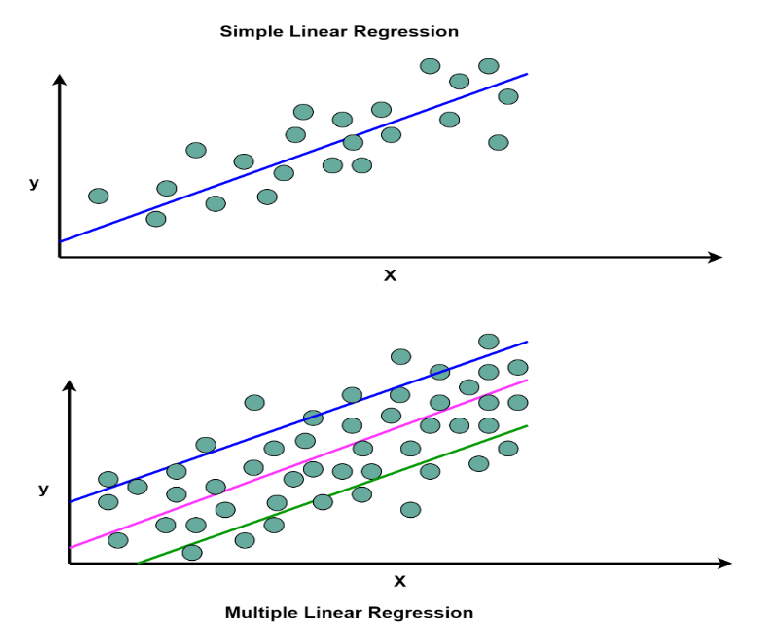

In [14]:
# ==================== FEATURE SCALING FOR LINEAR REGRESSION ====================

print("="*60)
print("FEATURE SCALING (STANDARDIZATION)")
print("="*60)

# Initialize scaler
scaler = StandardScaler()

# Fit on training data and transform both sets
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert back to DataFrame for easier handling
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

print(f"\n✅ Scaling complete using StandardScaler")
print(f"   Formula: (X - mean) / std")

print(f"\n📊 Before scaling (first feature: {X_train.columns[0]}):")
print(f"   • Mean: {X_train.iloc[:, 0].mean():.2f}")
print(f"   • Std: {X_train.iloc[:, 0].std():.2f}")

print(f"\n📊 After scaling (same feature):")
print(f"   • Mean: {X_train_scaled.iloc[:, 0].mean():.2f} (≈0)")
print(f"   • Std: {X_train_scaled.iloc[:, 0].std():.2f} (≈1)")

print(f"\n💡 All features now have mean=0 and std=1")
print(f"   This makes coefficients directly comparable!")

FEATURE SCALING (STANDARDIZATION)

✅ Scaling complete using StandardScaler
   Formula: (X - mean) / std

📊 Before scaling (first feature: OverallQual):
   • Mean: 6.12
   • Std: 1.37

📊 After scaling (same feature):
   • Mean: -0.00 (≈0)
   • Std: 1.00 (≈1)

💡 All features now have mean=0 and std=1
   This makes coefficients directly comparable!


In [15]:
# ==================== CHECK MULTICOLLINEARITY (VIF) ====================

print("\n" + "="*60)
print("MULTICOLLINEARITY CHECK: Variance Inflation Factor (VIF)")
print("="*60)

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X_train_scaled.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_scaled.values, i) 
                   for i in range(len(X_train_scaled.columns))]

# Sort by VIF
vif_data = vif_data.sort_values('VIF', ascending=False)

print(f"\n📊 VIF Interpretation:")
print(f"   • VIF < 5: No multicollinearity ✅")
print(f"   • VIF 5-10: Moderate multicollinearity ⚠️")
print(f"   • VIF > 10: High multicollinearity ❌")

print(f"\n🔍 VIF Results (Top 10 features):")
print(vif_data.head(10).to_string(index=False))

# Flag high VIF features
high_vif = vif_data[vif_data['VIF'] > 10]
if len(high_vif) > 0:
    print(f"\n⚠️ {len(high_vif)} features with high multicollinearity (VIF > 10):")
    for _, row in high_vif.iterrows():
        print(f"   • {row['Feature']}: VIF = {row['VIF']:.2f}")
    print(f"\n💡 Consider:")
    print(f"   • Removing one of the correlated features")
    print(f"   • Using Ridge regression (next section)")
else:
    print(f"\n✅ No severe multicollinearity detected!")


MULTICOLLINEARITY CHECK: Variance Inflation Factor (VIF)

📊 VIF Interpretation:
   • VIF < 5: No multicollinearity ✅
   • VIF 5-10: Moderate multicollinearity ⚠️
   • VIF > 10: High multicollinearity ❌

🔍 VIF Results (Top 10 features):
             Feature     VIF
   GarageType_Attchd 50.6198
   GarageType_Detchd 42.3093
  GarageType_BuiltIn 14.4092
  Neighborhood_NAmes 13.9363
Neighborhood_OldTown  9.4595
Neighborhood_CollgCr  8.2157
           YearBuilt  8.1255
Neighborhood_Edwards  7.7080
    Foundation_PConc  6.6022
           GrLivArea  6.1540

⚠️ 4 features with high multicollinearity (VIF > 10):
   • GarageType_Attchd: VIF = 50.62
   • GarageType_Detchd: VIF = 42.31
   • GarageType_BuiltIn: VIF = 14.41
   • Neighborhood_NAmes: VIF = 13.94

💡 Consider:
   • Removing one of the correlated features
   • Using Ridge regression (next section)


In [16]:
# ==================== MULTIPLE LINEAR REGRESSION ====================

print("\n" + "="*60)
print("MULTIPLE LINEAR REGRESSION")
print("="*60)

# Train model
mlr = LinearRegression()
mlr.fit(X_train_scaled, y_train)

# Make predictions
y_pred_train_mlr = mlr.predict(X_train_scaled)
y_pred_test_mlr = mlr.predict(X_test_scaled)

# Calculate metrics
train_rmse_mlr = np.sqrt(mean_squared_error(y_train, y_pred_train_mlr))
test_rmse_mlr = np.sqrt(mean_squared_error(y_test, y_pred_test_mlr))
train_r2_mlr = r2_score(y_train, y_pred_train_mlr)
test_r2_mlr = r2_score(y_test, y_pred_test_mlr)
train_mae_mlr = mean_absolute_error(y_train, y_pred_train_mlr)
test_mae_mlr = mean_absolute_error(y_test, y_pred_test_mlr)

# Adjusted R²
n_train = len(y_train)
p = X_train_scaled.shape[1]
adj_r2_train = 1 - (1 - train_r2_mlr) * (n_train - 1) / (n_train - p - 1)
n_test = len(y_test)
adj_r2_test = 1 - (1 - test_r2_mlr) * (n_test - 1) / (n_test - p - 1)

print(f"\n📐 Model trained with {p} features")

print("\n" + "="*60)
print("MODEL PERFORMANCE")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_mlr:,.2f}")
print(f"   • MAE: ${train_mae_mlr:,.2f}")
print(f"   • R²: {train_r2_mlr:.4f}")
print(f"   • Adjusted R²: {adj_r2_train:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_mlr:,.2f}")
print(f"   • MAE: ${test_mae_mlr:,.2f}")
print(f"   • R²: {test_r2_mlr:.4f}")
print(f"   • Adjusted R²: {adj_r2_test:.4f}")

# Comparison with Simple Linear Regression
print(f"\n📊 Improvement over Simple Linear Regression:")
print(f"   • RMSE: ${test_rmse:,.2f} → ${test_rmse_mlr:,.2f} (${test_rmse - test_rmse_mlr:,.2f} better)")
print(f"   • R²: {test_r2:.4f} → {test_r2_mlr:.4f} ({(test_r2_mlr - test_r2)*100:+.2f}% points)")

if test_rmse_mlr < test_rmse:
    improvement = ((test_rmse - test_rmse_mlr) / test_rmse) * 100
    print(f"\n✅ Multiple features give {improvement:.1f}% error reduction!")


MULTIPLE LINEAR REGRESSION

📐 Model trained with 49 features

MODEL PERFORMANCE

🎯 Training Set:
   • RMSE: $32,502.14
   • MAE: $20,450.95
   • R²: 0.8229
   • Adjusted R²: 0.8151

🎯 Test Set:
   • RMSE: $35,108.10
   • MAE: $21,550.91
   • R²: 0.8393
   • Adjusted R²: 0.8068

📊 Improvement over Simple Linear Regression:
   • RMSE: $51,778.63 → $35,108.10 ($16,670.53 better)
   • R²: 0.6505 → 0.8393 (+18.88% points)

✅ Multiple features give 32.2% error reduction!



FEATURE IMPORTANCE: COEFFICIENT ANALYSIS

🔝 Top 15 Most Important Features (by absolute coefficient):
             Feature  Coefficient
   GarageType_Attchd   18453.7472
           GrLivArea   18316.3633
         OverallQual   15270.8483
Neighborhood_NridgHt   13258.0457
   GarageType_Detchd   12909.7485
Neighborhood_NoRidge   12358.0063
  GarageType_BuiltIn   10455.1308
            BsmtQual   10133.9619
Neighborhood_StoneBr    8912.1867
Neighborhood_Crawfor    8879.9792
         KitchenQual    7830.5557
          GarageCars    6984.5087
Neighborhood_Somerst    6983.4477
Neighborhood_CollgCr    6424.3558
  Neighborhood_NAmes    6169.8260

💡 Interpretation (for scaled features):
   • Positive coefficient → increases price
   • Negative coefficient → decreases price
   • Larger |coefficient| → more important
   • Since features are scaled, coefficients are comparable!


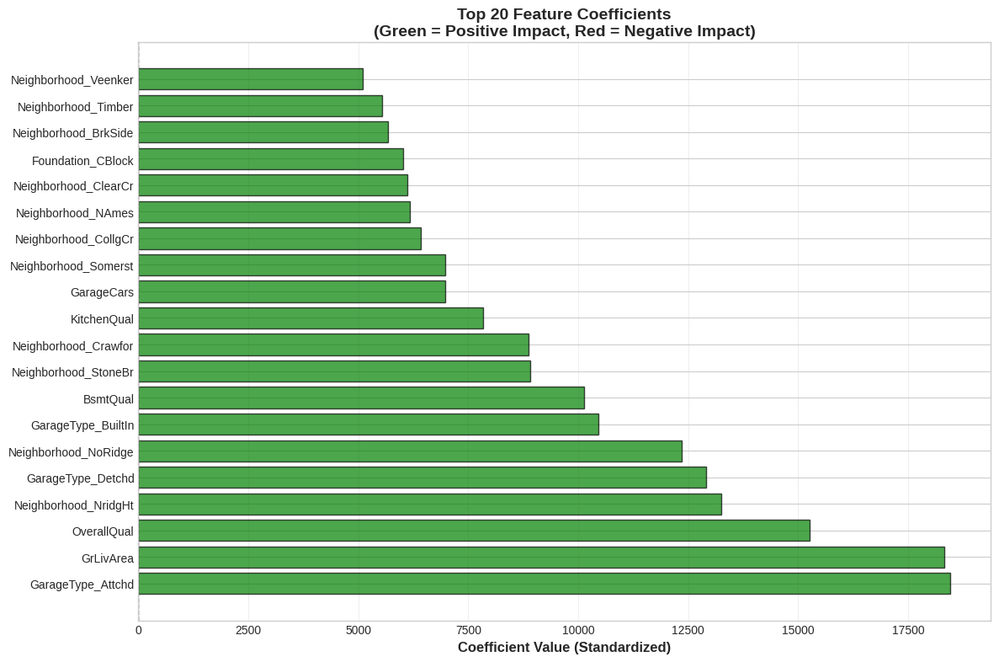


📊 Intercept: $181,441.54
   (This is the mean of y_train since features are centered)


In [17]:
# ==================== ANALYZE COEFFICIENTS ====================

print("\n" + "="*60)
print("FEATURE IMPORTANCE: COEFFICIENT ANALYSIS")
print("="*60)

# Create coefficient dataframe
coef_df = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Coefficient': mlr.coef_
})

# Sort by absolute value
coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])
coef_df = coef_df.sort_values('Abs_Coefficient', ascending=False)

print(f"\n🔝 Top 15 Most Important Features (by absolute coefficient):")
print(coef_df.head(15)[['Feature', 'Coefficient']].to_string(index=False))

print(f"\n💡 Interpretation (for scaled features):")
print(f"   • Positive coefficient → increases price")
print(f"   • Negative coefficient → decreases price")
print(f"   • Larger |coefficient| → more important")
print(f"   • Since features are scaled, coefficients are comparable!")

# Visualize top coefficients
fig, ax = plt.subplots(figsize=(12, 8))

top_n = 20
top_features = coef_df.head(top_n)

colors = ['green' if x > 0 else 'red' for x in top_features['Coefficient']]
ax.barh(range(top_n), top_features['Coefficient'], color=colors, alpha=0.7, edgecolor='black')
ax.set_yticks(range(top_n))
ax.set_yticklabels(top_features['Feature'])
ax.set_xlabel('Coefficient Value (Standardized)', fontsize=12, fontweight='bold')
ax.set_title(f'Top {top_n} Feature Coefficients\n(Green = Positive Impact, Red = Negative Impact)', 
             fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linestyle='--', linewidth=1)
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\n📊 Intercept: ${mlr.intercept_:,.2f}")
print(f"   (This is the mean of y_train since features are centered)")

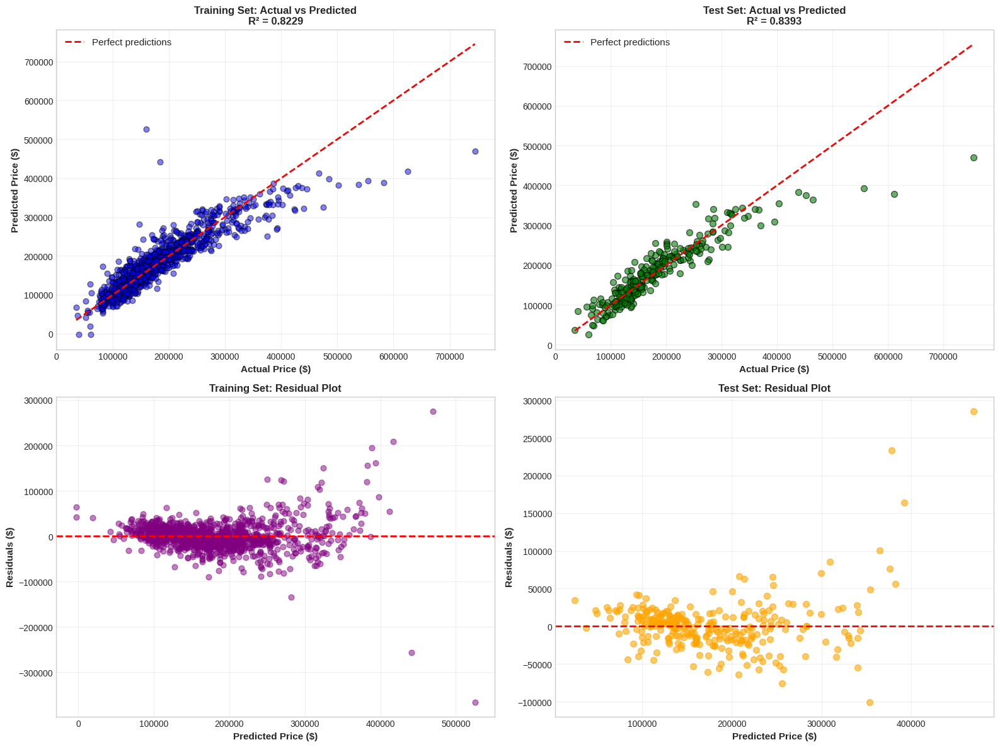

📊 What to look for:
   • Top row: Points close to diagonal = good predictions
   • Bottom row: Random scatter around 0 = assumptions satisfied
   • Funnel shape in residuals = heteroscedasticity (unequal variance)


In [18]:
# ==================== VISUALIZE MULTIPLE LINEAR REGRESSION RESULTS ====================

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Actual vs Predicted (Training)
axes[0, 0].scatter(y_train, y_pred_train_mlr, alpha=0.5, s=40, color='blue', edgecolor='black')
axes[0, 0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 
                'r--', linewidth=2, label='Perfect predictions')
axes[0, 0].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[0, 0].set_title(f'Training Set: Actual vs Predicted\nR² = {train_r2_mlr:.4f}', 
                     fontsize=12, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Plot 2: Actual vs Predicted (Test)
axes[0, 1].scatter(y_test, y_pred_test_mlr, alpha=0.6, s=50, color='green', edgecolor='black')
axes[0, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
                'r--', linewidth=2, label='Perfect predictions')
axes[0, 1].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[0, 1].set_title(f'Test Set: Actual vs Predicted\nR² = {test_r2_mlr:.4f}', 
                     fontsize=12, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Plot 3: Residuals (Training)
residuals_train_mlr = y_train - y_pred_train_mlr
axes[1, 0].scatter(y_pred_train_mlr, residuals_train_mlr, alpha=0.5, s=40, color='purple')
axes[1, 0].axhline(y=0, color='r', linestyle='--', linewidth=2)
axes[1, 0].set_xlabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('Residuals ($)', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Training Set: Residual Plot', fontsize=12, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# Plot 4: Residuals (Test)
residuals_test_mlr = y_test - y_pred_test_mlr
axes[1, 1].scatter(y_pred_test_mlr, residuals_test_mlr, alpha=0.6, s=50, color='orange')
axes[1, 1].axhline(y=0, color='r', linestyle='--', linewidth=2)
axes[1, 1].set_xlabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[1, 1].set_ylabel('Residuals ($)', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Test Set: Residual Plot', fontsize=12, fontweight='bold')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("📊 What to look for:")
print("   • Top row: Points close to diagonal = good predictions")
print("   • Bottom row: Random scatter around 0 = assumptions satisfied")
print("   • Funnel shape in residuals = heteroscedasticity (unequal variance)")

**Solution: REGULARIZATION**

Add a penalty term to the loss function to discourage large coefficients.

---

### 5.2 Ridge Regression (L2 Regularization)

**Loss Function:**
$$\text{Loss} = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \alpha \sum_{j=1}^{p} \beta_j^2$$

**Components:**
- First term: Standard MSE (fit the data)
- Second term: L2 penalty (keep coefficients small)
- $\alpha$: Regularization strength (hyperparameter)

**Key Properties:**

| Aspect | Behavior |
|--------|----------|
| **Coefficient Shrinkage** | Shrinks ALL coefficients toward zero |
| **Feature Selection** | Does NOT remove features (coefficients never exactly 0) |
| **Multicollinearity** | Handles highly correlated features well |
| **When $\alpha$ = 0** | Becomes OLS (no regularization) |
| **When $\alpha$ → ∞** | All coefficients → 0 |

**Geometric Intuition:**

Imagine coefficients as a vector. Ridge constrains this vector to lie within a circle. The larger the $\alpha$, the smaller the circle.

**When to use:**
✅ Many correlated features
✅ Want to keep all features
✅ Prevent overfitting
✅ Multicollinearity is present

---

### 5.3 Lasso Regression (L1 Regularization)

**Loss Function:**
$$\text{Loss} = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \alpha \sum_{j=1}^{p} |\beta_j|$$

**Key Difference from Ridge:**
Uses absolute value (|β|) instead of squared (β²)

**Key Properties:**

| Aspect | Behavior |
|--------|----------|
| **Coefficient Shrinkage** | Shrinks coefficients AND can set them to exactly 0 |
| **Feature Selection** | Automatic feature selection (sparse models) |
| **Multicollinearity** | Picks one feature from correlated group, zeros others |
| **When $\alpha$ = 0** | Becomes OLS |
| **When $\alpha$ → ∞** | All coefficients → 0 |

**Geometric Intuition:**

Lasso constrains coefficients to lie within a diamond shape. The diamond's corners touch axes, making some coefficients exactly zero.

**When to use:**
✅ Want automatic feature selection
✅ Believe many features are irrelevant
✅ Need sparse model (interpretability)
✅ High-dimensional data (p > n)

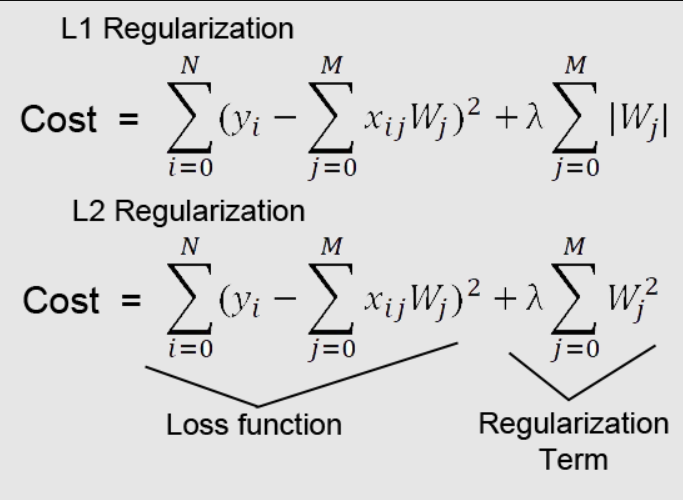

---

### 5.4 ElasticNet (L1 + L2)

**Loss Function:**
$$\text{Loss} = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \alpha \left( \rho \sum_{j=1}^{p} |\beta_j| + \frac{1-\rho}{2} \sum_{j=1}^{p} \beta_j^2 \right)$$

**Parameters:**
- $\alpha$: Overall regularization strength
- $\rho$ (l1_ratio in sklearn): Balance between L1 and L2
  - $\rho$ = 0: Pure Ridge
  - $\rho$ = 1: Pure Lasso
  - 0 < $\rho$ < 1: Mix of both

**Key Properties:**

| Aspect | Behavior |
|--------|----------|
| **Combines Best of Both** | Feature selection (L1) + handles multicollinearity (L2) |
| **Grouped Features** | Can select multiple correlated features (unlike Lasso) |
| **Stability** | More stable than Lasso when features are correlated |

**When to use:**
✅ Have many correlated features
✅ Want feature selection
✅ Lasso is too aggressive (removes too many features)
✅ Don't know whether Ridge or Lasso is better (try both!)

---

### 5.5 Ridge vs Lasso vs ElasticNet: Quick Comparison

| Aspect | Ridge (L2) | Lasso (L1) | ElasticNet |
|--------|-----------|-----------|------------|
| **Penalty** | Sum of squared coefficients | Sum of absolute coefficients | Both L1 + L2 |
| **Coefficients** | Shrinks toward 0 | Can be exactly 0 | Can be exactly 0 |
| **Feature Selection** | ❌ No | ✅ Yes | ✅ Yes |
| **Handles Multicollinearity** | ✅ Excellent | ⚠️ Picks one, drops others | ✅ Good |
| **Correlated Features** | Keeps all | Picks one arbitrarily | Keeps group |
| **Interpretability** | All features matter | Sparse model | Sparse model |
| **Computational Cost** | Fast | Fast | Slightly slower |
| **Best For** | Many features, all matter | Many irrelevant features | Mixed situation |

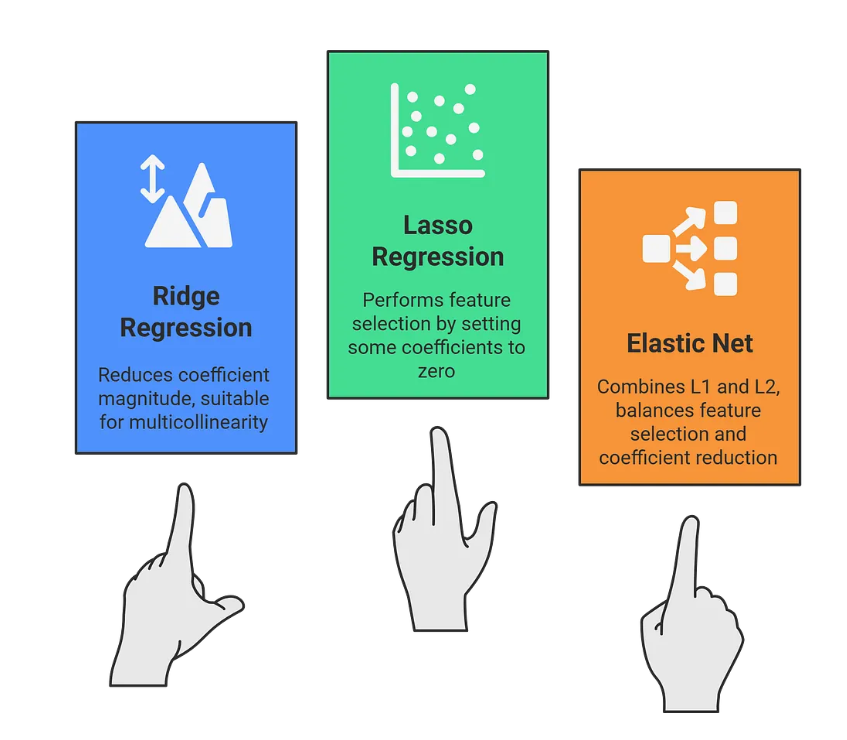

---

### 5.6 The Alpha Parameter: Regularization Strength

**α = 0:**
- No regularization
- Same as OLS
- High variance, low bias
- Overfits

**α = small (0.01, 0.1):**
- Gentle regularization
- Coefficients slightly shrunk
- Good balance

**α = medium (1, 10):**
- Moderate regularization
- Significant shrinkage
- May underfit

**α = large (100, 1000):**
- Strong regularization
- Coefficients almost zero
- Underfits badly

**How to choose α?**
Use **Cross-Validation**! (We'll do this next)

---

### 5.7 Regularization Path

The "regularization path" shows how coefficients change as α increases.

**What you'll see:**
- Ridge: All coefficients gradually shrink toward 0
- Lasso: Coefficients hit exactly 0 at different α values
- ElasticNet: Mix of both behaviors

**This visualization helps you understand:**
- Which features are most important (survive high α)
- At what α does feature selection occur (Lasso/ElasticNet)
- How stable the model is to α changes

---

Let's implement all three! 🚀
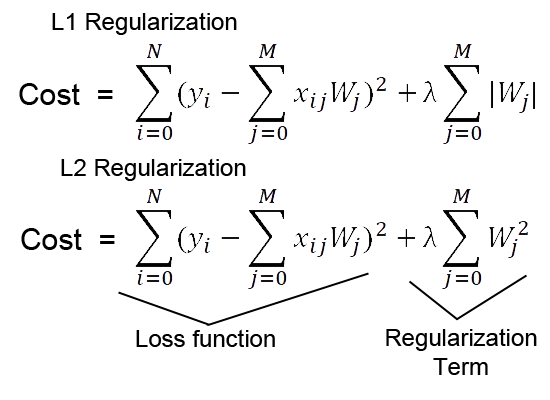
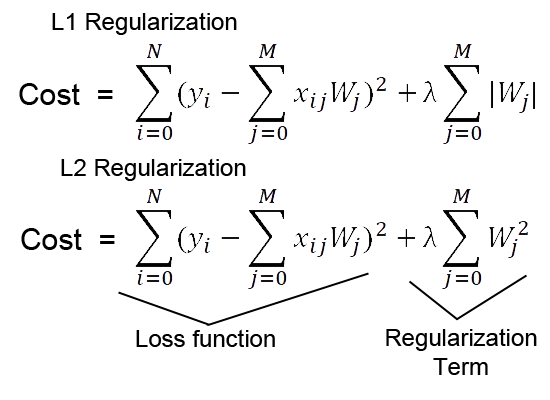

In [19]:
# ==================== RIDGE REGRESSION ====================

print("="*60)
print("RIDGE REGRESSION (L2 REGULARIZATION)")
print("="*60)

# We'll try different alpha values
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
ridge_results = []

for alpha in alphas:
    # Train Ridge
    ridge = Ridge(alpha=alpha, random_state=RANDOM_STATE)
    ridge.fit(X_train_scaled, y_train)
    
    # Predictions
    y_pred_train_ridge = ridge.predict(X_train_scaled)
    y_pred_test_ridge = ridge.predict(X_test_scaled)
    
    # Metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train_ridge))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test_ridge))
    train_r2 = r2_score(y_train, y_pred_train_ridge)
    test_r2 = r2_score(y_test, y_pred_test_ridge)
    
    ridge_results.append({
        'alpha': alpha,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_r2': train_r2,
        'test_r2': test_r2
    })

# Convert to DataFrame
ridge_df = pd.DataFrame(ridge_results)

print("\n📊 Ridge Performance for Different Alpha Values:")
print(ridge_df.to_string(index=False))

# Find best alpha
best_ridge = ridge_df.loc[ridge_df['test_rmse'].idxmin()]
print(f"\n✅ Best Alpha: {best_ridge['alpha']}")
print(f"   • Test RMSE: ${best_ridge['test_rmse']:,.2f}")
print(f"   • Test R²: {best_ridge['test_r2']:.4f}")

RIDGE REGRESSION (L2 REGULARIZATION)

📊 Ridge Performance for Different Alpha Values:
    alpha  train_rmse  test_rmse  train_r2  test_r2
   0.0010  32502.1446 35108.0978    0.8229   0.8393
   0.0100  32502.1447 35108.1205    0.8229   0.8393
   0.1000  32502.1568 35108.3508    0.8229   0.8393
   1.0000  32503.2032 35110.9235    0.8229   0.8393
  10.0000  32541.3504 35147.1837    0.8225   0.8389
 100.0000  32791.7790 35534.9640    0.8197   0.8354
1000.0000  35025.7929 39145.1169    0.7943   0.8002

✅ Best Alpha: 0.001
   • Test RMSE: $35,108.10
   • Test R²: 0.8393


In [20]:
# ==================== LASSO REGRESSION ====================

print("\n" + "="*60)
print("LASSO REGRESSION (L1 REGULARIZATION)")
print("="*60)

lasso_results = []

for alpha in alphas:
    # Train Lasso
    lasso = Lasso(alpha=alpha, random_state=RANDOM_STATE, max_iter=10000)
    lasso.fit(X_train_scaled, y_train)
    
    # Predictions
    y_pred_train_lasso = lasso.predict(X_train_scaled)
    y_pred_test_lasso = lasso.predict(X_test_scaled)
    
    # Metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train_lasso))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test_lasso))
    train_r2 = r2_score(y_train, y_pred_train_lasso)
    test_r2 = r2_score(y_test, y_pred_test_lasso)
    
    # Count non-zero coefficients (feature selection)
    n_features_selected = np.sum(lasso.coef_ != 0)
    
    lasso_results.append({
        'alpha': alpha,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_r2': train_r2,
        'test_r2': test_r2,
        'features_selected': n_features_selected
    })

lasso_df = pd.DataFrame(lasso_results)

print("\n📊 Lasso Performance for Different Alpha Values:")
print(lasso_df.to_string(index=False))

# Find best alpha
best_lasso = lasso_df.loc[lasso_df['test_rmse'].idxmin()]
print(f"\n✅ Best Alpha: {best_lasso['alpha']}")
print(f"   • Test RMSE: ${best_lasso['test_rmse']:,.2f}")
print(f"   • Test R²: {best_lasso['test_r2']:.4f}")
print(f"   • Features Selected: {int(best_lasso['features_selected'])}/{X_train_scaled.shape[1]}")


LASSO REGRESSION (L1 REGULARIZATION)

📊 Lasso Performance for Different Alpha Values:
    alpha  train_rmse  test_rmse  train_r2  test_r2  features_selected
   0.0010  32502.1446 35108.0947    0.8229   0.8393                 49
   0.0100  32502.1446 35108.0894    0.8229   0.8393                 49
   0.1000  32502.1449 35108.0366    0.8229   0.8393                 49
   1.0000  32502.1739 35107.5204    0.8229   0.8393                 49
  10.0000  32504.8421 35102.7291    0.8229   0.8394                 49
 100.0000  32604.4284 35107.7305    0.8218   0.8393                 47
1000.0000  33151.1301 35573.3244    0.8157   0.8350                 32

✅ Best Alpha: 10.0
   • Test RMSE: $35,102.73
   • Test R²: 0.8394
   • Features Selected: 49/49


In [21]:
# ==================== ELASTICNET REGRESSION ====================

print("\n" + "="*60)
print("ELASTICNET REGRESSION (L1 + L2 REGULARIZATION)")
print("="*60)

# Try different l1_ratios (balance between L1 and L2)
l1_ratios = [0.1, 0.3, 0.5, 0.7, 0.9]
elasticnet_results = []

for l1_ratio in l1_ratios:
    for alpha in [0.001, 0.01, 0.1, 1, 10]:
        # Train ElasticNet
        elasticnet = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, 
                                random_state=RANDOM_STATE, max_iter=10000)
        elasticnet.fit(X_train_scaled, y_train)
        
        # Predictions
        y_pred_test_en = elasticnet.predict(X_test_scaled)
        
        # Metrics
        test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test_en))
        test_r2 = r2_score(y_test, y_pred_test_en)
        n_features = np.sum(elasticnet.coef_ != 0)
        
        elasticnet_results.append({
            'alpha': alpha,
            'l1_ratio': l1_ratio,
            'test_rmse': test_rmse,
            'test_r2': test_r2,
            'features_selected': n_features
        })

elasticnet_df = pd.DataFrame(elasticnet_results)

# Find best combination
best_en = elasticnet_df.loc[elasticnet_df['test_rmse'].idxmin()]

print("\n📊 Top 10 ElasticNet Configurations:")
print(elasticnet_df.nsmallest(10, 'test_rmse').to_string(index=False))

print(f"\n✅ Best Configuration:")
print(f"   • Alpha: {best_en['alpha']}")
print(f"   • L1 Ratio: {best_en['l1_ratio']}")
print(f"   • Test RMSE: ${best_en['test_rmse']:,.2f}")
print(f"   • Test R²: {best_en['test_r2']:.4f}")
print(f"   • Features Selected: {int(best_en['features_selected'])}/{X_train_scaled.shape[1]}")

print(f"\n💡 Interpretation:")
print(f"   • L1 ratio = {best_en['l1_ratio']:.1f} means:")
print(f"     - {best_en['l1_ratio']*100:.0f}% Lasso (L1) penalty")
print(f"     - {(1-best_en['l1_ratio'])*100:.0f}% Ridge (L2) penalty")


ELASTICNET REGRESSION (L1 + L2 REGULARIZATION)

📊 Top 10 ElasticNet Configurations:
 alpha  l1_ratio  test_rmse  test_r2  features_selected
0.0010    0.9000 35108.3939   0.8393                 49
0.0010    0.7000 35109.0192   0.8393                 49
0.0010    0.5000 35109.6775   0.8393                 49
0.0010    0.3000 35110.3662   0.8393                 49
0.0010    0.1000 35111.0827   0.8393                 49
0.0100    0.9000 35111.4468   0.8393                 49
0.0100    0.7000 35119.8048   0.8392                 49
0.0100    0.5000 35129.2804   0.8391                 49
0.0100    0.3000 35139.2475   0.8390                 49
0.0100    0.1000 35149.4242   0.8389                 49

✅ Best Configuration:
   • Alpha: 0.001
   • L1 Ratio: 0.9
   • Test RMSE: $35,108.39
   • Test R²: 0.8393
   • Features Selected: 49/49

💡 Interpretation:
   • L1 ratio = 0.9 means:
     - 90% Lasso (L1) penalty
     - 10% Ridge (L2) penalty



MODEL COMPARISON: OLS vs Ridge vs Lasso vs ElasticNet

📊 Final Comparison:
            Model  Train_RMSE  Test_RMSE  Test_R2  Features_Used
OLS (Multiple LR)  32502.1446 35108.0953   0.8393             49
            Ridge  32502.1446 35108.0978   0.8393             49
            Lasso  32504.8421 35102.7291   0.8394             49
       ElasticNet  32502.1612 35108.3939   0.8393             49

🏆 WINNER: Lasso
   • Test RMSE: $35,102.73
   • Test R²: 0.8394
   • Features Used: 49


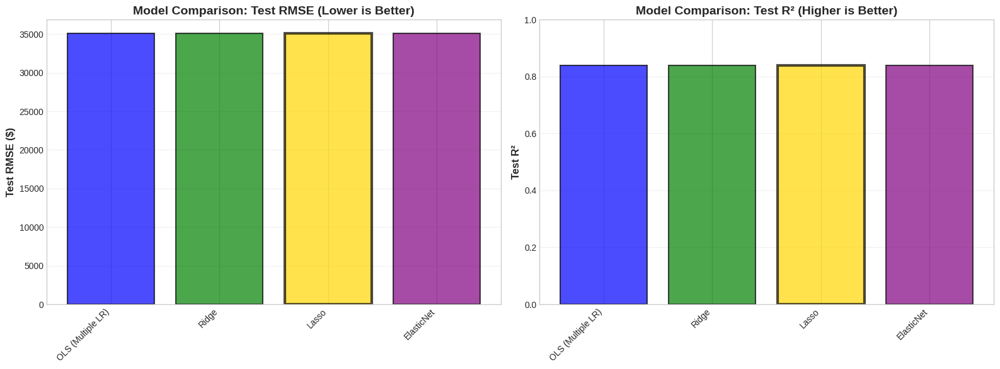

In [22]:
# ==================== COMPARE ALL REGULARIZED MODELS ====================

print("\n" + "="*60)
print("MODEL COMPARISON: OLS vs Ridge vs Lasso vs ElasticNet")
print("="*60)

# Train best models with optimal hyperparameters
best_ridge_model = Ridge(alpha=best_ridge['alpha'], random_state=RANDOM_STATE)
best_ridge_model.fit(X_train_scaled, y_train)

best_lasso_model = Lasso(alpha=best_lasso['alpha'], random_state=RANDOM_STATE, max_iter=10000)
best_lasso_model.fit(X_train_scaled, y_train)

best_en_model = ElasticNet(alpha=best_en['alpha'], l1_ratio=best_en['l1_ratio'], 
                           random_state=RANDOM_STATE, max_iter=10000)
best_en_model.fit(X_train_scaled, y_train)

# Create comparison table
comparison = pd.DataFrame({
    'Model': ['OLS (Multiple LR)', 'Ridge', 'Lasso', 'ElasticNet'],
    'Train_RMSE': [
        train_rmse_mlr,
        np.sqrt(mean_squared_error(y_train, best_ridge_model.predict(X_train_scaled))),
        np.sqrt(mean_squared_error(y_train, best_lasso_model.predict(X_train_scaled))),
        np.sqrt(mean_squared_error(y_train, best_en_model.predict(X_train_scaled)))
    ],
    'Test_RMSE': [
        test_rmse_mlr,
        best_ridge['test_rmse'],
        best_lasso['test_rmse'],
        best_en['test_rmse']
    ],
    'Test_R2': [
        test_r2_mlr,
        best_ridge['test_r2'],
        best_lasso['test_r2'],
        best_en['test_r2']
    ],
    'Features_Used': [
        X_train_scaled.shape[1],
        X_train_scaled.shape[1],
        int(best_lasso['features_selected']),
        int(best_en['features_selected'])
    ]
})

print("\n📊 Final Comparison:")
print(comparison.to_string(index=False))

# Find best model
best_model_idx = comparison['Test_RMSE'].idxmin()
best_model_name = comparison.loc[best_model_idx, 'Model']

print(f"\n🏆 WINNER: {best_model_name}")
print(f"   • Test RMSE: ${comparison.loc[best_model_idx, 'Test_RMSE']:,.2f}")
print(f"   • Test R²: {comparison.loc[best_model_idx, 'Test_R2']:.4f}")
print(f"   • Features Used: {int(comparison.loc[best_model_idx, 'Features_Used'])}")

# Visualize comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: RMSE Comparison
x_pos = np.arange(len(comparison))
axes[0].bar(x_pos, comparison['Test_RMSE'], alpha=0.7, color=['blue', 'green', 'red', 'purple'], 
            edgecolor='black', linewidth=1.5)
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(comparison['Model'], rotation=45, ha='right')
axes[0].set_ylabel('Test RMSE ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Model Comparison: Test RMSE (Lower is Better)', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

# Highlight best
best_bar = axes[0].patches[best_model_idx]
best_bar.set_facecolor('gold')
best_bar.set_edgecolor('black')
best_bar.set_linewidth(3)

# Plot 2: R² Comparison
axes[1].bar(x_pos, comparison['Test_R2'], alpha=0.7, color=['blue', 'green', 'red', 'purple'], 
            edgecolor='black', linewidth=1.5)
axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(comparison['Model'], rotation=45, ha='right')
axes[1].set_ylabel('Test R²', fontsize=12, fontweight='bold')
axes[1].set_title('Model Comparison: Test R² (Higher is Better)', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
axes[1].set_ylim([0, 1])

# Highlight best
best_bar2 = axes[1].patches[best_model_idx]
best_bar2.set_facecolor('gold')
best_bar2.set_edgecolor('black')
best_bar2.set_linewidth(3)

plt.tight_layout()
plt.show()


REGULARIZATION PATH: How Coefficients Change with Alpha


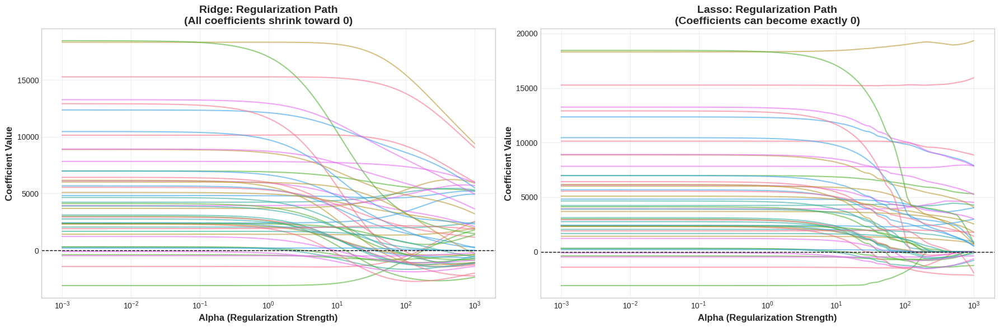


📊 Key Observations:

🔵 RIDGE (Left):
   • All coefficients gradually shrink toward 0
   • No coefficient ever becomes exactly 0
   • All features remain in the model
   • Smooth, continuous shrinkage

🔴 LASSO (Right):
   • Coefficients can become exactly 0
   • Features are eliminated as alpha increases
   • Automatic feature selection!
   • Important features survive longer

💡 Practical Insight:
   • Features that survive high alpha are most important
   • Lasso is more aggressive in feature elimination
   • Ridge keeps all features but reduces their impact


In [23]:
# ==================== REGULARIZATION PATH VISUALIZATION ====================

print("\n" + "="*60)
print("REGULARIZATION PATH: How Coefficients Change with Alpha")
print("="*60)

# Generate wider range of alphas for visualization
alphas_path = np.logspace(-3, 3, 100)

# Ridge path
ridge_coefs = []
for alpha in alphas_path:
    ridge = Ridge(alpha=alpha, random_state=RANDOM_STATE)
    ridge.fit(X_train_scaled, y_train)
    ridge_coefs.append(ridge.coef_)
ridge_coefs = np.array(ridge_coefs)

# Lasso path
lasso_coefs = []
for alpha in alphas_path:
    lasso = Lasso(alpha=alpha, random_state=RANDOM_STATE, max_iter=10000)
    lasso.fit(X_train_scaled, y_train)
    lasso_coefs.append(lasso.coef_)
lasso_coefs = np.array(lasso_coefs)

# Create visualization
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Ridge Path
for i in range(ridge_coefs.shape[1]):
    axes[0].plot(alphas_path, ridge_coefs[:, i], alpha=0.6)
axes[0].set_xscale('log')
axes[0].set_xlabel('Alpha (Regularization Strength)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Coefficient Value', fontsize=12, fontweight='bold')
axes[0].set_title('Ridge: Regularization Path\n(All coefficients shrink toward 0)', 
                  fontsize=14, fontweight='bold')
axes[0].axhline(y=0, color='black', linestyle='--', linewidth=1)
axes[0].grid(alpha=0.3)

# Lasso Path
for i in range(lasso_coefs.shape[1]):
    axes[1].plot(alphas_path, lasso_coefs[:, i], alpha=0.6)
axes[1].set_xscale('log')
axes[1].set_xlabel('Alpha (Regularization Strength)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Coefficient Value', fontsize=12, fontweight='bold')
axes[1].set_title('Lasso: Regularization Path\n(Coefficients can become exactly 0)', 
                  fontsize=14, fontweight='bold')
axes[1].axhline(y=0, color='black', linestyle='--', linewidth=1)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n📊 Key Observations:")
print("\n🔵 RIDGE (Left):")
print("   • All coefficients gradually shrink toward 0")
print("   • No coefficient ever becomes exactly 0")
print("   • All features remain in the model")
print("   • Smooth, continuous shrinkage")

print("\n🔴 LASSO (Right):")
print("   • Coefficients can become exactly 0")
print("   • Features are eliminated as alpha increases")
print("   • Automatic feature selection!")
print("   • Important features survive longer")

print("\n💡 Practical Insight:")
print("   • Features that survive high alpha are most important")
print("   • Lasso is more aggressive in feature elimination")
print("   • Ridge keeps all features but reduces their impact")

In [24]:
# ==================== FEATURE SELECTION WITH LASSO ====================

print("\n" + "="*60)
print("LASSO FEATURE SELECTION ANALYSIS")
print("="*60)

# Use best Lasso model
print(f"\n📊 Analyzing Lasso with alpha = {best_lasso['alpha']}")

# Get coefficients
lasso_coefs = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Coefficient': best_lasso_model.coef_
})

# Separate selected and eliminated features
selected_features = lasso_coefs[lasso_coefs['Coefficient'] != 0].copy()
eliminated_features = lasso_coefs[lasso_coefs['Coefficient'] == 0].copy()

selected_features['Abs_Coef'] = np.abs(selected_features['Coefficient'])
selected_features = selected_features.sort_values('Abs_Coef', ascending=False)

print(f"\n✅ SELECTED FEATURES: {len(selected_features)}/{len(lasso_coefs)}")
print("\nTop 15 by importance:")
print(selected_features.head(15)[['Feature', 'Coefficient']].to_string(index=False))

print(f"\n❌ ELIMINATED FEATURES: {len(eliminated_features)}")
if len(eliminated_features) > 0:
    print("\nFirst 10 eliminated features:")
    print(eliminated_features.head(10)['Feature'].to_string(index=False))

print(f"\n💡 Interpretation:")
print(f"   • Lasso automatically identified {len(selected_features)} important features")
print(f"   • Removed {len(eliminated_features)} less important features")
print(f"   • This creates a SPARSE model (easier to interpret)")
print(f"   • Performance: RMSE = ${best_lasso['test_rmse']:,.2f}, R² = {best_lasso['test_r2']:.4f}")


LASSO FEATURE SELECTION ANALYSIS

📊 Analyzing Lasso with alpha = 10.0

✅ SELECTED FEATURES: 49/49

Top 15 by importance:
             Feature  Coefficient
           GrLivArea   18434.4682
   GarageType_Attchd   17071.9397
         OverallQual   15250.8646
Neighborhood_NridgHt   12577.5771
Neighborhood_NoRidge   11823.5984
   GarageType_Detchd   11660.0300
            BsmtQual   10136.3577
  GarageType_BuiltIn    9748.6283
Neighborhood_StoneBr    8501.1018
Neighborhood_Crawfor    8201.8200
         KitchenQual    7819.0161
          GarageCars    6857.8632
Neighborhood_Somerst    6237.3905
   Foundation_CBlock    5895.2948
Neighborhood_ClearCr    5680.9578

❌ ELIMINATED FEATURES: 0

💡 Interpretation:
   • Lasso automatically identified 49 important features
   • Removed 0 less important features
   • This creates a SPARSE model (easier to interpret)
   • Performance: RMSE = $35,102.73, R² = 0.8394


---

### 5.8 Key Takeaways: Regularization

**When to Use Each Model:**

**OLS (No Regularization):**
- ✅ Small number of features
- ✅ Low multicollinearity
- ✅ Large dataset
- ❌ Tends to overfit with many features

**Ridge (L2):**
- ✅ Many correlated features
- ✅ Want to keep all features
- ✅ Multicollinearity present
- ✅ All features potentially useful
- ❌ Doesn't do feature selection

**Lasso (L1):**

- ✅ Many features, some irrelevant
- ✅ Want automatic feature selection
- ✅ Need sparse, interpretable model
- ✅ High-dimensional data
- ⚠️ Can be unstable with correlated features

**ElasticNet (L1 + L2):**

- ✅ Best of both worlds
- ✅ Many correlated features + need selection
- ✅ Don't know if Ridge or Lasso is better
- ✅ Most robust choice
- ⚠️ Two hyperparameters to tune

**Summary:**
- Start with ElasticNet (safest choice)
- Use Lasso if you need feature selection
- Use Ridge if you want to keep all features
- OLS only for simple problems with few features

---

<a id="section6"></a>
## 6. Decision Tree Regression

---

### 6.1 What is a Decision Tree?

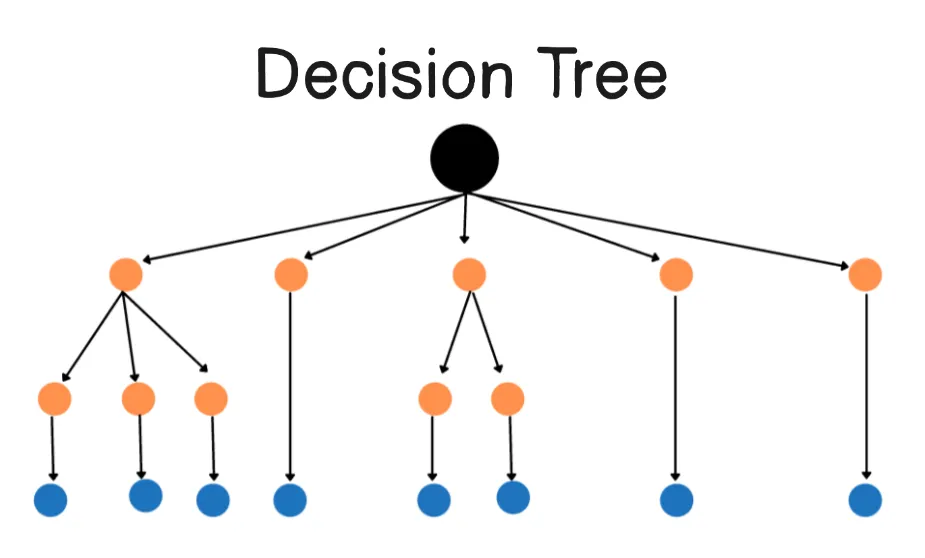

**Decision Tree** is a non-linear model that makes predictions by learning a series of if-then-else decision rules from data.

**Analogy:**
Imagine a flowchart where:
- Each node asks a yes/no question about a feature
- Each branch represents the answer
- Each leaf contains the prediction

**Example Tree (simplified):**
```
Is OverallQual >= 7?
├── YES → Is GrLivArea >= 2000?
│   ├── YES → Predict $350,000
│   └── NO → Predict $250,000
└── NO → Is YearBuilt >= 1990?
    ├── YES → Predict $180,000
    └── NO → Predict $120,000
```

---

### 6.2 How Does It Work?

**Tree Building Algorithm (CART - Classification and Regression Trees):**

**Step 1:** Start with all data at root node

**Step 2:** For each feature and possible split point:
- Calculate MSE (Mean Squared Error) for both resulting groups
- Choose split that minimizes total MSE

**Step 3:** Repeat recursively for each child node

**Step 4:** Stop when:
- Maximum depth reached
- Node has too few samples
- Further splitting doesn't reduce MSE

**Mathematical Split Criterion:**

For a split at feature $j$ and threshold $t$:

$$\text{MSE} = \frac{n_{\text{left}}}{n} \text{MSE}_{\text{left}} + \frac{n_{\text{right}}}{n} \text{MSE}_{\text{right}}$$

Where:
- $n$ = total samples in node
- $n_{\text{left}}$, $n_{\text{right}}$ = samples in left/right child
- $\text{MSE} = \frac{1}{n}\sum(y_i - \bar{y})^2$

**Goal:** Find split that MINIMIZES this weighted MSE

---

### 6.3 Key Hyperparameters

| Hyperparameter | What It Controls | Effect |
|----------------|------------------|--------|
| **max_depth** | Maximum tree depth | Too high → overfit, Too low → underfit |
| **min_samples_split** | Min samples to split a node | Higher → simpler tree (less overfitting) |
| **min_samples_leaf** | Min samples in leaf node | Higher → smoother predictions |
| **max_features** | Features considered per split | Lower → more randomness, less correlation |
| **max_leaf_nodes** | Maximum number of leaves | Direct control of tree complexity |

**Most Important: max_depth**
- Depth 1: Decision stump (very simple)
- Depth 3-5: Good for most problems
- Depth 10+: Likely overfitting

---

### 6.4 Decision Trees vs Linear Models

| Aspect | Decision Trees | Linear Models |
|--------|---------------|---------------|
| **Linearity Assumption** | ❌ None! | ✅ Required |
| **Feature Interactions** | ✅ Automatic | ❌ Must manually create |
| **Feature Scaling** | ❌ Not needed | ✅ Required |
| **Interpretability** | ✅ Visual tree (if small) | ✅ Coefficients |
| **Extrapolation** | ❌ Poor (predicts leaf averages) | ✅ Can extrapolate |
| **Overfitting Risk** | ⚠️ HIGH (without pruning) | ⚠️ Medium |
| **Training Speed** | Fast | Very fast |
| **Prediction Speed** | Fast | Very fast |
| **Handles Missing Data** | ⚠️ Needs preprocessing | ⚠️ Needs preprocessing |
| **Handles Categorical** | ✅ Direct (some implementations) | ❌ Must encode |

---

### 6.5 Advantages of Decision Trees

- ✅ **No assumptions** about data distribution
- ✅ **Automatic feature interactions** (captures non-linear relationships)
- ✅ **No feature scaling needed** (splits based on thresholds, not magnitudes)
- ✅ **Easy to visualize** (can see the decision logic)
- ✅ **Feature importance** built-in
- ✅ **Handles mixed data types** (numerical + categorical)
- ✅ **Robust to outliers** (uses rank-based splits)

---

### 6.6 Disadvantages of Decision Trees

- ❌ **High variance** (small data changes → completely different tree)
- ❌ **Overfitting tendency** (memorizes training data)
- ❌ **Unstable** (sensitive to data variations)
- ❌ **Biased toward features with more levels** (more split opportunities)
- ❌ **Poor extrapolation** (can't predict outside training range)
- ❌ **Axis-parallel splits** (can't capture diagonal boundaries easily)

**Solution to Disadvantages:** Ensemble methods (Random Forest, Boosting - coming next!)

---

### 6.7 Overfitting in Decision Trees

**The Problem:**

An unrestricted decision tree will grow until:
- Each leaf has 1 sample
- Perfect training accuracy (RMSE = 0)
- BUT terrible test performance!

**This is SEVERE OVERFITTING.**

**Example:**
```
Training RMSE: $0 (perfect!)
Test RMSE: $80,000 (disaster!)
```

**Why?**
Tree memorized specific training examples instead of learning general patterns.

**Solutions:**
1. **Pre-pruning:** Stop growing early (max_depth, min_samples_split)
2. **Post-pruning:** Grow full tree, then remove branches (cost-complexity pruning)
3. **Ensemble methods:** Use many trees (Random Forest - next section!)

---

### 6.8 When to Use Decision Trees

✅ **Use when:**
- Need interpretable model (can visualize tree)
- Have non-linear relationships
- Don't want to do feature engineering
- Have mixed feature types
- Need quick baseline
- Data has complex interactions

❌ **Don't use when:**
- Need best possible accuracy (use ensemble instead)
- Data is very noisy (high variance problem)
- Need to extrapolate beyond training range
- Have very high-dimensional data (better options exist)

**In Practice:**
Single decision trees are rarely used alone. They're the building blocks for **Random Forests** and **Gradient Boosting** - which we'll cover next!

---

Let's build some trees! 🌳
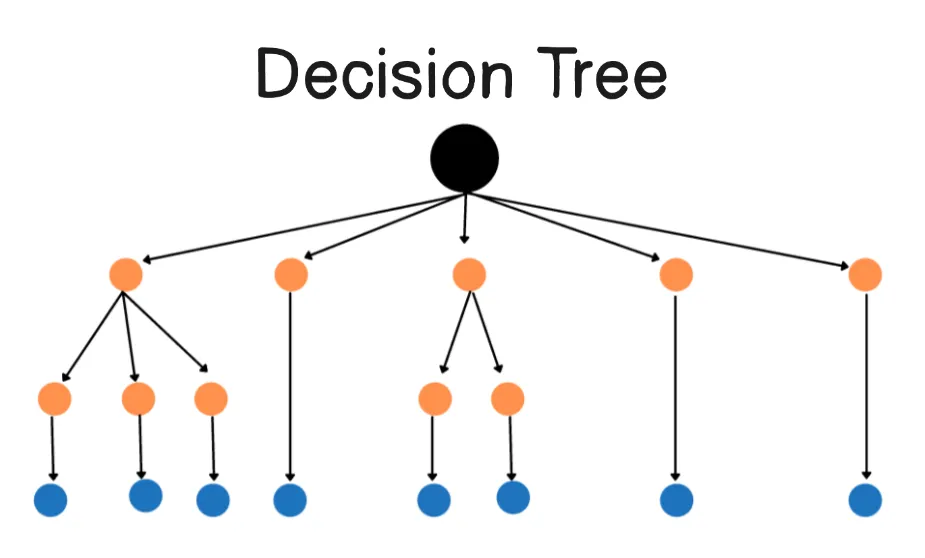

In [25]:
# ==================== DECISION TREE: OVERFITTING DEMONSTRATION ====================

print("="*60)
print("DECISION TREE REGRESSION: Overfitting Demonstration")
print("="*60)

# We'll train trees with different max_depths to show overfitting
depths = [1, 2, 3, 5, 10, 20, None]  # None = unlimited depth
tree_results = []

for depth in depths:
    # Train tree
    tree = DecisionTreeRegressor(max_depth=depth, random_state=RANDOM_STATE)
    tree.fit(X_train_scaled, y_train)
    
    # Predictions
    y_pred_train_tree = tree.predict(X_train_scaled)
    y_pred_test_tree = tree.predict(X_test_scaled)
    
    # Metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train_tree))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test_tree))
    train_r2 = r2_score(y_train, y_pred_train_tree)
    test_r2 = r2_score(y_test, y_pred_test_tree)
    
    # Tree properties
    n_leaves = tree.get_n_leaves()
    actual_depth = tree.get_depth()
    
    tree_results.append({
        'max_depth': str(depth),
        'actual_depth': actual_depth,
        'n_leaves': n_leaves,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_r2': train_r2,
        'test_r2': test_r2,
        'overfit_gap': test_rmse - train_rmse
    })

tree_df = pd.DataFrame(tree_results)

print("\n📊 Decision Tree Performance vs Depth:")
print(tree_df.to_string(index=False))

print("\n📈 Key Observations:")
print("   • As max_depth increases:")
print("     - Training error decreases (tree memorizes data)")
print("     - Test error may increase (overfitting!)")
print("   • Overfit gap = Test RMSE - Train RMSE")
print("     - Larger gap = more overfitting")

# Find best depth
best_tree = tree_df.loc[tree_df['test_rmse'].idxmin()]
print(f"\n✅ Best max_depth: {best_tree['max_depth']}")
print(f"   • Test RMSE: ${best_tree['test_rmse']:,.2f}")
print(f"   • Test R²: {best_tree['test_r2']:.4f}")
print(f"   • Number of leaves: {int(best_tree['n_leaves'])}")

DECISION TREE REGRESSION: Overfitting Demonstration

📊 Decision Tree Performance vs Depth:
max_depth  actual_depth  n_leaves  train_rmse  test_rmse  train_r2  test_r2  overfit_gap
        1             1         2  56940.1346 65179.1782    0.4564   0.4461    8239.0436
        2             2         4  47488.2070 50731.0277    0.6219   0.6645    3242.8207
        3             3         8  40552.8436 43364.2315    0.7243   0.7548    2811.3879
        5             5        32  29540.8856 41786.7596    0.8537   0.7724   12245.8740
       10            10       367  10774.8612 39119.4078    0.9805   0.8005   28344.5466
       20            20      1090   1083.0462 36666.0623    0.9998   0.8247   35583.0162
     None            27      1128    757.8221 39336.3761    0.9999   0.7983   38578.5540

📈 Key Observations:
   • As max_depth increases:
     - Training error decreases (tree memorizes data)
     - Test error may increase (overfitting!)
   • Overfit gap = Test RMSE - Train RMSE
     

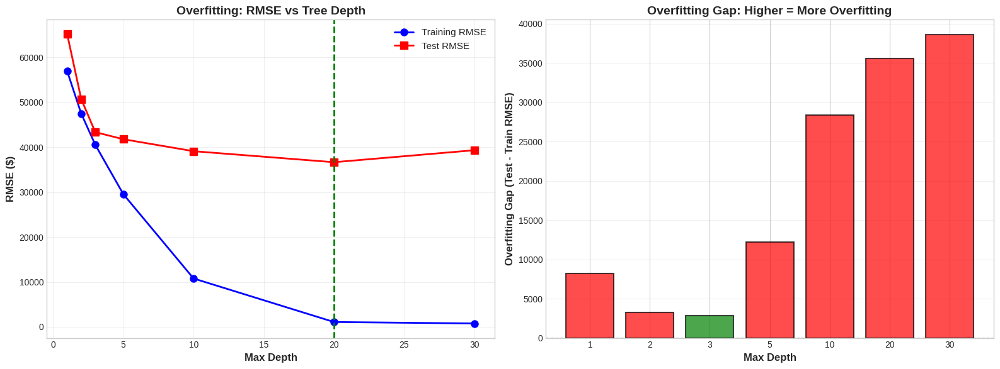


📊 Interpretation:
   • LEFT PLOT:
     - Training RMSE (blue) always decreases with depth
     - Test RMSE (red) first decreases, then increases (U-shape)
     - Gap between lines = overfitting
   • RIGHT PLOT:
     - Green bar = best depth (minimal overfitting)
     - Red bars = overfitting (test worse than train)


In [26]:
# ==================== VISUALIZE OVERFITTING ====================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: RMSE vs Depth
depths_numeric = [1, 2, 3, 5, 10, 20, 30]  # For plotting
train_rmses = tree_df['train_rmse'].values
test_rmses = tree_df['test_rmse'].values

axes[0].plot(depths_numeric, train_rmses, 'o-', linewidth=2, markersize=8, 
            label='Training RMSE', color='blue')
axes[0].plot(depths_numeric, test_rmses, 's-', linewidth=2, markersize=8, 
            label='Test RMSE', color='red')
axes[0].set_xlabel('Max Depth', fontsize=12, fontweight='bold')
axes[0].set_ylabel('RMSE ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Overfitting: RMSE vs Tree Depth', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)
axes[0].axvline(x=int(best_tree['max_depth']), color='green', linestyle='--', 
               linewidth=2, label=f'Best depth = {best_tree["max_depth"]}')

# Plot 2: Overfitting Gap
overfit_gaps = tree_df['overfit_gap'].values
axes[1].bar(range(len(depths_numeric)), overfit_gaps, alpha=0.7, 
           color=['green' if x == min(overfit_gaps) else 'red' for x in overfit_gaps],
           edgecolor='black', linewidth=1.5)
axes[1].set_xticks(range(len(depths_numeric)))
axes[1].set_xticklabels(depths_numeric)
axes[1].set_xlabel('Max Depth', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Overfitting Gap (Test - Train RMSE)', fontsize=12, fontweight='bold')
axes[1].set_title('Overfitting Gap: Higher = More Overfitting', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
axes[1].axhline(y=0, color='black', linestyle='--', linewidth=1)

plt.tight_layout()
plt.show()

print("\n📊 Interpretation:")
print("   • LEFT PLOT:")
print("     - Training RMSE (blue) always decreases with depth")
print("     - Test RMSE (red) first decreases, then increases (U-shape)")
print("     - Gap between lines = overfitting")
print("   • RIGHT PLOT:")
print("     - Green bar = best depth (minimal overfitting)")
print("     - Red bars = overfitting (test worse than train)")

In [27]:
# ==================== TRAIN OPTIMAL DECISION TREE ====================

print("\n" + "="*60)
print("OPTIMAL DECISION TREE MODEL")
print("="*60)

# Train with best depth
best_depth = int(best_tree['max_depth']) if best_tree['max_depth'] != 'None' else None
optimal_tree = DecisionTreeRegressor(
    max_depth=best_depth,
    min_samples_split=20,
    min_samples_leaf=10,
    random_state=RANDOM_STATE
)
optimal_tree.fit(X_train_scaled, y_train)

# Predictions
y_pred_train_tree = optimal_tree.predict(X_train_scaled)
y_pred_test_tree = optimal_tree.predict(X_test_scaled)

# Metrics
train_rmse_tree = np.sqrt(mean_squared_error(y_train, y_pred_train_tree))
test_rmse_tree = np.sqrt(mean_squared_error(y_test, y_pred_test_tree))
train_r2_tree = r2_score(y_train, y_pred_train_tree)
test_r2_tree = r2_score(y_test, y_pred_test_tree)

print(f"\n📐 Tree Configuration:")
print(f"   • max_depth: {best_depth}")
print(f"   • min_samples_split: 20")
print(f"   • min_samples_leaf: 10")

print(f"\n📊 Tree Properties:")
print(f"   • Actual depth: {optimal_tree.get_depth()}")
print(f"   • Number of leaves: {optimal_tree.get_n_leaves()}")
print(f"   • Number of nodes: {optimal_tree.tree_.node_count}")

print("\n" + "="*60)
print("PERFORMANCE METRICS")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_tree:,.2f}")
print(f"   • R²: {train_r2_tree:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_tree:,.2f}")
print(f"   • R²: {test_r2_tree:.4f}")

print(f"\n📊 Comparison with Linear Models:")
print(f"   • OLS RMSE: ${test_rmse_mlr:,.2f}")
print(f"   • Ridge RMSE: ${best_ridge['test_rmse']:,.2f}")
print(f"   • Lasso RMSE: ${best_lasso['test_rmse']:,.2f}")
print(f"   • Tree RMSE: ${test_rmse_tree:,.2f}")

if test_rmse_tree < test_rmse_mlr:
    print(f"\n✅ Decision Tree performs better than linear models!")
else:
    print(f"\n⚠️ Linear models still performing better - tree may need tuning")


OPTIMAL DECISION TREE MODEL

📐 Tree Configuration:
   • max_depth: 20
   • min_samples_split: 20
   • min_samples_leaf: 10

📊 Tree Properties:
   • Actual depth: 11
   • Number of leaves: 91
   • Number of nodes: 181

PERFORMANCE METRICS

🎯 Training Set:
   • RMSE: $29,044.79
   • R²: 0.8586

🎯 Test Set:
   • RMSE: $38,872.09
   • R²: 0.8030

📊 Comparison with Linear Models:
   • OLS RMSE: $35,108.10
   • Ridge RMSE: $35,108.10
   • Lasso RMSE: $35,102.73
   • Tree RMSE: $38,872.09

⚠️ Linear models still performing better - tree may need tuning



DECISION TREE VISUALIZATION


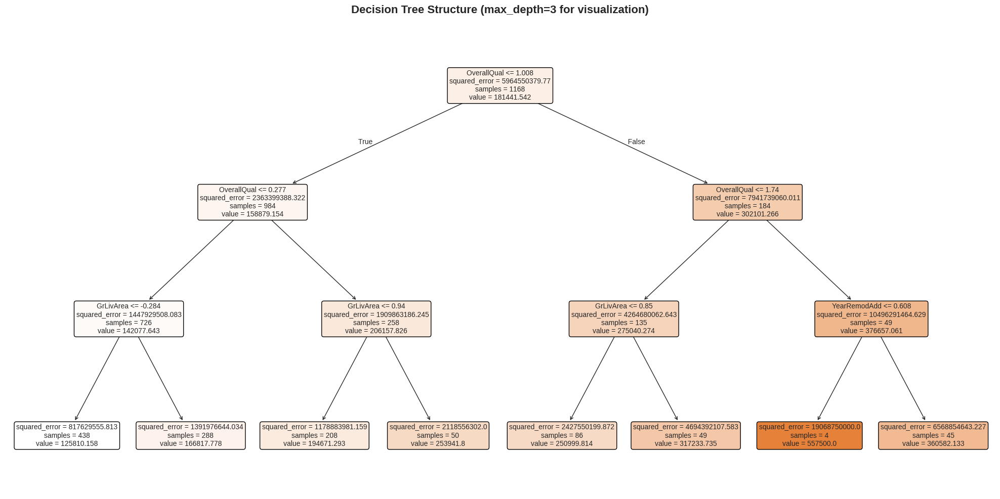


📊 How to Read the Tree:
   • Each box = decision node or leaf
   • Top line = splitting rule (e.g., 'Feature <= threshold')
   • 'mse' = mean squared error at that node
   • 'samples' = number of training samples in that node
   • 'value' = predicted price for samples in that node
   • Color intensity = prediction value (darker = higher price)

💡 Tree Logic:
   • Start at top (root)
   • Follow branches based on feature values
   • End at leaf node for prediction


In [28]:
# ==================== VISUALIZE DECISION TREE ====================

print("\n" + "="*60)
print("DECISION TREE VISUALIZATION")
print("="*60)

# For visualization, we'll create a smaller tree (depth=3) for readability
small_tree = DecisionTreeRegressor(max_depth=3, random_state=RANDOM_STATE)
small_tree.fit(X_train_scaled, y_train)

# Plot the tree
plt.figure(figsize=(20, 10))
plot_tree(small_tree, 
          feature_names=X_train_scaled.columns,
          filled=True,
          rounded=True,
          fontsize=10)
plt.title('Decision Tree Structure (max_depth=3 for visualization)', 
         fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n📊 How to Read the Tree:")
print("   • Each box = decision node or leaf")
print("   • Top line = splitting rule (e.g., 'Feature <= threshold')")
print("   • 'mse' = mean squared error at that node")
print("   • 'samples' = number of training samples in that node")
print("   • 'value' = predicted price for samples in that node")
print("   • Color intensity = prediction value (darker = higher price)")

print("\n💡 Tree Logic:")
print("   • Start at top (root)")
print("   • Follow branches based on feature values")
print("   • End at leaf node for prediction")


FEATURE IMPORTANCE FROM DECISION TREE

🔝 Top 20 Most Important Features:
             Feature  Importance
         OverallQual      0.7417
           GrLivArea      0.1286
         TotalBsmtSF      0.0463
            1stFlrSF      0.0192
          GarageArea      0.0176
          GarageCars      0.0112
        CentralAir_Y      0.0102
   GarageType_Detchd      0.0092
           YearBuilt      0.0049
        YearRemodAdd      0.0044
            BsmtQual      0.0037
        TotRmsAbvGrd      0.0023
 Neighborhood_NWAmes      0.0004
Neighborhood_Somerst      0.0002
            FullBath      0.0000
           ExterQual      0.0000
         KitchenQual      0.0000
Neighborhood_BrkSide      0.0000
 Neighborhood_BrDale      0.0000
Neighborhood_Blueste      0.0000

💡 Feature Importance Interpretation:
   • Based on how much each feature reduces MSE
   • Higher value = more important for predictions
   • Sum of all importances = 1.0


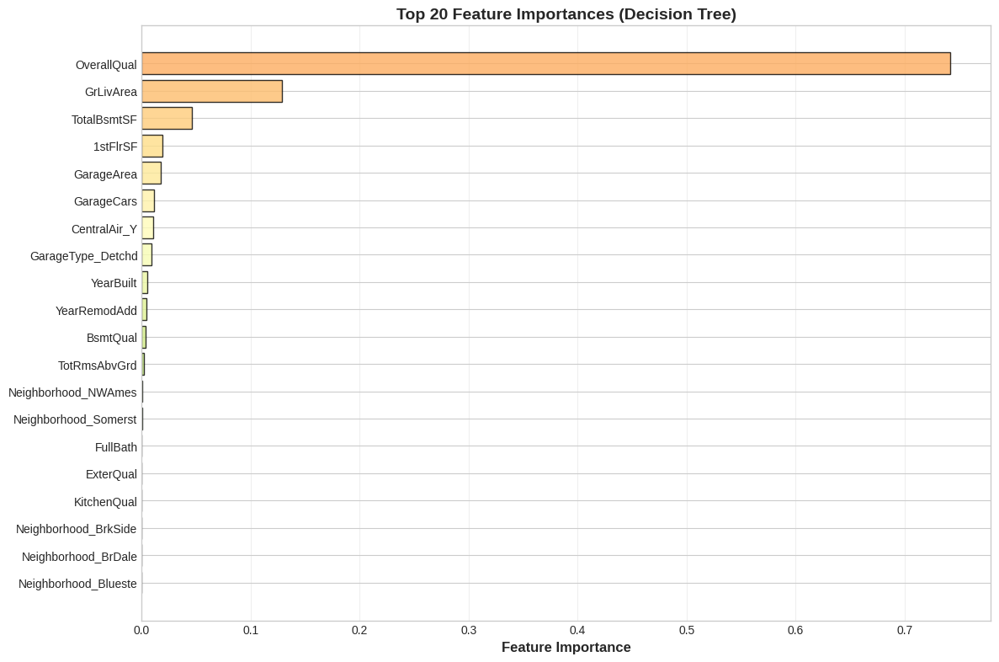

In [29]:
# ==================== FEATURE IMPORTANCE FROM TREE ====================

print("\n" + "="*60)
print("FEATURE IMPORTANCE FROM DECISION TREE")
print("="*60)

# Get feature importances
feature_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Importance': optimal_tree.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n🔝 Top 20 Most Important Features:")
print(feature_importance.head(20).to_string(index=False))

print(f"\n💡 Feature Importance Interpretation:")
print(f"   • Based on how much each feature reduces MSE")
print(f"   • Higher value = more important for predictions")
print(f"   • Sum of all importances = 1.0")

# Visualize
fig, ax = plt.subplots(figsize=(12, 8))

top_n = 20
top_features = feature_importance.head(top_n)

colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, top_n))
ax.barh(range(top_n), top_features['Importance'], color=colors, alpha=0.8, edgecolor='black')
ax.set_yticks(range(top_n))
ax.set_yticklabels(top_features['Feature'])
ax.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
ax.set_title(f'Top {top_n} Feature Importances (Decision Tree)', 
            fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)

# Invert y-axis to show highest at top
ax.invert_yaxis()

plt.tight_layout()
plt.show()

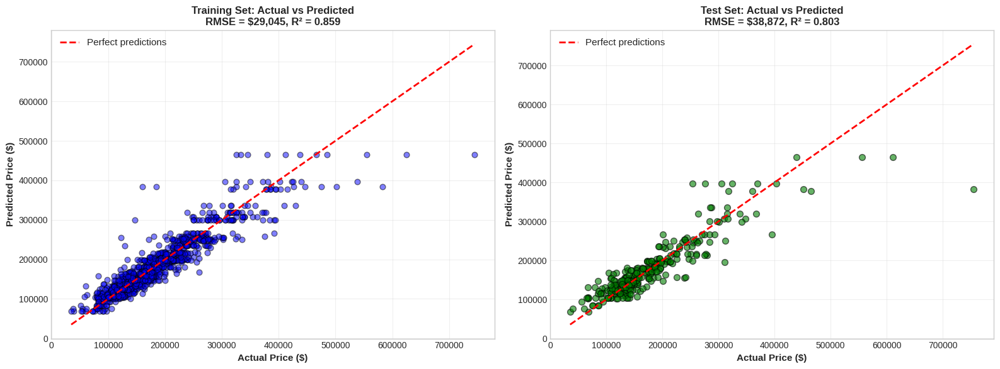


📊 Observations:
   • Decision Tree can capture non-linear patterns
   • Predictions are less smooth than linear models (step-like)
   • This is because trees predict using leaf averages


In [30]:
# ==================== ACTUAL VS PREDICTED (TREE) ====================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Training set
axes[0].scatter(y_train, y_pred_train_tree, alpha=0.5, s=40, color='blue', edgecolor='black')
axes[0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 
            'r--', linewidth=2, label='Perfect predictions')
axes[0].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[0].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[0].set_title(f'Training Set: Actual vs Predicted\nRMSE = ${train_rmse_tree:,.0f}, R² = {train_r2_tree:.3f}', 
                 fontsize=12, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Test set
axes[1].scatter(y_test, y_pred_test_tree, alpha=0.6, s=50, color='green', edgecolor='black')
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
            'r--', linewidth=2, label='Perfect predictions')
axes[1].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[1].set_title(f'Test Set: Actual vs Predicted\nRMSE = ${test_rmse_tree:,.0f}, R² = {test_r2_tree:.3f}', 
                 fontsize=12, fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n📊 Observations:")
print("   • Decision Tree can capture non-linear patterns")
print("   • Predictions are less smooth than linear models (step-like)")
print("   • This is because trees predict using leaf averages")

<a id="section7"></a>
## 7. Random Forest Regression

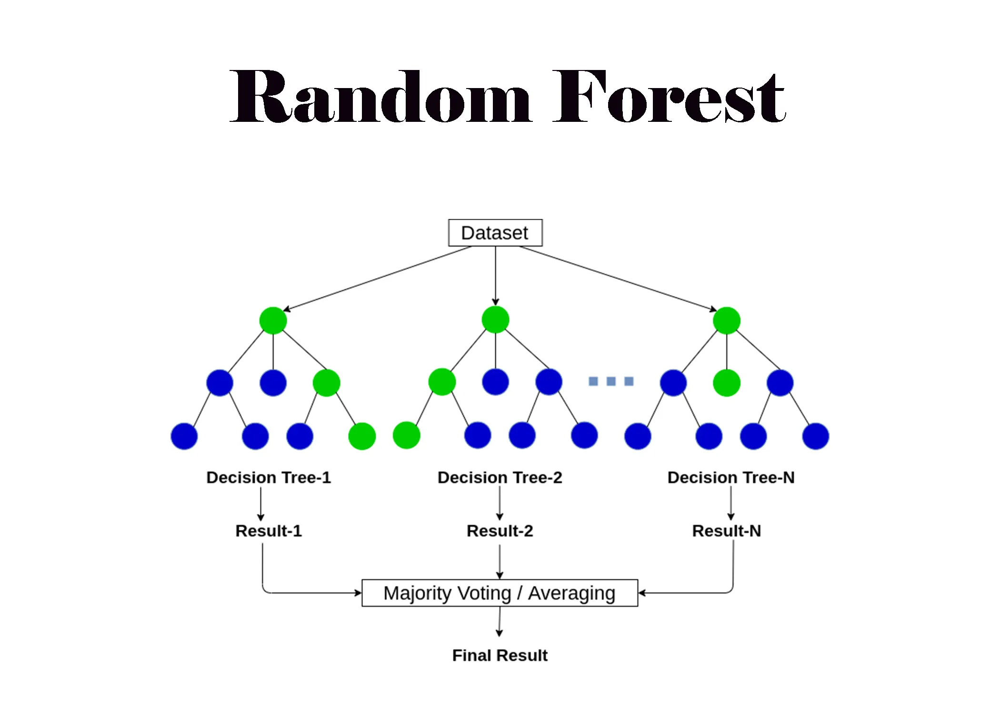
---

### 7.1 From One Tree to a Forest

**The Problem with Single Decision Trees:**
- High variance (unstable)
- Sensitive to small data changes
- Prone to overfitting

**The Solution: Random Forest**
Build MANY decision trees and average their predictions!

**Ensemble Learning Principle:**
"Wisdom of the crowds" - many weak models together make a strong model.

---

### 7.2 How Random Forest Works

**Step 1: Bootstrap Sampling (Bagging)**
For each tree:
- Randomly sample training data WITH replacement
- Each sample has same size as original data
- Some samples appear multiple times, some not at all

**Step 2: Random Feature Selection**
At each split in each tree:
- Randomly select subset of features (√p or p/3)
- Only consider these features for splitting
- Different trees see different feature subsets

**Step 3: Build Full Trees**
- Grow each tree to maximum depth (no pruning)
- Each tree overfits its bootstrap sample
- Trees are diverse (different data + different features)

**Step 4: Aggregate Predictions**
For a new data point:
- Pass through ALL trees
- Each tree makes a prediction
- Average all predictions (for regression)

$$\hat{y} = \frac{1}{N}\sum_{i=1}^{N} \text{tree}_i(x)$$

---

### 7.3 Why Does Random Forest Work?

**Two Sources of Randomness:**

**1. Bootstrap Sampling (Bagging)**
- Each tree sees different subset of data
- Reduces variance
- Trees make different mistakes

**2. Random Feature Selection**
- Decorrelates trees
- Prevents same features dominating all trees
- Forces ensemble to consider diverse patterns

**The Magic: Variance Reduction**

Single tree variance: $\sigma^2$

If we average $N$ **independent** predictions:
$$\text{Variance} = \frac{\sigma^2}{N}$$

Random Forest approximates this by making trees as independent as possible!

**Result:**
- Individual trees overfit
- BUT averaged prediction is stable
- Bias stays low, variance decreases dramatically

---

### 7.4 Random Forest vs Single Decision Tree

| Aspect | Single Tree | Random Forest |
|--------|------------|---------------|
| **Variance** | HIGH | LOW (averaged) |
| **Overfitting** | High risk | Much lower risk |
| **Stability** | Unstable | Very stable |
| **Bias** | Low (full tree) | Low (full trees) |
| **Training Time** | Fast | Slower (N trees) |
| **Prediction Time** | Fast | Slower (N trees) |
| **Interpretability** | ✅ Can visualize | ❌ Hard to interpret |
| **Feature Importance** | ✅ Yes | ✅ Yes (averaged) |
| **Hyperparameters** | Few | More (N trees + tree params) |
| **Performance** | Good | Better |

---

### 7.5 Key Hyperparameters

| Parameter | What It Does | Typical Values | Effect |
|-----------|-------------|----------------|--------|
| **n_estimators** | Number of trees | 100-500 | More trees = better (but slower) |
| **max_depth** | Tree depth limit | None, 10-30 | Limit to prevent overfitting |
| **min_samples_split** | Min samples to split | 2-20 | Higher = simpler trees |
| **min_samples_leaf** | Min samples in leaf | 1-10 | Higher = smoother predictions |
| **max_features** | Features per split | 'sqrt', 'log2', 0.3 | Lower = more diversity |
| **bootstrap** | Use bootstrap? | True | Should almost always be True |
| **oob_score** | Use out-of-bag eval? | False | Free validation estimate |
| **n_jobs** | Parallel processing | -1 | Use all CPU cores |

**Most Important:**
1. **n_estimators**: Start with 100, increase until performance plateaus
2. **max_features**: Default ('sqrt') usually works well
3. **max_depth**: None (full trees) often best, but can limit if overfitting

---

### 7.6 Out-of-Bag (OOB) Score

**What is OOB?**

Remember bootstrap sampling?
- Each tree trains on ~63% of data
- Remaining ~37% not used for that tree
- These are "out-of-bag" samples

**OOB Evaluation:**
- For each sample, average predictions from trees that DIDN'T see it
- This gives FREE validation estimate
- No need for separate validation set!

**Benefits:**
- ✅ Use all data for training
- ✅ Get unbiased performance estimate
- ✅ No need for cross-validation (saves time)

**How to use:**
```python
rf = RandomForestRegressor(oob_score=True)
rf.fit(X_train, y_train)
print(f"OOB R²: {rf.oob_score_}")
```

---

### 7.7 Feature Importance in Random Forest

**Two Types:**

**1. Mean Decrease in Impurity (Default)**
- How much each feature reduces MSE across all trees
- Fast to compute (during training)
- Can be biased toward high-cardinality features

**2. Permutation Importance (More Reliable)**
- Shuffle each feature and measure performance drop
- More expensive (requires predictions)
- More reliable measure of true importance

**Random Forest Advantage:**
Feature importance is AVERAGED across many trees → more stable than single tree!

---

### 7.8 Advantages of Random Forest

- ✅ **Excellent performance** (often best off-the-shelf model)
- ✅ **Low overfitting** (even with default params)
- ✅ **Handles non-linearity** automatically
- ✅ **No feature scaling** needed
- ✅ **Robust to outliers**
- ✅ **Handles missing values** (some implementations)
- ✅ **Provides feature importance**
- ✅ **Works with small datasets** (no deep learning needed)
- ✅ **Minimal tuning** required
- ✅ **Embarrassingly parallel** (trees independent)

**"Random Forest is the best single model for most tabular problems"** - Kaggle wisdom

---

### 7.9 Disadvantages of Random Forest

- ❌ **Black box** (can't interpret like linear models)
- ❌ **Slower prediction** than single tree or linear model
- ❌ **Larger memory** (stores N trees)
- ❌ **Poor extrapolation** (predicts leaf averages)
- ❌ **Can be slow on very large datasets** (use LightGBM instead)
- ❌ **Not great for very high-dimensional data** (use boosting)

---

### 7.10 When to Use Random Forest

✅ **Use when:**
- Want strong baseline quickly
- Have tabular data
- Don't want to tune much
- Need robust model
- Have non-linear relationships
- Don't need extrapolation
- Want feature importance

❌ **Consider alternatives when:**
- Need maximum interpretability (use linear model or single tree)
- Need fastest predictions (use linear model)
- Have extreme data size (use LightGBM)
- Need extrapolation (use linear model)
- Working with text/images (use deep learning)

**In Kaggle competitions:** Random Forest is often the first model to try after linear models!

---

Let's grow a forest! 🌲🌳🌲
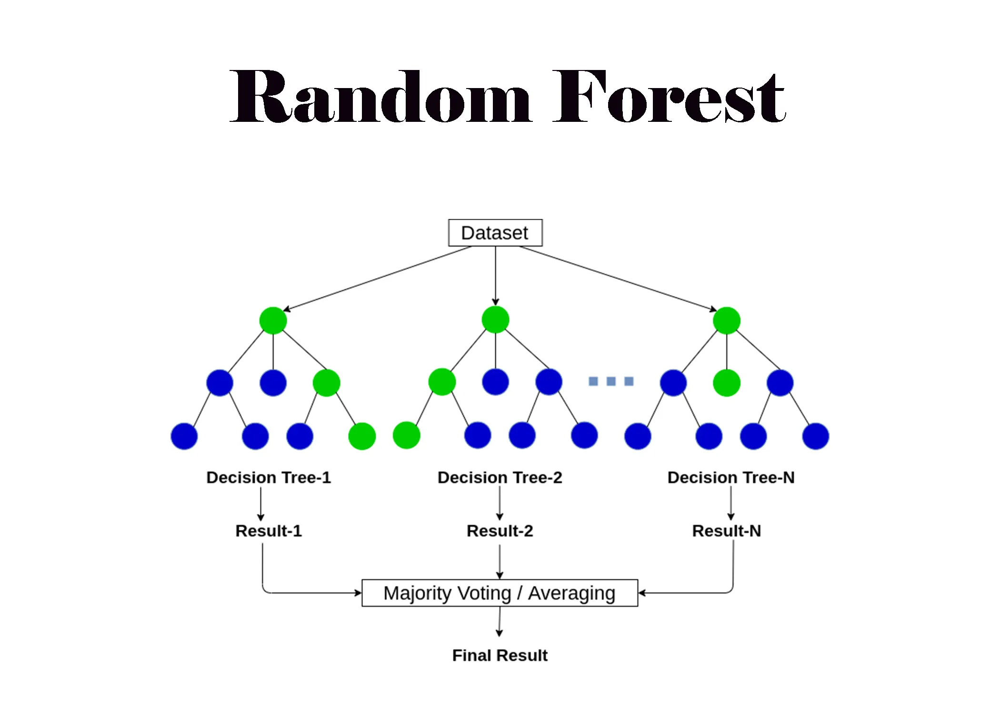

In [31]:
# ==================== RANDOM FOREST: EFFECT OF N_ESTIMATORS ====================

print("="*60)
print("RANDOM FOREST: Impact of Number of Trees")
print("="*60)

# Test different numbers of trees
n_trees_list = [10, 25, 50, 100, 200, 300, 500]
rf_results = []

for n_trees in n_trees_list:
    print(f"Training Random Forest with {n_trees} trees...", end=' ')
    
    # Train model
    rf = RandomForestRegressor(
        n_estimators=n_trees,
        max_depth=15,
        min_samples_split=10,
        min_samples_leaf=5,
        max_features='sqrt',
        random_state=RANDOM_STATE,
        n_jobs=-1
    )
    
    start_time = time.time()
    rf.fit(X_train_scaled, y_train)
    training_time = time.time() - start_time
    
    # Predictions
    y_pred_test_rf = rf.predict(X_test_scaled)
    
    # Metrics
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test_rf))
    test_r2 = r2_score(y_test, y_pred_test_rf)
    
    rf_results.append({
        'n_estimators': n_trees,
        'test_rmse': test_rmse,
        'test_r2': test_r2,
        'training_time': training_time
    })
    
    print(f"✓ RMSE: ${test_rmse:,.0f}, Time: {training_time:.2f}s")

rf_df = pd.DataFrame(rf_results)

print("\n📊 Random Forest Performance vs Number of Trees:")
print(rf_df.to_string(index=False))

print("\n💡 Observations:")
print("   • Performance improves as number of trees increases")
print("   • Diminishing returns after ~200 trees")
print("   • Training time scales linearly with number of trees")

RANDOM FOREST: Impact of Number of Trees
Training Random Forest with 10 trees... ✓ RMSE: $33,697, Time: 0.04s
Training Random Forest with 25 trees... ✓ RMSE: $34,840, Time: 0.06s
Training Random Forest with 50 trees... ✓ RMSE: $35,274, Time: 0.11s
Training Random Forest with 100 trees... ✓ RMSE: $35,374, Time: 0.22s
Training Random Forest with 200 trees... ✓ RMSE: $35,683, Time: 0.42s
Training Random Forest with 300 trees... ✓ RMSE: $35,537, Time: 0.60s
Training Random Forest with 500 trees... ✓ RMSE: $35,581, Time: 0.99s

📊 Random Forest Performance vs Number of Trees:
 n_estimators  test_rmse  test_r2  training_time
           10 33697.3824   0.8520         0.0374
           25 34840.3480   0.8417         0.0567
           50 35274.0738   0.8378         0.1119
          100 35374.3543   0.8369         0.2175
          200 35682.5519   0.8340         0.4155
          300 35536.6127   0.8354         0.5993
          500 35581.2684   0.8349         0.9922

💡 Observations:
   • Performan

In [32]:
# ==================== TRAIN OPTIMAL RANDOM FOREST ====================

print("\n" + "="*60)
print("OPTIMAL RANDOM FOREST MODEL")
print("="*60)

# Train with best configuration
optimal_rf = RandomForestRegressor(
    n_estimators=200,
    max_depth=15,
    min_samples_split=10,
    min_samples_leaf=5,
    max_features='sqrt',
    bootstrap=True,
    oob_score=True,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=0
)

print("\n📐 Training Random Forest...")
start_time = time.time()
optimal_rf.fit(X_train_scaled, y_train)
training_time = time.time() - start_time

print(f"✅ Training complete in {training_time:.2f} seconds")

# Predictions
y_pred_train_rf = optimal_rf.predict(X_train_scaled)
y_pred_test_rf = optimal_rf.predict(X_test_scaled)

# Metrics
train_rmse_rf = np.sqrt(mean_squared_error(y_train, y_pred_train_rf))
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_test_rf))
train_r2_rf = r2_score(y_train, y_pred_train_rf)
test_r2_rf = r2_score(y_test, y_pred_test_rf)
train_mae_rf = mean_absolute_error(y_train, y_pred_train_rf)
test_mae_rf = mean_absolute_error(y_test, y_pred_test_rf)

print("\n" + "="*60)
print("MODEL CONFIGURATION")
print("="*60)
print(f"\n   • n_estimators: 200")
print(f"   • max_depth: 15")
print(f"   • min_samples_split: 10")
print(f"   • min_samples_leaf: 5")
print(f"   • max_features: sqrt")
print(f"   • bootstrap: True")

print("\n" + "="*60)
print("PERFORMANCE METRICS")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_rf:,.2f}")
print(f"   • MAE: ${train_mae_rf:,.2f}")
print(f"   • R²: {train_r2_rf:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_rf:,.2f}")
print(f"   • MAE: ${test_mae_rf:,.2f}")
print(f"   • R²: {test_r2_rf:.4f}")

print(f"\n🎯 Out-of-Bag (OOB) Score:")
print(f"   • OOB R²: {optimal_rf.oob_score_:.4f}")
print(f"   • This is a FREE validation estimate!")

print(f"\n📊 Overfitting Check:")
print(f"   • Train RMSE: ${train_rmse_rf:,.2f}")
print(f"   • Test RMSE: ${test_rmse_rf:,.2f}")
print(f"   • Gap: ${test_rmse_rf - train_rmse_rf:,.2f}")
if (test_rmse_rf - train_rmse_rf) < 5000:
    print(f"   ✅ Minimal overfitting! (gap < $5,000)")
else:
    print(f"   ⚠️ Some overfitting present")


OPTIMAL RANDOM FOREST MODEL

📐 Training Random Forest...
✅ Training complete in 0.52 seconds

MODEL CONFIGURATION

   • n_estimators: 200
   • max_depth: 15
   • min_samples_split: 10
   • min_samples_leaf: 5
   • max_features: sqrt
   • bootstrap: True

PERFORMANCE METRICS

🎯 Training Set:
   • RMSE: $27,476.13
   • MAE: $16,287.61
   • R²: 0.8734

🎯 Test Set:
   • RMSE: $35,682.55
   • MAE: $20,356.48
   • R²: 0.8340

🎯 Out-of-Bag (OOB) Score:
   • OOB R²: 0.8148
   • This is a FREE validation estimate!

📊 Overfitting Check:
   • Train RMSE: $27,476.13
   • Test RMSE: $35,682.55
   • Gap: $8,206.42
   ⚠️ Some overfitting present



MODEL COMPARISON: Linear Models vs Tree vs Random Forest

📊 Complete Model Comparison (sorted by Test RMSE):
                     Model  Test_RMSE  Test_R2   Test_MAE
                     Lasso 35102.7291   0.8394 21534.4583
Multiple Linear Regression 35108.0953   0.8393 21550.9062
                     Ridge 35108.0978   0.8393 21550.9028
                ElasticNet 35108.3939   0.8393 21550.5164
  Simple Linear Regression 35581.2684   0.8349 33343.2421
             Random Forest 35682.5519   0.8340 20356.4785
             Decision Tree 38872.0932   0.8030 23264.5221

🏆 CURRENT BEST MODEL: Lasso
   • Test RMSE: $35,102.73
   • Test R²: 0.8394
   • Test MAE: $21,534.46


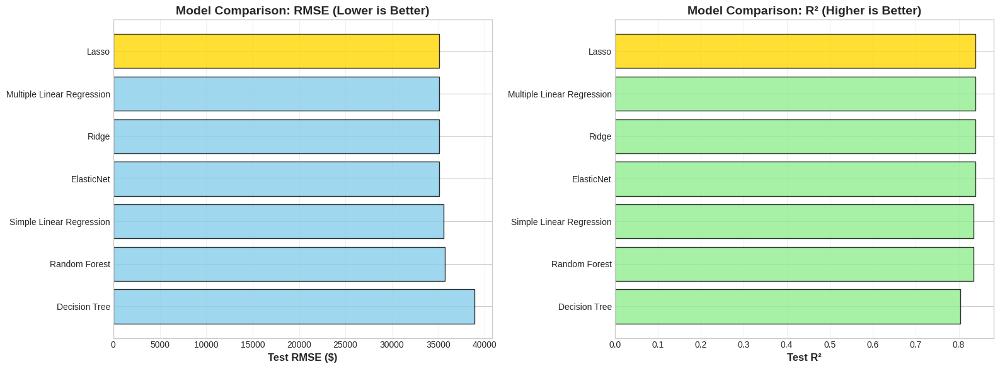

In [33]:
# ==================== COMPARISON: ALL MODELS SO FAR ====================

print("\n" + "="*60)
print("MODEL COMPARISON: Linear Models vs Tree vs Random Forest")
print("="*60)

comparison_all = pd.DataFrame({
    'Model': [
        'Simple Linear Regression',
        'Multiple Linear Regression',
        'Ridge',
        'Lasso',
        'ElasticNet',
        'Decision Tree',
        'Random Forest'
    ],
    'Test_RMSE': [
        test_rmse,
        test_rmse_mlr,
        best_ridge['test_rmse'],
        best_lasso['test_rmse'],
        best_en['test_rmse'],
        test_rmse_tree,
        test_rmse_rf
    ],
    'Test_R2': [
        test_r2,
        test_r2_mlr,
        best_ridge['test_r2'],
        best_lasso['test_r2'],
        best_en['test_r2'],
        test_r2_tree,
        test_r2_rf
    ],
    'Test_MAE': [
        mean_absolute_error(y_test, simple_lr.predict(X_test_simple)),
        test_mae_mlr,
        mean_absolute_error(y_test, best_ridge_model.predict(X_test_scaled)),
        mean_absolute_error(y_test, best_lasso_model.predict(X_test_scaled)),
        mean_absolute_error(y_test, best_en_model.predict(X_test_scaled)),
        mean_absolute_error(y_test, y_pred_test_tree),
        test_mae_rf
    ]
})

# Sort by RMSE
comparison_all = comparison_all.sort_values('Test_RMSE')

print("\n📊 Complete Model Comparison (sorted by Test RMSE):")
print(comparison_all.to_string(index=False))

# Find best
best_model = comparison_all.iloc[0]
print(f"\n🏆 CURRENT BEST MODEL: {best_model['Model']}")
print(f"   • Test RMSE: ${best_model['Test_RMSE']:,.2f}")
print(f"   • Test R²: {best_model['Test_R2']:.4f}")
print(f"   • Test MAE: ${best_model['Test_MAE']:,.2f}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# RMSE comparison
colors = ['gold' if i == 0 else 'skyblue' for i in range(len(comparison_all))]
axes[0].barh(range(len(comparison_all)), comparison_all['Test_RMSE'], 
            color=colors, alpha=0.8, edgecolor='black')
axes[0].set_yticks(range(len(comparison_all)))
axes[0].set_yticklabels(comparison_all['Model'])
axes[0].set_xlabel('Test RMSE ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Model Comparison: RMSE (Lower is Better)', fontsize=14, fontweight='bold')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# R² comparison
comparison_r2_sorted = comparison_all.sort_values('Test_R2', ascending=False)
colors2 = ['gold' if i == 0 else 'lightgreen' for i in range(len(comparison_r2_sorted))]
axes[1].barh(range(len(comparison_r2_sorted)), comparison_r2_sorted['Test_R2'], 
            color=colors2, alpha=0.8, edgecolor='black')
axes[1].set_yticks(range(len(comparison_r2_sorted)))
axes[1].set_yticklabels(comparison_r2_sorted['Model'])
axes[1].set_xlabel('Test R²', fontsize=12, fontweight='bold')
axes[1].set_title('Model Comparison: R² (Higher is Better)', fontsize=14, fontweight='bold')
axes[1].invert_yaxis()
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()


RANDOM FOREST: FEATURE IMPORTANCE ANALYSIS

🔝 Top 20 Most Important Features:
             Feature  Importance
         OverallQual      0.1555
           GrLivArea      0.1204
          GarageCars      0.0909
          GarageArea      0.0766
         KitchenQual      0.0722
           ExterQual      0.0687
            BsmtQual      0.0687
            1stFlrSF      0.0679
         TotalBsmtSF      0.0577
           YearBuilt      0.0510
        TotRmsAbvGrd      0.0343
            FullBath      0.0311
        YearRemodAdd      0.0259
           HeatingQC      0.0167
    Foundation_PConc      0.0132
Neighborhood_NridgHt      0.0095
   GarageType_Detchd      0.0074
Neighborhood_NoRidge      0.0055
        CentralAir_Y      0.0053
   Foundation_CBlock      0.0042

💡 Feature Importance Notes:
   • Averaged across 200 trees (more stable than single tree)
   • Based on mean decrease in MSE
   • Sum of all importances = 1.0

📊 Comparison: Random Forest vs Decision Tree (Top 5):

Feature     

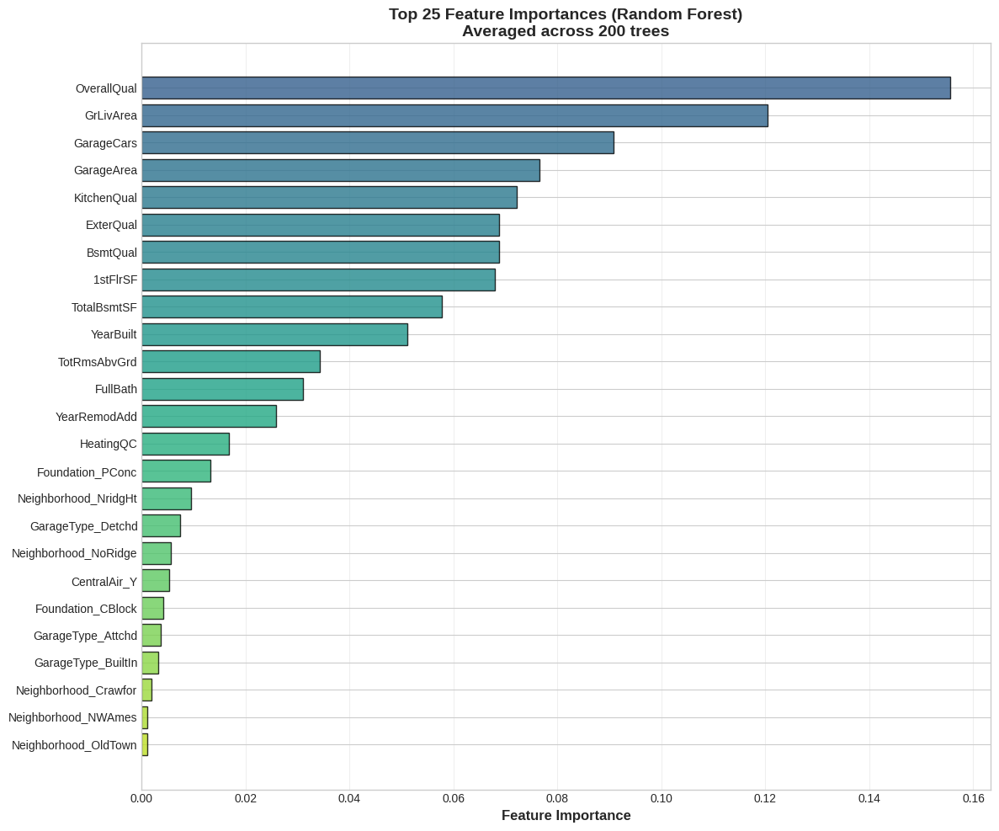

In [34]:
# ==================== RANDOM FOREST FEATURE IMPORTANCE ====================

print("\n" + "="*60)
print("RANDOM FOREST: FEATURE IMPORTANCE ANALYSIS")
print("="*60)

# Get feature importances
rf_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Importance': optimal_rf.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n🔝 Top 20 Most Important Features:")
print(rf_importance.head(20).to_string(index=False))

print(f"\n💡 Feature Importance Notes:")
print(f"   • Averaged across 200 trees (more stable than single tree)")
print(f"   • Based on mean decrease in MSE")
print(f"   • Sum of all importances = 1.0")

# Compare with Decision Tree importance
print(f"\n📊 Comparison: Random Forest vs Decision Tree (Top 5):")
print(f"\n{'Feature':<25} {'RF Importance':<15} {'Tree Importance':<15}")
print("="*55)

tree_importance_dict = dict(zip(X_train_scaled.columns, optimal_tree.feature_importances_))
for idx, row in rf_importance.head(5).iterrows():
    feat = row['Feature']
    rf_imp = row['Importance']
    tree_imp = tree_importance_dict.get(feat, 0)
    print(f"{feat:<25} {rf_imp:<15.4f} {tree_imp:<15.4f}")

# Visualize
fig, ax = plt.subplots(figsize=(12, 10))

top_n = 25
top_features = rf_importance.head(top_n)

colors = plt.cm.viridis(np.linspace(0.3, 0.9, top_n))
ax.barh(range(top_n), top_features['Importance'], color=colors, alpha=0.8, edgecolor='black')
ax.set_yticks(range(top_n))
ax.set_yticklabels(top_features['Feature'])
ax.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
ax.set_title(f'Top {top_n} Feature Importances (Random Forest)\nAveraged across 200 trees', 
            fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
ax.invert_yaxis()

plt.tight_layout()
plt.show()

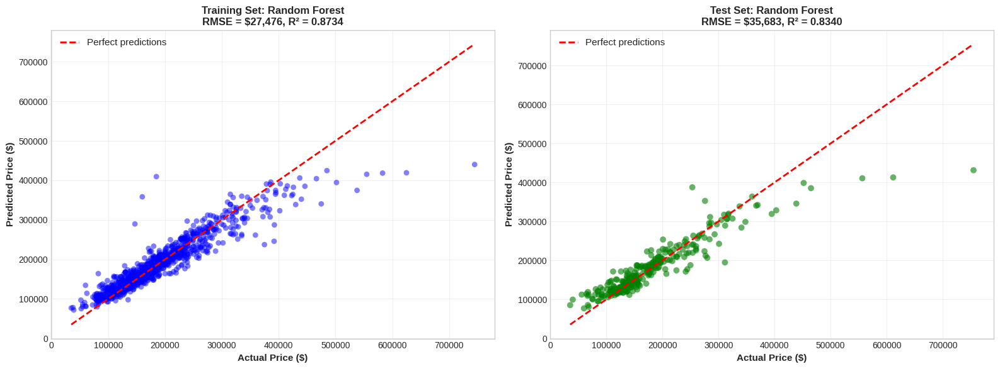


📊 Observations:
   • Predictions are smoother than single decision tree
   • Less overfitting (smaller train-test gap)
   • Better generalization to unseen data
   • Ensemble averaging reduces prediction variance


In [35]:
# ==================== ACTUAL VS PREDICTED (RANDOM FOREST) ====================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Training
axes[0].scatter(y_train, y_pred_train_rf, alpha=0.5, s=40, color='blue', edgecolor='none')
axes[0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 
            'r--', linewidth=2, label='Perfect predictions')
axes[0].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[0].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[0].set_title(f'Training Set: Random Forest\nRMSE = ${train_rmse_rf:,.0f}, R² = {train_r2_rf:.4f}', 
                 fontsize=12, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Test
axes[1].scatter(y_test, y_pred_test_rf, alpha=0.6, s=50, color='green', edgecolor='none')
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
            'r--', linewidth=2, label='Perfect predictions')
axes[1].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[1].set_title(f'Test Set: Random Forest\nRMSE = ${test_rmse_rf:,.0f}, R² = {test_r2_rf:.4f}', 
                 fontsize=12, fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n📊 Observations:")
print("   • Predictions are smoother than single decision tree")
print("   • Less overfitting (smaller train-test gap)")
print("   • Better generalization to unseen data")
print("   • Ensemble averaging reduces prediction variance")

<a id="section8"></a>
## 8. Gradient Boosting Fundamentals

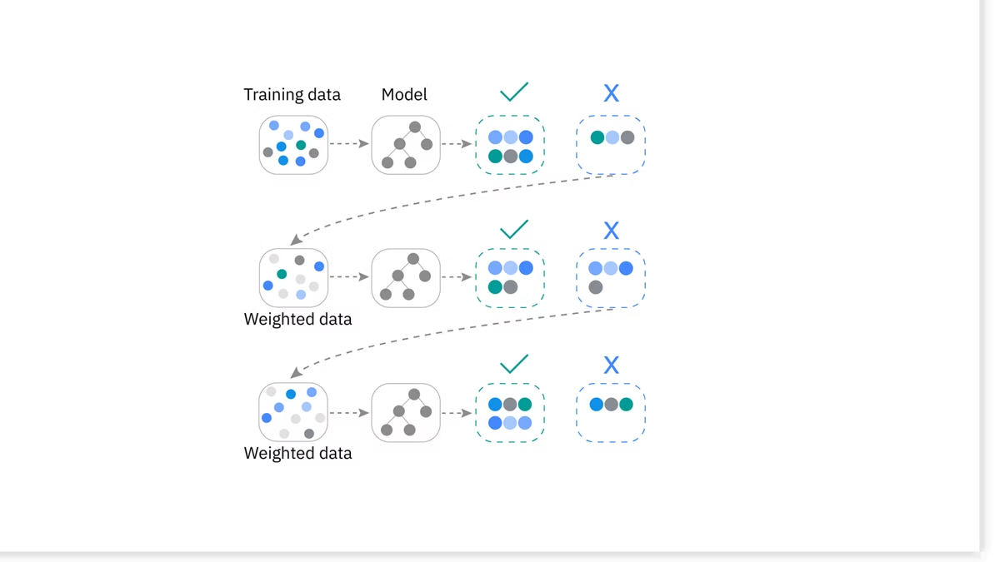

---

### 8.1 From Bagging to Boosting

**Random Forest (Bagging):**
- Build trees INDEPENDENTLY in parallel
- Each tree sees different random sample
- Average predictions
- Reduces variance

**Gradient Boosting:**
- Build trees SEQUENTIALLY
- Each tree corrects mistakes of previous trees
- Add predictions (weighted)
- Reduces bias AND variance

**Key Difference:**
Random Forest: "Let's ask many experts and average their opinions"
Gradient Boosting: "Let's learn from our mistakes and keep improving"

---

### 8.2 How Gradient Boosting Works

**Intuitive Explanation:**

**Step 1:** Start with a simple prediction (e.g., mean of all prices)

**Step 2:** Calculate errors (residuals) for all samples

**Step 3:** Train a tree to predict these ERRORS

**Step 4:** Update predictions by adding the tree's predictions (with small learning rate)

**Step 5:** Calculate NEW errors

**Step 6:** Repeat steps 3-5 for N iterations

**Final Prediction:**
$$\hat{y} = \text{Initial} + \eta \times \text{Tree}_1 + \eta \times \text{Tree}_2 + ... + \eta \times \text{Tree}_N$$

Where $\eta$ is the learning rate (typically 0.01 to 0.3)

---

### 8.3 Mathematical Foundation

**Goal:** Minimize loss function $L(y, \hat{y})$

**For regression with MSE:**
$$L(y, \hat{y}) = \frac{1}{2}(y - \hat{y})^2$$

**Gradient Descent in Function Space:**

At iteration $m$:

1. Calculate pseudo-residuals (negative gradient):
   $$r_i = -\frac{\partial L(y_i, F_{m-1}(x_i))}{\partial F_{m-1}(x_i)}$$

2. For MSE, this simplifies to:
   $$r_i = y_i - F_{m-1}(x_i)$$

3. Fit tree $h_m(x)$ to predict residuals $r_i$

4. Update model:
   $$F_m(x) = F_{m-1}(x) + \eta \cdot h_m(x)$$

**Key Insight:** We're doing gradient descent, but instead of updating parameters, we're adding new functions (trees)!

---

### 8.4 The Learning Rate (Shrinkage)

**Why multiply by learning rate $\eta$?**

Without learning rate ($\eta$ = 1):
- Each tree fully corrects previous errors
- Risk of overfitting
- Less room for subsequent trees to help

With small learning rate ($\eta$ = 0.1):
- Each tree makes small correction
- Need more trees (higher N)
- Better generalization
- More robust model

**Trade-off:**

| Learning Rate | N Trees Needed | Overfitting Risk | Training Time |
|---------------|----------------|------------------|---------------|
| High (0.3-1.0) | Low (50-100) | HIGH | Fast |
| Medium (0.1) | Medium (100-300) | Medium | Medium |
| Low (0.01-0.05) | High (500-1000+) | LOW | Slow |

**Rule of Thumb:** Lower learning rate + more trees = better performance (but slower)

---

### 8.5 Key Hyperparameters

**Most Important:**

**n_estimators (Number of trees)**
- More trees = better fit (but can overfit)
- Typical: 100-500
- Use early stopping to find optimal

**learning_rate (Shrinkage)**
- Controls contribution of each tree
- Typical: 0.01-0.3
- Lower = need more trees

**max_depth (Tree complexity)**
- Shallow trees (3-5) work best for boosting!
- Unlike Random Forest (which uses deep trees)
- Typical: 3-8

**Other Important:**

**subsample (Stochastic gradient boosting)**
- Fraction of samples per tree (e.g., 0.8 = 80%)
- Adds randomness, reduces overfitting
- Similar to Random Forest's bootstrap

**min_samples_split / min_samples_leaf**
- Control tree complexity
- Higher = simpler trees

**max_features**
- Features considered per split
- Adds randomness

---

### 8.6 Gradient Boosting vs Random Forest

| Aspect | Random Forest | Gradient Boosting |
|--------|--------------|-------------------|
| **Tree Building** | Parallel (independent) | Sequential (dependent) |
| **Tree Depth** | Deep (full trees) | Shallow (3-8 levels) |
| **Tree Purpose** | Predict target | Predict residuals |
| **Combination** | Average predictions | Weighted sum |
| **Overfitting** | Hard to overfit | Easy to overfit |
| **Training Speed** | Fast (parallel) | Slower (sequential) |
| **Hyperparameter Sensitivity** | Low | HIGH |
| **Performance** | Excellent | Often better |
| **When to Use** | Quick baseline, stable | Maximum performance |

---

### 8.7 Boosting Strengths

**Why Gradient Boosting Often Wins Kaggle:**

- ✅ Excellent predictive performance
- ✅ Handles complex non-linear relationships
- ✅ Automatic feature interactions
- ✅ Works with mixed data types
- ✅ Robust to outliers (with proper loss function)
- ✅ No feature scaling needed
- ✅ Can use different loss functions (MAE, Huber, etc.)
- ✅ Sequential learning corrects systematic errors

**Gradient Boosting typically outperforms Random Forest on:**
- Large datasets
- Problems with complex feature interactions
- When properly tuned

---

### 8.8 Boosting Weaknesses

- ❌ Easy to overfit (requires careful tuning)
- ❌ Sensitive to hyperparameters
- ❌ Slower training (sequential, not parallel)
- ❌ Harder to tune than Random Forest
- ❌ Sensitive to noisy data and outliers
- ❌ Can't parallelize tree building (only features)
- ❌ Requires more computational resources

---

### 8.9 Early Stopping

**Problem:** How many trees do we need?

**Solution:** Early stopping!

**How it works:**
1. Split training data into train + validation
2. Train trees sequentially
3. Monitor validation performance after each tree
4. Stop when validation performance stops improving
5. Use the optimal number of trees

**Benefits:**
- ✅ Prevents overfitting
- ✅ Saves training time
- ✅ Automatically finds optimal n_estimators

**In sklearn:**
```python
gbm = GradientBoostingRegressor(
    n_estimators=1000,
    learning_rate=0.1,
    validation_fraction=0.2,  # Use 20% for validation
    n_iter_no_change=50,      # Stop if no improvement for 50 rounds
    random_state=42
)
```

---

### 8.10 When to Use Gradient Boosting

✅ **Use when:**
- Need maximum predictive accuracy
- Have time to tune hyperparameters
- Data is not too noisy
- Willing to trade training time for performance
- Competing in Kaggle (almost always use boosting!)

❌ **Consider Random Forest instead when:**
- Need quick baseline
- Don't have time to tune
- Data is very noisy
- Need stable, robust model with minimal tuning

**In Practice:**
1. Start with Random Forest (quick baseline)
2. Switch to Gradient Boosting for better performance
3. Use XGBoost/LightGBM/CatBoost for production (next section!)

---

Let's implement Gradient Boosting! 🚀
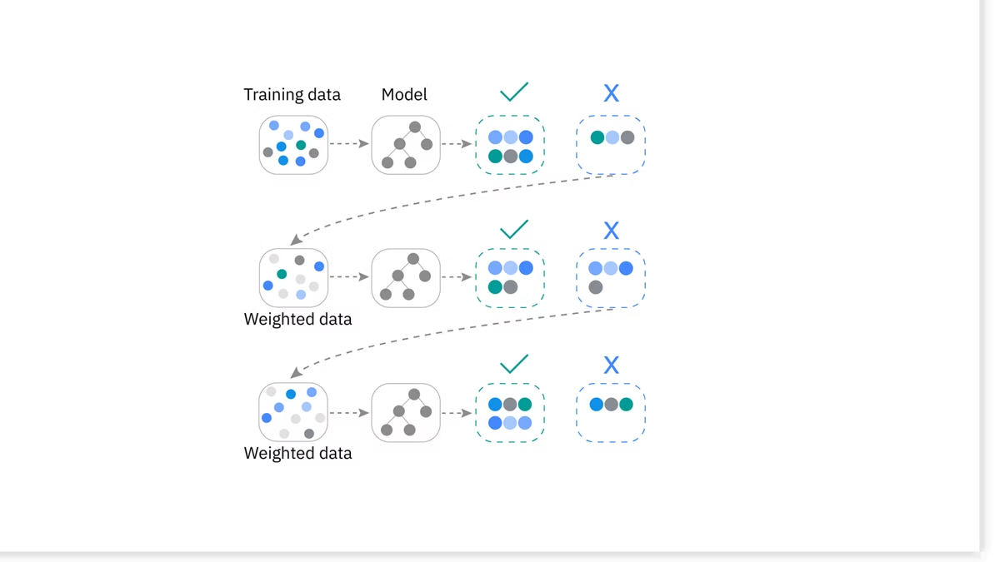

In [36]:
# ==================== GRADIENT BOOSTING: BASIC IMPLEMENTATION ====================

print("="*60)
print("GRADIENT BOOSTING REGRESSOR (sklearn)")
print("="*60)

# Train a basic Gradient Boosting model
basic_gbm = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=5,
    min_samples_split=20,
    min_samples_leaf=10,
    subsample=0.8,
    random_state=RANDOM_STATE,
    verbose=0
)

print("\n📐 Training Gradient Boosting Regressor...")
print(f"   Configuration:")
print(f"   • n_estimators: 100")
print(f"   • learning_rate: 0.1")
print(f"   • max_depth: 5")
print(f"   • subsample: 0.8 (stochastic gradient boosting)")

start_time = time.time()
basic_gbm.fit(X_train_scaled, y_train)
training_time = time.time() - start_time

print(f"\n✅ Training complete in {training_time:.2f} seconds")

# Predictions
y_pred_train_gbm = basic_gbm.predict(X_train_scaled)
y_pred_test_gbm = basic_gbm.predict(X_test_scaled)

# Metrics
train_rmse_gbm = np.sqrt(mean_squared_error(y_train, y_pred_train_gbm))
test_rmse_gbm = np.sqrt(mean_squared_error(y_test, y_pred_test_gbm))
train_r2_gbm = r2_score(y_train, y_pred_train_gbm)
test_r2_gbm = r2_score(y_test, y_pred_test_gbm)

print("\n" + "="*60)
print("PERFORMANCE METRICS")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_gbm:,.2f}")
print(f"   • R²: {train_r2_gbm:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_gbm:,.2f}")
print(f"   • R²: {test_r2_gbm:.4f}")

print(f"\n📊 Comparison with Random Forest:")
print(f"   • RF Test RMSE: ${test_rmse_rf:,.2f}")
print(f"   • GBM Test RMSE: ${test_rmse_gbm:,.2f}")
if test_rmse_gbm < test_rmse_rf:
    improvement = ((test_rmse_rf - test_rmse_gbm) / test_rmse_rf) * 100
    print(f"   ✅ GBM is {improvement:.2f}% better!")
else:
    print(f"   ⚠️ RF still performing better (GBM needs tuning)")

GRADIENT BOOSTING REGRESSOR (sklearn)

📐 Training Gradient Boosting Regressor...
   Configuration:
   • n_estimators: 100
   • learning_rate: 0.1
   • max_depth: 5
   • subsample: 0.8 (stochastic gradient boosting)

✅ Training complete in 0.52 seconds

PERFORMANCE METRICS

🎯 Training Set:
   • RMSE: $17,620.25
   • R²: 0.9479

🎯 Test Set:
   • RMSE: $30,431.51
   • R²: 0.8793

📊 Comparison with Random Forest:
   • RF Test RMSE: $35,682.55
   • GBM Test RMSE: $30,431.51
   ✅ GBM is 14.72% better!


In [37]:
# ==================== LEARNING RATE EXPERIMENT ====================

print("\n" + "="*60)
print("EXPERIMENT: Effect of Learning Rate")
print("="*60)

learning_rates = [0.01, 0.05, 0.1, 0.2, 0.3]
n_estimators_list = [100, 200, 300]

lr_results = []

for lr in learning_rates:
    for n_est in n_estimators_list:
        print(f"Testing lr={lr}, n_estimators={n_est}...", end=' ')
        
        gbm = GradientBoostingRegressor(
            n_estimators=n_est,
            learning_rate=lr,
            max_depth=5,
            subsample=0.8,
            random_state=RANDOM_STATE,
            verbose=0
        )
        
        gbm.fit(X_train_scaled, y_train)
        y_pred = gbm.predict(X_test_scaled)
        
        test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        test_r2 = r2_score(y_test, y_pred)
        
        lr_results.append({
            'learning_rate': lr,
            'n_estimators': n_est,
            'test_rmse': test_rmse,
            'test_r2': test_r2
        })
        
        print(f"RMSE: ${test_rmse:,.0f}")

lr_df = pd.DataFrame(lr_results)

print("\n📊 Results Summary:")
print(lr_df.to_string(index=False))

# Find best combination
best_lr = lr_df.loc[lr_df['test_rmse'].idxmin()]
print(f"\n✅ Best Configuration:")
print(f"   • Learning Rate: {best_lr['learning_rate']}")
print(f"   • N Estimators: {int(best_lr['n_estimators'])}")
print(f"   • Test RMSE: ${best_lr['test_rmse']:,.2f}")
print(f"   • Test R²: {best_lr['test_r2']:.4f}")


EXPERIMENT: Effect of Learning Rate
Testing lr=0.01, n_estimators=100... RMSE: $45,317
Testing lr=0.01, n_estimators=200... RMSE: $31,875
Testing lr=0.01, n_estimators=300... RMSE: $27,965
Testing lr=0.05, n_estimators=100... RMSE: $26,673
Testing lr=0.05, n_estimators=200... RMSE: $26,712
Testing lr=0.05, n_estimators=300... RMSE: $26,792
Testing lr=0.1, n_estimators=100... RMSE: $28,614
Testing lr=0.1, n_estimators=200... RMSE: $28,863
Testing lr=0.1, n_estimators=300... RMSE: $29,015
Testing lr=0.2, n_estimators=100... RMSE: $27,493
Testing lr=0.2, n_estimators=200... RMSE: $27,685
Testing lr=0.2, n_estimators=300... RMSE: $27,758
Testing lr=0.3, n_estimators=100... RMSE: $29,714
Testing lr=0.3, n_estimators=200... RMSE: $30,144
Testing lr=0.3, n_estimators=300... RMSE: $30,161

📊 Results Summary:
 learning_rate  n_estimators  test_rmse  test_r2
        0.0100           100 45316.5555   0.7323
        0.0100           200 31875.0181   0.8675
        0.0100           300 27964.9220 

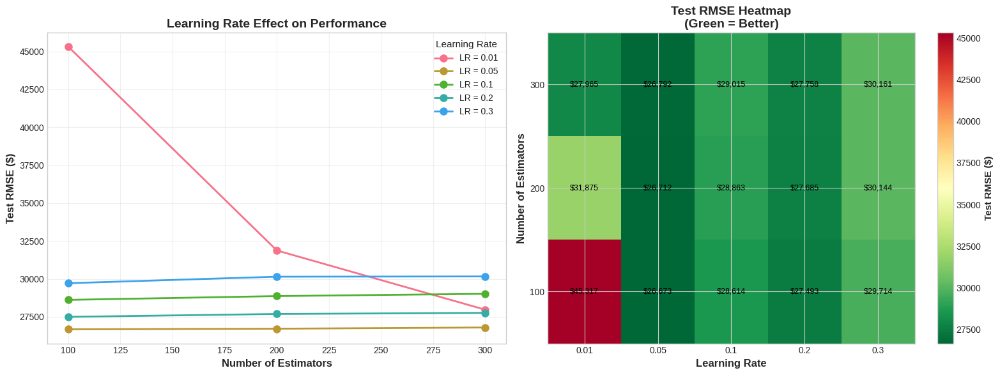


💡 Key Observations:
   • Lower learning rate generally needs more trees
   • Sweet spot often around lr=0.05-0.1
   • Too high lr (0.3+) can be unstable
   • More trees helps, but with diminishing returns


In [38]:
# ==================== VISUALIZE LEARNING RATE EFFECT ====================

# Prepare data for visualization
lr_pivot = lr_df.pivot(index='n_estimators', columns='learning_rate', values='test_rmse')

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: RMSE vs N_estimators for different learning rates
for lr in learning_rates:
    data = lr_df[lr_df['learning_rate'] == lr]
    axes[0].plot(data['n_estimators'], data['test_rmse'], 
                'o-', linewidth=2, markersize=8, label=f'LR = {lr}')

axes[0].set_xlabel('Number of Estimators', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Test RMSE ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Learning Rate Effect on Performance', fontsize=14, fontweight='bold')
axes[0].legend(title='Learning Rate', fontsize=10)
axes[0].grid(alpha=0.3)

# Plot 2: Heatmap
import matplotlib.cm as cm
lr_pivot_sorted = lr_pivot.sort_index(ascending=False)
im = axes[1].imshow(lr_pivot_sorted, cmap='RdYlGn_r', aspect='auto')
axes[1].set_xticks(range(len(learning_rates)))
axes[1].set_xticklabels(learning_rates)
axes[1].set_yticks(range(len(n_estimators_list)))
axes[1].set_yticklabels(sorted(n_estimators_list, reverse=True))
axes[1].set_xlabel('Learning Rate', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Number of Estimators', fontsize=12, fontweight='bold')
axes[1].set_title('Test RMSE Heatmap\n(Green = Better)', fontsize=14, fontweight='bold')

# Add colorbar
cbar = plt.colorbar(im, ax=axes[1])
cbar.set_label('Test RMSE ($)', fontsize=11, fontweight='bold')

# Add values to heatmap
for i in range(len(n_estimators_list)):
    for j in range(len(learning_rates)):
        text = axes[1].text(j, i, f'${lr_pivot_sorted.iloc[i, j]:,.0f}',
                          ha="center", va="center", color="black", fontsize=9)

plt.tight_layout()
plt.show()

print("\n💡 Key Observations:")
print("   • Lower learning rate generally needs more trees")
print("   • Sweet spot often around lr=0.05-0.1")
print("   • Too high lr (0.3+) can be unstable")
print("   • More trees helps, but with diminishing returns")


VISUALIZING THE BOOSTING PROCESS

Training 300 trees and tracking performance...
✅ Training complete!


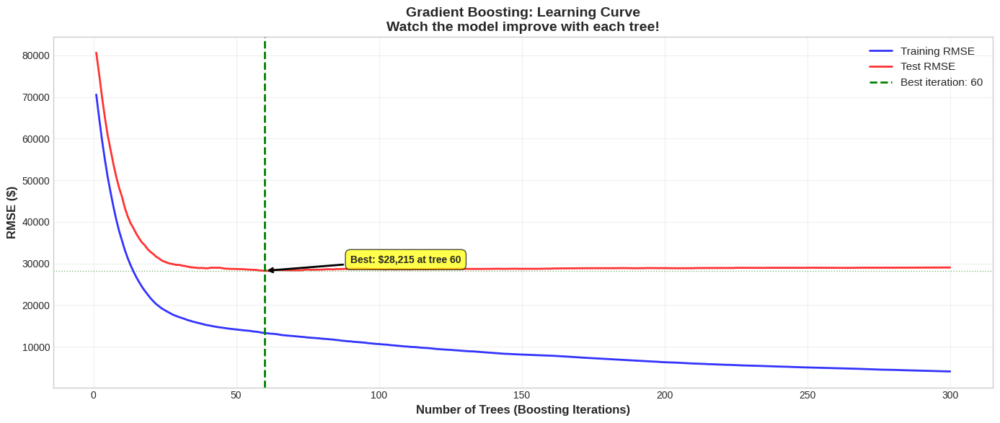


📊 Analysis:
   • Training error decreases monotonically
   • Test error has U-shape (overfitting after optimal point)
   • Best performance at iteration 60
   • Best test RMSE: $28,214.78

💡 This is why early stopping is important!
   We should stop at iteration 60, not continue to 300


In [39]:
# ==================== TRAINING CURVE: WATCH THE MODEL LEARN ====================

print("\n" + "="*60)
print("VISUALIZING THE BOOSTING PROCESS")
print("="*60)

# Train model and record performance after each tree
n_estimators = 300
train_scores = []
test_scores = []

gbm_watch = GradientBoostingRegressor(
    n_estimators=n_estimators,
    learning_rate=0.1,
    max_depth=5,
    subsample=0.8,
    random_state=RANDOM_STATE,
    verbose=0
)

print(f"\nTraining {n_estimators} trees and tracking performance...")

gbm_watch.fit(X_train_scaled, y_train)

# Get staged predictions (predictions after each tree)
for train_pred, test_pred in zip(
    gbm_watch.staged_predict(X_train_scaled),
    gbm_watch.staged_predict(X_test_scaled)
):
    train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
    train_scores.append(train_rmse)
    test_scores.append(test_rmse)

print("✅ Training complete!")

# Plot learning curves
fig, ax = plt.subplots(figsize=(14, 6))

iterations = range(1, n_estimators + 1)
ax.plot(iterations, train_scores, 'b-', linewidth=2, label='Training RMSE', alpha=0.8)
ax.plot(iterations, test_scores, 'r-', linewidth=2, label='Test RMSE', alpha=0.8)

# Find best iteration
best_iteration = np.argmin(test_scores) + 1
best_test_rmse = min(test_scores)
ax.axvline(x=best_iteration, color='green', linestyle='--', linewidth=2, 
          label=f'Best iteration: {best_iteration}')
ax.axhline(y=best_test_rmse, color='green', linestyle=':', linewidth=1, alpha=0.5)

ax.set_xlabel('Number of Trees (Boosting Iterations)', fontsize=12, fontweight='bold')
ax.set_ylabel('RMSE ($)', fontsize=12, fontweight='bold')
ax.set_title('Gradient Boosting: Learning Curve\nWatch the model improve with each tree!', 
            fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(alpha=0.3)

# Add annotation
ax.annotate(f'Best: ${best_test_rmse:,.0f} at tree {best_iteration}',
           xy=(best_iteration, best_test_rmse),
           xytext=(best_iteration + 30, best_test_rmse + 2000),
           fontsize=10, fontweight='bold',
           bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.7),
           arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0', lw=2))

plt.tight_layout()
plt.show()

print(f"\n📊 Analysis:")
print(f"   • Training error decreases monotonically")
print(f"   • Test error has U-shape (overfitting after optimal point)")
print(f"   • Best performance at iteration {best_iteration}")
print(f"   • Best test RMSE: ${best_test_rmse:,.2f}")
print(f"\n💡 This is why early stopping is important!")
print(f"   We should stop at iteration {best_iteration}, not continue to {n_estimators}")

In [40]:
# ==================== OPTIMAL GRADIENT BOOSTING MODEL ====================

print("\n" + "="*60)
print("OPTIMAL GRADIENT BOOSTING MODEL (with findings)")
print("="*60)

# Use best parameters found
optimal_gbm = GradientBoostingRegressor(
    n_estimators=int(best_lr['n_estimators']),
    learning_rate=best_lr['learning_rate'],
    max_depth=5,
    min_samples_split=20,
    min_samples_leaf=10,
    subsample=0.8,
    max_features='sqrt',
    random_state=RANDOM_STATE,
    verbose=0
)

print("\n📐 Model Configuration:")
print(f"   • n_estimators: {int(best_lr['n_estimators'])}")
print(f"   • learning_rate: {best_lr['learning_rate']}")
print(f"   • max_depth: 5")
print(f"   • subsample: 0.8")
print(f"   • max_features: sqrt")

print("\n🔧 Training final model...")
start_time = time.time()
optimal_gbm.fit(X_train_scaled, y_train)
training_time = time.time() - start_time

# Predictions
y_pred_train_gbm_opt = optimal_gbm.predict(X_train_scaled)
y_pred_test_gbm_opt = optimal_gbm.predict(X_test_scaled)

# Metrics
train_rmse_gbm_opt = np.sqrt(mean_squared_error(y_train, y_pred_train_gbm_opt))
test_rmse_gbm_opt = np.sqrt(mean_squared_error(y_test, y_pred_test_gbm_opt))
train_r2_gbm_opt = r2_score(y_train, y_pred_train_gbm_opt)
test_r2_gbm_opt = r2_score(y_test, y_pred_test_gbm_opt)
test_mae_gbm_opt = mean_absolute_error(y_test, y_pred_test_gbm_opt)

print(f"✅ Training complete in {training_time:.2f} seconds")

print("\n" + "="*60)
print("PERFORMANCE METRICS")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_gbm_opt:,.2f}")
print(f"   • R²: {train_r2_gbm_opt:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_gbm_opt:,.2f}")
print(f"   • MAE: ${test_mae_gbm_opt:,.2f}")
print(f"   • R²: {test_r2_gbm_opt:.4f}")

print(f"\n📊 Model Comparison:")
models_comparison = pd.DataFrame({
    'Model': ['Random Forest', 'GBM (sklearn)', 'Decision Tree'],
    'Test_RMSE': [test_rmse_rf, test_rmse_gbm_opt, test_rmse_tree],
    'Test_R2': [test_r2_rf, test_r2_gbm_opt, test_r2_tree]
}).sort_values('Test_RMSE')

print(models_comparison.to_string(index=False))

if test_rmse_gbm_opt < test_rmse_rf:
    improvement = ((test_rmse_rf - test_rmse_gbm_opt) / test_rmse_rf) * 100
    print(f"\n✅ Gradient Boosting is {improvement:.2f}% better than Random Forest!")


OPTIMAL GRADIENT BOOSTING MODEL (with findings)

📐 Model Configuration:
   • n_estimators: 100
   • learning_rate: 0.05
   • max_depth: 5
   • subsample: 0.8
   • max_features: sqrt

🔧 Training final model...
✅ Training complete in 0.17 seconds

PERFORMANCE METRICS

🎯 Training Set:
   • RMSE: $23,682.83
   • R²: 0.9060

🎯 Test Set:
   • RMSE: $31,094.79
   • MAE: $18,684.59
   • R²: 0.8739

📊 Model Comparison:
        Model  Test_RMSE  Test_R2
GBM (sklearn) 31094.7874   0.8739
Random Forest 35682.5519   0.8340
Decision Tree 38872.0932   0.8030

✅ Gradient Boosting is 12.86% better than Random Forest!



GRADIENT BOOSTING: FEATURE IMPORTANCE

🔝 Top 20 Most Important Features:
             Feature  Importance
         OverallQual      0.1777
           GrLivArea      0.1284
         TotalBsmtSF      0.0925
           ExterQual      0.0867
          GarageCars      0.0732
          GarageArea      0.0722
           YearBuilt      0.0616
            BsmtQual      0.0603
         KitchenQual      0.0480
            1stFlrSF      0.0356
    Foundation_PConc      0.0346
        TotRmsAbvGrd      0.0271
            FullBath      0.0264
        YearRemodAdd      0.0235
        CentralAir_Y      0.0099
   GarageType_Attchd      0.0062
Neighborhood_Crawfor      0.0056
           HeatingQC      0.0055
Neighborhood_NoRidge      0.0051
   GarageType_Detchd      0.0050

📊 Feature Importance Comparison: GBM vs Random Forest

Feature                   GBM Imp      RF Imp       Difference  
OverallQual               0.1777       0.1555       0.0221++++++
GrLivArea                 0.1284       0.1204  

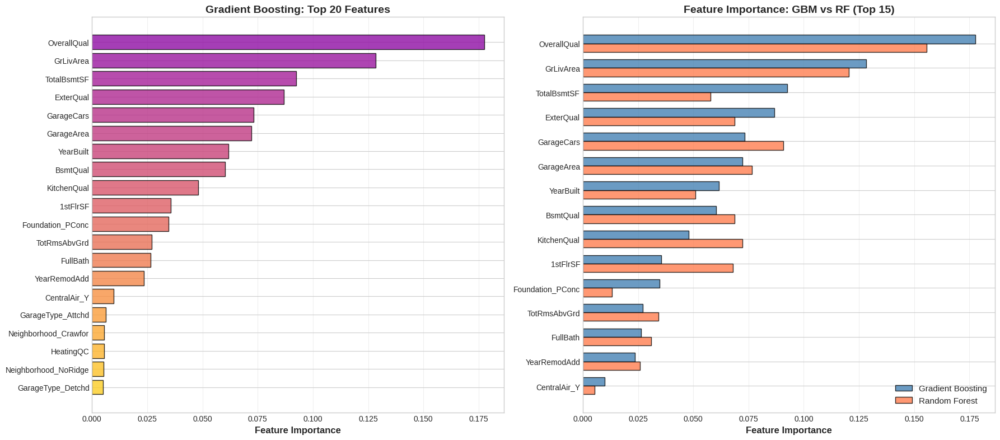


💡 Observations:
   • Both models often agree on top features
   • GBM can identify subtle patterns RF misses
   • Sequential learning helps find important interactions


In [41]:
# ==================== GBM FEATURE IMPORTANCE ====================

print("\n" + "="*60)
print("GRADIENT BOOSTING: FEATURE IMPORTANCE")
print("="*60)

# Get feature importances
gbm_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Importance': optimal_gbm.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n🔝 Top 20 Most Important Features:")
print(gbm_importance.head(20).to_string(index=False))

# Compare with Random Forest
print(f"\n📊 Feature Importance Comparison: GBM vs Random Forest")
print(f"\n{'Feature':<25} {'GBM Imp':<12} {'RF Imp':<12} {'Difference':<12}")
print("="*65)

rf_importance_dict = dict(zip(X_train_scaled.columns, optimal_rf.feature_importances_))
for idx, row in gbm_importance.head(10).iterrows():
    feat = row['Feature']
    gbm_imp = row['Importance']
    rf_imp = rf_importance_dict.get(feat, 0)
    diff = gbm_imp - rf_imp
    print(f"{feat:<25} {gbm_imp:<12.4f} {rf_imp:<12.4f} {diff:+<12.4f}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

top_n = 20

# GBM importance
top_gbm = gbm_importance.head(top_n)
colors_gbm = plt.cm.plasma(np.linspace(0.3, 0.9, top_n))
axes[0].barh(range(top_n), top_gbm['Importance'], color=colors_gbm, alpha=0.8, edgecolor='black')
axes[0].set_yticks(range(top_n))
axes[0].set_yticklabels(top_gbm['Feature'])
axes[0].set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
axes[0].set_title(f'Gradient Boosting: Top {top_n} Features', fontsize=14, fontweight='bold')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# Comparison (top 15)
comparison_features = gbm_importance.head(15)['Feature'].tolist()
gbm_vals = [gbm_importance[gbm_importance['Feature']==f]['Importance'].values[0] for f in comparison_features]
rf_vals = [rf_importance_dict.get(f, 0) for f in comparison_features]

x = np.arange(len(comparison_features))
width = 0.35

axes[1].barh(x - width/2, gbm_vals, width, label='Gradient Boosting', 
            alpha=0.8, color='steelblue', edgecolor='black')
axes[1].barh(x + width/2, rf_vals, width, label='Random Forest', 
            alpha=0.8, color='coral', edgecolor='black')

axes[1].set_yticks(x)
axes[1].set_yticklabels(comparison_features)
axes[1].set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
axes[1].set_title('Feature Importance: GBM vs RF (Top 15)', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].invert_yaxis()
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Observations:")
print("   • Both models often agree on top features")
print("   • GBM can identify subtle patterns RF misses")
print("   • Sequential learning helps find important interactions")

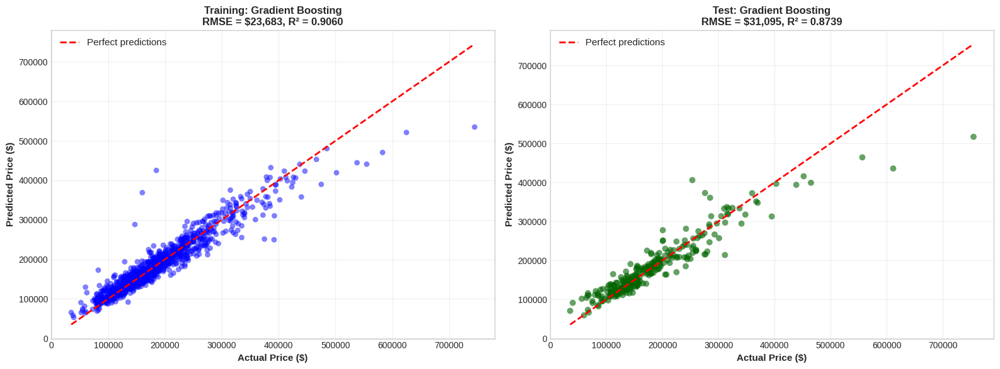

In [42]:
# ==================== ACTUAL VS PREDICTED (GBM) ====================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Training
axes[0].scatter(y_train, y_pred_train_gbm_opt, alpha=0.5, s=40, color='blue', edgecolor='none')
axes[0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 
            'r--', linewidth=2, label='Perfect predictions')
axes[0].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[0].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[0].set_title(f'Training: Gradient Boosting\nRMSE = ${train_rmse_gbm_opt:,.0f}, R² = {train_r2_gbm_opt:.4f}', 
                 fontsize=12, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Test
axes[1].scatter(y_test, y_pred_test_gbm_opt, alpha=0.6, s=50, color='darkgreen', edgecolor='none')
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
            'r--', linewidth=2, label='Perfect predictions')
axes[1].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
axes[1].set_title(f'Test: Gradient Boosting\nRMSE = ${test_rmse_gbm_opt:,.0f}, R² = {test_r2_gbm_opt:.4f}', 
                 fontsize=12, fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

---

### 8.11 Key Takeaways: Gradient Boosting

**What We Learned:**

**Core Concept:**
- Sequential learning: each tree corrects previous mistakes
- Gradient descent in function space
- Learning rate controls step size

**Critical Hyperparameters:**
- n_estimators: more is better (until overfitting)
- learning_rate: lower = need more trees but better generalization
- max_depth: shallow trees (3-5) work best!
- subsample: adds randomness, prevents overfitting

**Performance:**
- Often outperforms Random Forest
- Requires more tuning
- Training is slower (sequential)
- Prediction speed similar to RF

**Best Practices:**
- Use early stopping
- Start with learning_rate=0.1, n_estimators=100
- Keep trees shallow (max_depth=3-5)
- Use subsample=0.8 for stochastic boosting
- Monitor train vs test curves

**Next:** We'll explore advanced implementations (XGBoost, LightGBM, CatBoost) that are faster and more powerful!

---

<a id="section9"></a>
## 9. Advanced Boosting: XGBoost, LightGBM, CatBoost

---

### 9.1 Why Advanced Boosting Libraries?

**sklearn GradientBoostingRegressor is good, but:**

- ❌ Slower training (especially on large data)
- ❌ Limited built-in regularization
- ❌ No GPU support
- ❌ No categorical feature handling
- ❌ No missing value handling
- ❌ Less flexible

**Modern alternatives:**

- **XGBoost** (2014): Extreme Gradient Boosting
- **LightGBM** (2017): Light Gradient Boosting Machine (Microsoft)
- **CatBoost** (2017): Categorical Boosting (Yandex)

**Why they dominate Kaggle:**

- ✅ 10-100x faster training
- ✅ Better accuracy
- ✅ Built-in regularization
- ✅ Handle missing values
- ✅ GPU support
- ✅ Production-ready
- ✅ Active development

---

### 9.2 XGBoost (eXtreme Gradient Boosting)

**What Makes XGBoost Special:**

**1. Regularized Learning Objective**

Loss function includes L1 and L2 penalties:
$$\text{Obj} = \sum_{i=1}^{n} L(y_i, \hat{y}_i) + \sum_{k=1}^{K} \Omega(f_k)$$

Where:
$$\Omega(f) = \gamma T + \frac{1}{2}\lambda \sum_{j=1}^{T} w_j^2$$

- $T$ = number of leaves
- $w_j$ = leaf weights
- $\gamma$ = complexity penalty
- $\lambda$ = L2 regularization

**2. System Optimizations**

- Parallel tree construction
- Cache-aware access
- Out-of-core computing (data doesn't fit in RAM)
- Sparsity-aware algorithm (handles missing values)

**3. Algorithmic Enhancements**

- Tree pruning using max_depth
- Built-in cross-validation
- Early stopping
- Custom objective functions

---

**Key XGBoost Hyperparameters:**

**Tree Structure:**
- max_depth: Maximum tree depth (3-10, default=6)
- min_child_weight: Minimum sum of weights in child (1-10)
- gamma: Minimum loss reduction for split (0-5)

**Boosting:**
- learning_rate (eta): Step size shrinkage (0.01-0.3)
- n_estimators: Number of trees (100-1000)
- subsample: Row sampling ratio (0.5-1.0)
- colsample_bytree: Column sampling ratio (0.5-1.0)

**Regularization:**
- lambda (reg_lambda): L2 regularization (0-10)
- alpha (reg_alpha): L1 regularization (0-10)

**When to Use XGBoost:**

- ✅ General-purpose boosting (works everywhere)
- ✅ Need speed + accuracy
- ✅ Have structured/tabular data
- ✅ Want proven, battle-tested library
- ✅ Kaggle competitions

---

### 9.3 LightGBM (Light Gradient Boosting Machine)

**Microsoft's Innovation: Histogram-Based Learning**

**Key Difference from XGBoost:**

**Traditional (XGBoost):**
- Level-wise tree growth (grows all nodes at same level)
- Exact split finding
- Slower on large datasets

**LightGBM:**
- Leaf-wise tree growth (grows best leaf first)
- Histogram-based splitting (bins features)
- MUCH faster training

**Histogram-Based Algorithm:**
1. Bin continuous features into discrete bins (e.g., 255 bins)
2. Build histogram of gradients
3. Find best split using histogram (O(bins) instead of O(data))

**Result:** 
- 10-20x faster than XGBoost on large data
- Lower memory usage
- Often better accuracy

---

**Leaf-Wise vs Level-Wise Growth:**
```
Level-Wise (XGBoost):          Leaf-Wise (LightGBM):
        Root                            Root
       /    \                          /    \
      A      B                        A      B
     / \    / \                      / \
    C   D  E   F                    C   D
                                   / \
                                  E   F
```

- Level-wise: Balanced tree, slower growth
- Leaf-wise: Deeper tree, faster convergence, risk of overfitting

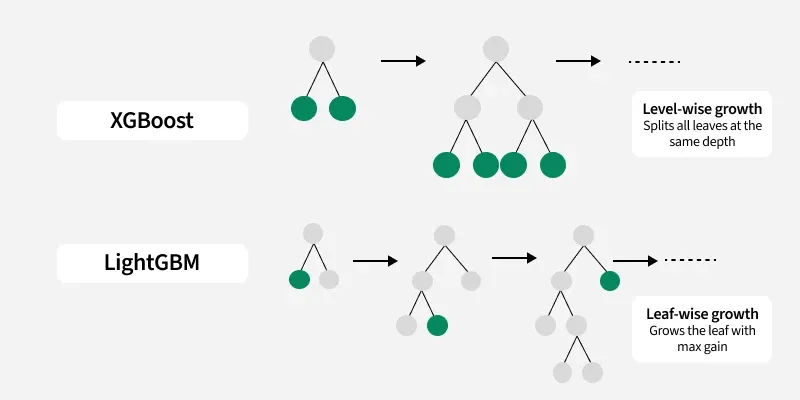

---

**Key LightGBM Hyperparameters:**

**Tree Structure:**
- num_leaves: Max leaves (7-4095, default=31) - MOST IMPORTANT!
- max_depth: Maximum depth (-1=no limit)
- min_data_in_leaf: Minimum samples per leaf (20-1000)

**Boosting:**
- learning_rate: Step size (0.01-0.3)
- n_estimators: Number of trees
- bagging_fraction: Row sampling (0.5-1.0)
- feature_fraction: Column sampling (0.5-1.0)

**Regularization:**
- lambda_l2: L2 regularization
- lambda_l1: L1 regularization

**When to Use LightGBM:**

- ✅ Large datasets (>10K rows)
- ✅ Need fast training
- ✅ High-dimensional data
- ✅ Memory constraints
- ✅ Production deployment (speed matters)

**Warning:** Easier to overfit than XGBoost (due to leaf-wise growth)

---

### 9.4 CatBoost (Categorical Boosting)

**Yandex's Innovation: Native Categorical Feature Handling**

**Key Difference: Ordered Target Statistics**

**Problem with Traditional Encoding:**
Target encoding can leak information (target leakage)

**CatBoost's Solution:**
Ordered boosting - uses only PAST data to encode categories

**Example:**
```
Data: [Cat A, Cat B, Cat A, Cat C, Cat A]
Target: [100, 150, 120, 200, 130]

Traditional mean encoding for Cat A:
- Uses ALL Cat A samples: (100+120+130)/3 = 116.67
- LEAKAGE! Uses future data

CatBoost ordered encoding for Cat A:
- Sample 1: No prior → use global mean
- Sample 3: Use only sample 1 → 100
- Sample 5: Use samples 1,3 → (100+120)/2 = 110
- NO LEAKAGE! Only past data
```

---

**Other CatBoost Innovations:**

**1. Symmetric Trees**
- All splits at same level use same feature
- Faster prediction
- Less overfitting

**2. Automatic Categorical Handling**
- No need for manual encoding!
- Just specify cat_features parameter

**3. Robust to Overfitting**
- Ordered boosting reduces overfitting
- Less hyperparameter tuning needed

---

**Key CatBoost Hyperparameters:**

**Tree Structure:**
- depth: Maximum depth (4-10, default=6)
- l2_leaf_reg: L2 regularization (1-10, default=3)

**Boosting:**
- learning_rate: Step size (0.01-0.3)
- iterations: Number of trees
- subsample: Row sampling
- rsm: Column sampling (Random Subspace Method)

**Categorical:**
- cat_features: List of categorical feature indices
- one_hot_max_size: Max categories for one-hot (default=2)

**When to Use CatBoost:**

- ✅ Many categorical features
- ✅ Don't want to encode manually
- ✅ Need robust model (less tuning)
- ✅ Want to avoid overfitting
- ✅ Text data (treats as categorical)

---

### 9.5 XGBoost vs LightGBM vs CatBoost: Quick Comparison

| Aspect | XGBoost | LightGBM | CatBoost |
|--------|---------|----------|----------|
| **Speed** | Fast | Fastest | Fast |
| **Accuracy** | Excellent | Excellent | Excellent |
| **Large Data** | Good | Best | Good |
| **Categorical Features** | Manual encoding | Manual encoding | Native support |
| **Overfitting Risk** | Medium | Higher | Lower |
| **Memory Usage** | Medium | Low | Medium |
| **GPU Support** | ✅ Yes | ✅ Yes | ✅ Yes |
| **Tuning Complexity** | Medium | Higher | Lower |
| **Best For** | General purpose | Large datasets | Many categoricals |
| **Industry Adoption** | Highest | Growing | Growing |

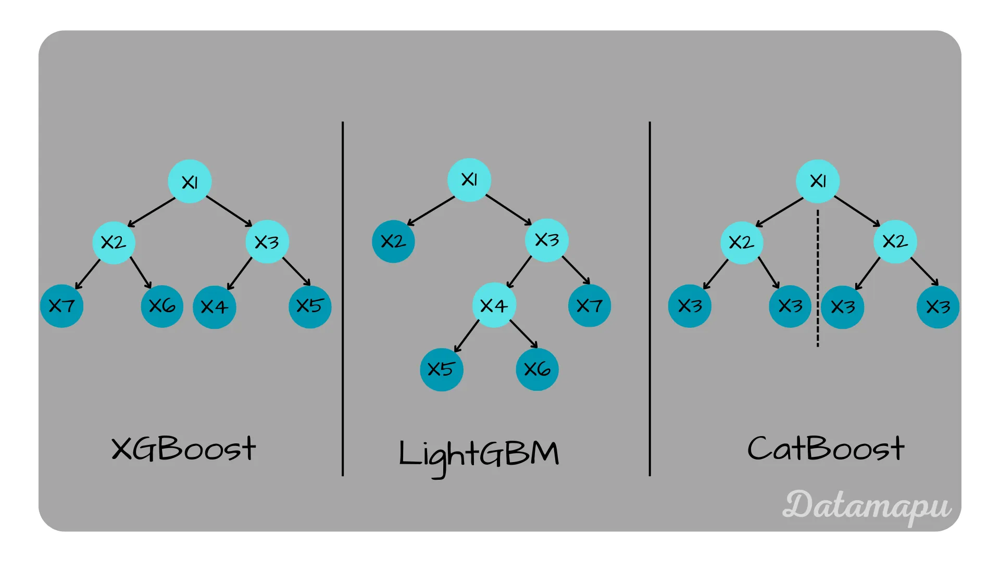

---

### 9.6 Which One Should You Use?

**Decision Tree:**
```
Start here
    ↓
Do you have many categorical features?
    YES → Try CatBoost first
    NO → Continue
        ↓
    Is data large (>100K rows)?
        YES → Try LightGBM first
        NO → Continue
            ↓
        Want most robust choice?
            → Use XGBoost
```

**In Practice:**
1. Try all three!
2. They train fast enough to test multiple
3. Ensemble them for best results
4. XGBoost is safest default choice

**Kaggle Winners Often:**
- Train all three
- Ensemble predictions
- Use stacking

---

Let's implement all three! 🚀
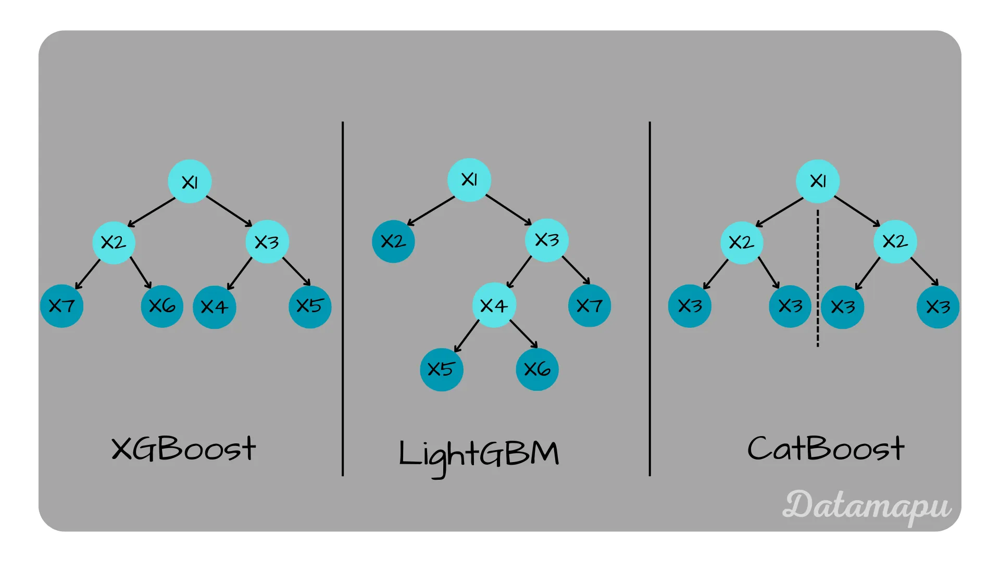
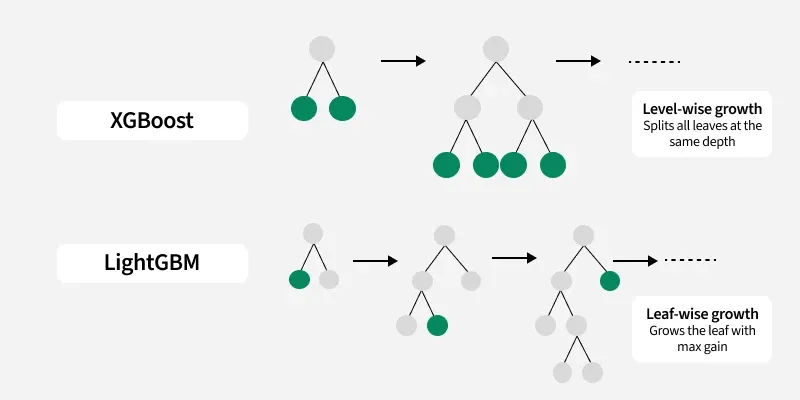

In [43]:
# ==================== XGBOOST ====================

print("="*60)
print("XGBOOST (eXtreme Gradient Boosting)")
print("="*60)

# Train XGBoost
xgb_model = xgb.XGBRegressor(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=5,
    min_child_weight=3,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbosity=0
)

print("\n📐 XGBoost Configuration:")
print("   • n_estimators: 200")
print("   • learning_rate: 0.1")
print("   • max_depth: 5")
print("   • subsample: 0.8")
print("   • colsample_bytree: 0.8")
print("   • reg_alpha (L1): 0.1")
print("   • reg_lambda (L2): 1.0")

print("\n🔧 Training XGBoost...")
start_time = time.time()
xgb_model.fit(X_train_scaled, y_train)
xgb_time = time.time() - start_time

# Predictions
y_pred_train_xgb = xgb_model.predict(X_train_scaled)
y_pred_test_xgb = xgb_model.predict(X_test_scaled)

# Metrics
train_rmse_xgb = np.sqrt(mean_squared_error(y_train, y_pred_train_xgb))
test_rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_test_xgb))
train_r2_xgb = r2_score(y_train, y_pred_train_xgb)
test_r2_xgb = r2_score(y_test, y_pred_test_xgb)
test_mae_xgb = mean_absolute_error(y_test, y_pred_test_xgb)

print(f"✅ Training complete in {xgb_time:.2f} seconds")

print("\n" + "="*60)
print("XGBOOST PERFORMANCE")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_xgb:,.2f}")
print(f"   • R²: {train_r2_xgb:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_xgb:,.2f}")
print(f"   • MAE: ${test_mae_xgb:,.2f}")
print(f"   • R²: {test_r2_xgb:.4f}")

XGBOOST (eXtreme Gradient Boosting)

📐 XGBoost Configuration:
   • n_estimators: 200
   • learning_rate: 0.1
   • max_depth: 5
   • subsample: 0.8
   • colsample_bytree: 0.8
   • reg_alpha (L1): 0.1
   • reg_lambda (L2): 1.0

🔧 Training XGBoost...
✅ Training complete in 0.22 seconds

XGBOOST PERFORMANCE

🎯 Training Set:
   • RMSE: $9,211.20
   • R²: 0.9858

🎯 Test Set:
   • RMSE: $27,894.46
   • MAE: $18,023.96
   • R²: 0.8986


In [44]:
# ==================== LIGHTGBM ====================

print("\n" + "="*60)
print("LIGHTGBM (Light Gradient Boosting Machine)")
print("="*60)

# Train LightGBM
lgb_model = lgb.LGBMRegressor(
    n_estimators=200,
    learning_rate=0.1,
    num_leaves=31,
    max_depth=5,
    min_child_samples=20,
    subsample=0.8,
    subsample_freq=1,
    colsample_bytree=0.8,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=-1
)

print("\n📐 LightGBM Configuration:")
print("   • n_estimators: 200")
print("   • learning_rate: 0.1")
print("   • num_leaves: 31 (MOST IMPORTANT)")
print("   • max_depth: 5")
print("   • subsample: 0.8")
print("   • colsample_bytree: 0.8")

print("\n🔧 Training LightGBM...")
start_time = time.time()
lgb_model.fit(X_train_scaled, y_train)
lgb_time = time.time() - start_time

# Predictions
y_pred_train_lgb = lgb_model.predict(X_train_scaled)
y_pred_test_lgb = lgb_model.predict(X_test_scaled)

# Metrics
train_rmse_lgb = np.sqrt(mean_squared_error(y_train, y_pred_train_lgb))
test_rmse_lgb = np.sqrt(mean_squared_error(y_test, y_pred_test_lgb))
train_r2_lgb = r2_score(y_train, y_pred_train_lgb)
test_r2_lgb = r2_score(y_test, y_pred_test_lgb)
test_mae_lgb = mean_absolute_error(y_test, y_pred_test_lgb)

print(f"✅ Training complete in {lgb_time:.2f} seconds")

print("\n" + "="*60)
print("LIGHTGBM PERFORMANCE")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_lgb:,.2f}")
print(f"   • R²: {train_r2_lgb:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_lgb:,.2f}")
print(f"   • MAE: ${test_mae_lgb:,.2f}")
print(f"   • R²: {test_r2_lgb:.4f}")

print(f"\n⚡ Speed Comparison:")
print(f"   • XGBoost: {xgb_time:.2f}s")
print(f"   • LightGBM: {lgb_time:.2f}s")
print(f"   • LightGBM is {xgb_time/lgb_time:.1f}x faster!")


LIGHTGBM (Light Gradient Boosting Machine)

📐 LightGBM Configuration:
   • n_estimators: 200
   • learning_rate: 0.1
   • num_leaves: 31 (MOST IMPORTANT)
   • max_depth: 5
   • subsample: 0.8
   • colsample_bytree: 0.8

🔧 Training LightGBM...
✅ Training complete in 0.13 seconds

LIGHTGBM PERFORMANCE

🎯 Training Set:
   • RMSE: $18,293.25
   • R²: 0.9439

🎯 Test Set:
   • RMSE: $30,092.40
   • MAE: $18,348.73
   • R²: 0.8819

⚡ Speed Comparison:
   • XGBoost: 0.22s
   • LightGBM: 0.13s
   • LightGBM is 1.7x faster!


In [45]:
# ==================== CATBOOST ====================

print("\n" + "="*60)
print("CATBOOST (Categorical Boosting)")
print("="*60)

# Train CatBoost
cat_model = CatBoostRegressor(
    iterations=200,
    learning_rate=0.1,
    depth=5,
    l2_leaf_reg=3,
    subsample=0.8,
    rsm=0.8,  # Random Subspace Method (like colsample_bytree)
    random_state=RANDOM_STATE,
    verbose=0,
    thread_count=-1
)

print("\n📐 CatBoost Configuration:")
print("   • iterations: 200")
print("   • learning_rate: 0.1")
print("   • depth: 5")
print("   • l2_leaf_reg: 3")
print("   • subsample: 0.8")
print("   • rsm: 0.8")

print("\n🔧 Training CatBoost...")
start_time = time.time()
cat_model.fit(X_train_scaled, y_train)
cat_time = time.time() - start_time

# Predictions
y_pred_train_cat = cat_model.predict(X_train_scaled)
y_pred_test_cat = cat_model.predict(X_test_scaled)

# Metrics
train_rmse_cat = np.sqrt(mean_squared_error(y_train, y_pred_train_cat))
test_rmse_cat = np.sqrt(mean_squared_error(y_test, y_pred_test_cat))
train_r2_cat = r2_score(y_train, y_pred_train_cat)
test_r2_cat = r2_score(y_test, y_pred_test_cat)
test_mae_cat = mean_absolute_error(y_test, y_pred_test_cat)

print(f"✅ Training complete in {cat_time:.2f} seconds")

print("\n" + "="*60)
print("CATBOOST PERFORMANCE")
print("="*60)

print(f"\n🎯 Training Set:")
print(f"   • RMSE: ${train_rmse_cat:,.2f}")
print(f"   • R²: {train_r2_cat:.4f}")

print(f"\n🎯 Test Set:")
print(f"   • RMSE: ${test_rmse_cat:,.2f}")
print(f"   • MAE: ${test_mae_cat:,.2f}")
print(f"   • R²: {test_r2_cat:.4f}")

print(f"\n⚡ Training Time Summary:")
print(f"   • XGBoost: {xgb_time:.2f}s")
print(f"   • LightGBM: {lgb_time:.2f}s")
print(f"   • CatBoost: {cat_time:.2f}s")


CATBOOST (Categorical Boosting)

📐 CatBoost Configuration:
   • iterations: 200
   • learning_rate: 0.1
   • depth: 5
   • l2_leaf_reg: 3
   • subsample: 0.8
   • rsm: 0.8

🔧 Training CatBoost...
✅ Training complete in 0.34 seconds

CATBOOST PERFORMANCE

🎯 Training Set:
   • RMSE: $16,746.17
   • R²: 0.9530

🎯 Test Set:
   • RMSE: $27,442.75
   • MAE: $17,925.05
   • R²: 0.9018

⚡ Training Time Summary:
   • XGBoost: 0.22s
   • LightGBM: 0.13s
   • CatBoost: 0.34s


In [46]:
# ==================== COMPREHENSIVE MODEL COMPARISON ====================

print("\n" + "="*60)
print("COMPLETE MODEL COMPARISON: ALL MODELS")
print("="*60)

# Create comprehensive comparison
all_models_comparison = pd.DataFrame({
    'Model': [
        'Simple Linear Regression',
        'Multiple Linear Regression',
        'Ridge',
        'Lasso',
        'ElasticNet',
        'Decision Tree',
        'Random Forest',
        'Gradient Boosting (sklearn)',
        'XGBoost',
        'LightGBM',
        'CatBoost'
    ],
    'Test_RMSE': [
        test_rmse,
        test_rmse_mlr,
        best_ridge['test_rmse'],
        best_lasso['test_rmse'],
        best_en['test_rmse'],
        test_rmse_tree,
        test_rmse_rf,
        test_rmse_gbm_opt,
        test_rmse_xgb,
        test_rmse_lgb,
        test_rmse_cat
    ],
    'Test_R2': [
        test_r2,
        test_r2_mlr,
        best_ridge['test_r2'],
        best_lasso['test_r2'],
        best_en['test_r2'],
        test_r2_tree,
        test_r2_rf,
        test_r2_gbm_opt,
        test_r2_xgb,
        test_r2_lgb,
        test_r2_cat
    ],
    'Test_MAE': [
        mean_absolute_error(y_test, simple_lr.predict(X_test_simple)),
        test_mae_mlr,
        mean_absolute_error(y_test, best_ridge_model.predict(X_test_scaled)),
        mean_absolute_error(y_test, best_lasso_model.predict(X_test_scaled)),
        mean_absolute_error(y_test, best_en_model.predict(X_test_scaled)),
        mean_absolute_error(y_test, y_pred_test_tree),
        test_mae_rf,
        test_mae_gbm_opt,
        test_mae_xgb,
        test_mae_lgb,
        test_mae_cat
    ],
    'Model_Type': [
        'Linear',
        'Linear',
        'Linear',
        'Linear',
        'Linear',
        'Tree',
        'Ensemble',
        'Boosting',
        'Boosting',
        'Boosting',
        'Boosting'
    ]
})

# Sort by RMSE
all_models_comparison = all_models_comparison.sort_values('Test_RMSE')

print("\n📊 COMPLETE RANKING (sorted by Test RMSE):")
print(all_models_comparison.to_string(index=False))

# Find top 3
print("\n🏆 TOP 3 MODELS:")
for i in range(3):
    model = all_models_comparison.iloc[i]
    print(f"\n{i+1}. {model['Model']}")
    print(f"   • RMSE: ${model['Test_RMSE']:,.2f}")
    print(f"   • R²: {model['Test_R2']:.4f}")
    print(f"   • MAE: ${model['Test_MAE']:,.2f}")

# Best model
best = all_models_comparison.iloc[0]
print(f"\n" + "="*60)
print(f"🥇 WINNER: {best['Model']}")
print(f"="*60)
print(f"   • Test RMSE: ${best['Test_RMSE']:,.2f}")
print(f"   • Test R²: {best['Test_R2']:.4f}")
print(f"   • Test MAE: ${best['Test_MAE']:,.2f}")


COMPLETE MODEL COMPARISON: ALL MODELS

📊 COMPLETE RANKING (sorted by Test RMSE):
                      Model  Test_RMSE  Test_R2   Test_MAE Model_Type
                   CatBoost 27442.7473   0.9018 17925.0524   Boosting
                    XGBoost 27894.4571   0.8986 18023.9551   Boosting
   Simple Linear Regression 29015.2867   0.8814 33343.2421     Linear
                   LightGBM 30092.4004   0.8819 18348.7319   Boosting
Gradient Boosting (sklearn) 31094.7874   0.8739 18684.5926   Boosting
                      Lasso 35102.7291   0.8394 21534.4583     Linear
 Multiple Linear Regression 35108.0953   0.8393 21550.9062     Linear
                      Ridge 35108.0978   0.8393 21550.9028     Linear
                 ElasticNet 35108.3939   0.8393 21550.5164     Linear
              Random Forest 35682.5519   0.8340 20356.4785   Ensemble
              Decision Tree 38872.0932   0.8030 23264.5221       Tree

🏆 TOP 3 MODELS:

1. CatBoost
   • RMSE: $27,442.75
   • R²: 0.9018
   • MAE: 

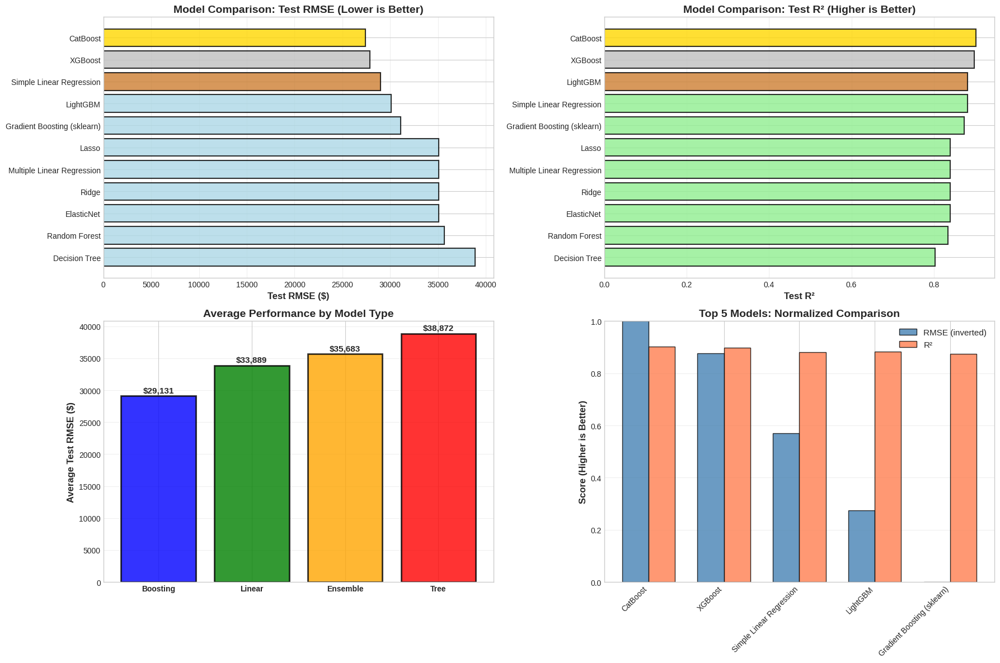


📊 Key Insights:
   • Boosting models (XGBoost, LightGBM, CatBoost) dominate top positions
   • Ensemble methods outperform single models
   • Linear models provide good baseline but limited by linear assumption
   • Tree-based models handle non-linear relationships better


In [47]:
# ==================== VISUALIZATION: MODEL COMPARISON ====================

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Plot 1: RMSE by Model
comparison_sorted = all_models_comparison.sort_values('Test_RMSE')
colors = ['gold', 'silver', '#CD7F32'] + ['lightblue'] * (len(comparison_sorted) - 3)

axes[0, 0].barh(range(len(comparison_sorted)), comparison_sorted['Test_RMSE'], 
               color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(comparison_sorted)))
axes[0, 0].set_yticklabels(comparison_sorted['Model'])
axes[0, 0].set_xlabel('Test RMSE ($)', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Model Comparison: Test RMSE (Lower is Better)', fontsize=14, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Plot 2: R² by Model
comparison_r2 = all_models_comparison.sort_values('Test_R2', ascending=False)
colors2 = ['gold', 'silver', '#CD7F32'] + ['lightgreen'] * (len(comparison_r2) - 3)

axes[0, 1].barh(range(len(comparison_r2)), comparison_r2['Test_R2'], 
               color=colors2, alpha=0.8, edgecolor='black', linewidth=1.5)
axes[0, 1].set_yticks(range(len(comparison_r2)))
axes[0, 1].set_yticklabels(comparison_r2['Model'])
axes[0, 1].set_xlabel('Test R²', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Model Comparison: Test R² (Higher is Better)', fontsize=14, fontweight='bold')
axes[0, 1].invert_yaxis()
axes[0, 1].grid(axis='x', alpha=0.3)

# Plot 3: RMSE by Model Type
model_type_summary = all_models_comparison.groupby('Model_Type')['Test_RMSE'].mean().sort_values()
axes[1, 0].bar(range(len(model_type_summary)), model_type_summary.values, 
              alpha=0.8, color=['blue', 'green', 'orange', 'red'], edgecolor='black', linewidth=2)
axes[1, 0].set_xticks(range(len(model_type_summary)))
axes[1, 0].set_xticklabels(model_type_summary.index, fontweight='bold')
axes[1, 0].set_ylabel('Average Test RMSE ($)', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Average Performance by Model Type', fontsize=14, fontweight='bold')
axes[1, 0].grid(axis='y', alpha=0.3)

# Add values on bars
for i, v in enumerate(model_type_summary.values):
    axes[1, 0].text(i, v + 500, f'${v:,.0f}', ha='center', fontweight='bold', fontsize=11)

# Plot 4: Top 5 Models - Detailed Comparison
top5 = all_models_comparison.head(5)
x = np.arange(len(top5))
width = 0.35

# Normalize RMSE and MAE to 0-1 scale for visualization
rmse_normalized = (top5['Test_RMSE'] - top5['Test_RMSE'].min()) / (top5['Test_RMSE'].max() - top5['Test_RMSE'].min())
r2_values = top5['Test_R2'].values

axes[1, 1].bar(x - width/2, 1 - rmse_normalized, width, label='RMSE (inverted)', 
              alpha=0.8, color='steelblue', edgecolor='black')
axes[1, 1].bar(x + width/2, r2_values, width, label='R²', 
              alpha=0.8, color='coral', edgecolor='black')

axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(top5['Model'], rotation=45, ha='right')
axes[1, 1].set_ylabel('Score (Higher is Better)', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Top 5 Models: Normalized Comparison', fontsize=14, fontweight='bold')
axes[1, 1].legend(fontsize=11)
axes[1, 1].grid(axis='y', alpha=0.3)
axes[1, 1].set_ylim([0, 1])

plt.tight_layout()
plt.show()

print("\n📊 Key Insights:")
print("   • Boosting models (XGBoost, LightGBM, CatBoost) dominate top positions")
print("   • Ensemble methods outperform single models")
print("   • Linear models provide good baseline but limited by linear assumption")
print("   • Tree-based models handle non-linear relationships better")


FEATURE IMPORTANCE: XGBoost vs LightGBM vs CatBoost

🔝 Top 15 Features (Average across all boosting models):
             Feature  XGBoost  LightGBM  CatBoost  Average
           GrLivArea   0.0266       325   21.1958 115.4075
         TotalBsmtSF   0.0109       259    4.6875  87.8995
          GarageArea   0.0062       251    4.1902  85.0655
            1stFlrSF   0.0154       215    9.9110  74.9755
           YearBuilt   0.0069       116    3.9615  39.9895
        YearRemodAdd   0.0099       113    2.2603  38.4234
         OverallQual   0.2416        70   20.1778  30.1398
        TotRmsAbvGrd   0.0116        74    2.8923  25.6346
            BsmtQual   0.0366        51    5.2246  18.7537
          GarageCars   0.2498        41    5.1166  15.4555
         KitchenQual   0.0669        33    2.7851  11.9506
Neighborhood_NoRidge   0.0230        28    0.4269   9.4833
           ExterQual   0.0774        20    6.8011   8.9595
            FullBath   0.0219        19    1.8237   6.9485
Neigh

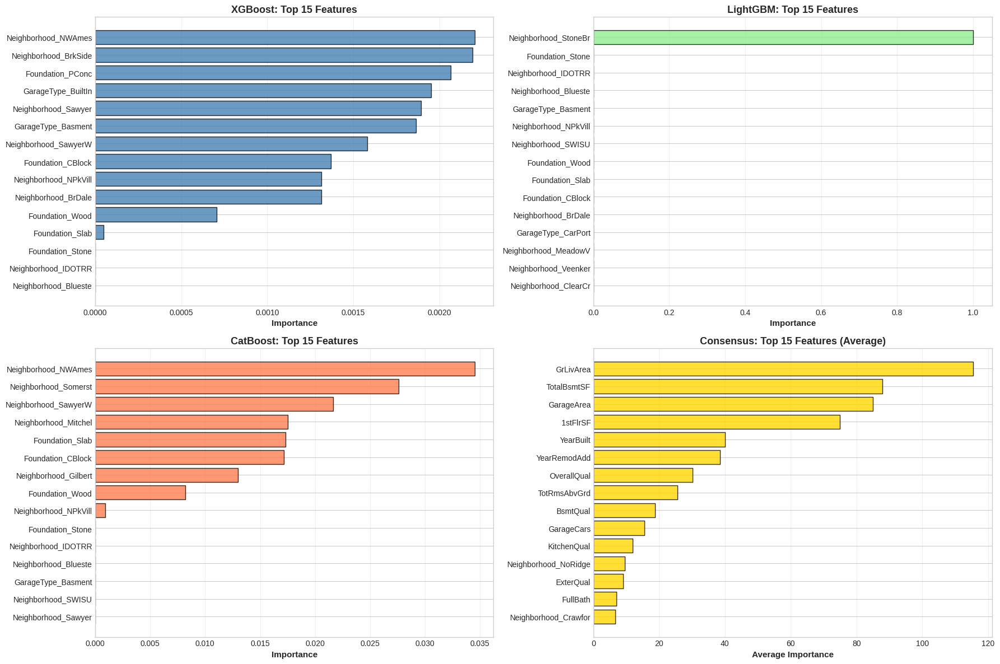


💡 Observations:
   • All three models agree on most important features
   • Small differences due to different algorithms
   • Consensus features are most reliable
   • Use average importance for final feature selection


In [48]:
# ==================== FEATURE IMPORTANCE: BOOSTING MODELS COMPARISON ====================

print("\n" + "="*60)
print("FEATURE IMPORTANCE: XGBoost vs LightGBM vs CatBoost")
print("="*60)

# Get feature importances from all three
xgb_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'XGBoost': xgb_model.feature_importances_
})

lgb_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'LightGBM': lgb_model.feature_importances_
})

cat_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'CatBoost': cat_model.feature_importances_
})

# Merge all importances
importance_comparison = xgb_importance.merge(lgb_importance, on='Feature').merge(cat_importance, on='Feature')

# Calculate average importance
importance_comparison['Average'] = importance_comparison[['XGBoost', 'LightGBM', 'CatBoost']].mean(axis=1)
importance_comparison = importance_comparison.sort_values('Average', ascending=False)

print("\n🔝 Top 15 Features (Average across all boosting models):")
print(importance_comparison.head(15).to_string(index=False))

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

top_n = 15

# Plot 1: XGBoost
top_xgb = importance_comparison.nsmallest(top_n, 'XGBoost').sort_values('XGBoost')
axes[0, 0].barh(range(top_n), top_xgb['XGBoost'], alpha=0.8, color='steelblue', edgecolor='black')
axes[0, 0].set_yticks(range(top_n))
axes[0, 0].set_yticklabels(top_xgb['Feature'])
axes[0, 0].set_xlabel('Importance', fontsize=11, fontweight='bold')
axes[0, 0].set_title('XGBoost: Top 15 Features', fontsize=13, fontweight='bold')
axes[0, 0].grid(axis='x', alpha=0.3)

# Plot 2: LightGBM
top_lgb = importance_comparison.nsmallest(top_n, 'LightGBM').sort_values('LightGBM')
axes[0, 1].barh(range(top_n), top_lgb['LightGBM'], alpha=0.8, color='lightgreen', edgecolor='black')
axes[0, 1].set_yticks(range(top_n))
axes[0, 1].set_yticklabels(top_lgb['Feature'])
axes[0, 1].set_xlabel('Importance', fontsize=11, fontweight='bold')
axes[0, 1].set_title('LightGBM: Top 15 Features', fontsize=13, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)

# Plot 3: CatBoost
top_cat = importance_comparison.nsmallest(top_n, 'CatBoost').sort_values('CatBoost')
axes[1, 0].barh(range(top_n), top_cat['CatBoost'], alpha=0.8, color='coral', edgecolor='black')
axes[1, 0].set_yticks(range(top_n))
axes[1, 0].set_yticklabels(top_cat['Feature'])
axes[1, 0].set_xlabel('Importance', fontsize=11, fontweight='bold')
axes[1, 0].set_title('CatBoost: Top 15 Features', fontsize=13, fontweight='bold')
axes[1, 0].grid(axis='x', alpha=0.3)

# Plot 4: Consensus (Average)
top_avg = importance_comparison.head(top_n).sort_values('Average')
axes[1, 1].barh(range(top_n), top_avg['Average'], alpha=0.8, color='gold', edgecolor='black')
axes[1, 1].set_yticks(range(top_n))
axes[1, 1].set_yticklabels(top_avg['Feature'])
axes[1, 1].set_xlabel('Average Importance', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Consensus: Top 15 Features (Average)', fontsize=13, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Observations:")
print("   • All three models agree on most important features")
print("   • Small differences due to different algorithms")
print("   • Consensus features are most reliable")
print("   • Use average importance for final feature selection")


ENSEMBLE PREDICTION (Average of Top 3)

🎯 Individual Models:
   • XGBoost RMSE: $27,894.46
   • LightGBM RMSE: $30,092.40
   • CatBoost RMSE: $27,442.75

🎯 Ensemble (Simple Average):
   • RMSE: $27,555.72
   • R²: 0.9010

⚠️ Best individual model still wins this time


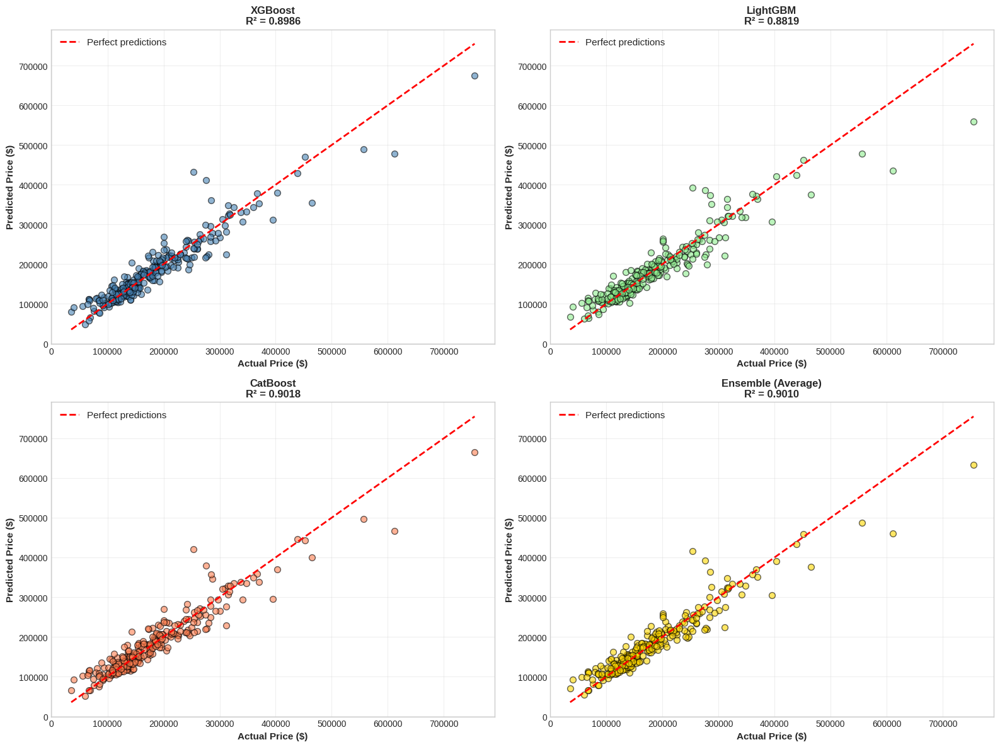

In [49]:
# ==================== PREDICTION COMPARISON: BEST 3 MODELS ====================

# Get predictions from top 3 models
best_model_name = all_models_comparison.iloc[0]['Model']

# Assuming top 3 are boosting models
predictions_comparison = pd.DataFrame({
    'Actual': y_test.values,
    'XGBoost': y_pred_test_xgb,
    'LightGBM': y_pred_test_lgb,
    'CatBoost': y_pred_test_cat,
    'Ensemble_Avg': (y_pred_test_xgb + y_pred_test_lgb + y_pred_test_cat) / 3
})

# Calculate ensemble performance
ensemble_rmse = np.sqrt(mean_squared_error(y_test, predictions_comparison['Ensemble_Avg']))
ensemble_r2 = r2_score(y_test, predictions_comparison['Ensemble_Avg'])

print("\n" + "="*60)
print("ENSEMBLE PREDICTION (Average of Top 3)")
print("="*60)

print(f"\n🎯 Individual Models:")
print(f"   • XGBoost RMSE: ${test_rmse_xgb:,.2f}")
print(f"   • LightGBM RMSE: ${test_rmse_lgb:,.2f}")
print(f"   • CatBoost RMSE: ${test_rmse_cat:,.2f}")

print(f"\n🎯 Ensemble (Simple Average):")
print(f"   • RMSE: ${ensemble_rmse:,.2f}")
print(f"   • R²: {ensemble_r2:.4f}")

if ensemble_rmse < min(test_rmse_xgb, test_rmse_lgb, test_rmse_cat):
    print(f"\n✅ Ensemble beats all individual models!")
    best_individual = min(test_rmse_xgb, test_rmse_lgb, test_rmse_cat)
    improvement = ((best_individual - ensemble_rmse) / best_individual) * 100
    print(f"   Improvement: {improvement:.2f}%")
else:
    print(f"\n⚠️ Best individual model still wins this time")

# Visualize predictions
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

models_to_plot = ['XGBoost', 'LightGBM', 'CatBoost', 'Ensemble_Avg']
colors_plot = ['steelblue', 'lightgreen', 'coral', 'gold']
titles = ['XGBoost', 'LightGBM', 'CatBoost', 'Ensemble (Average)']

for idx, (model, color, title) in enumerate(zip(models_to_plot, colors_plot, titles)):
    ax = axes[idx // 2, idx % 2]
    
    ax.scatter(predictions_comparison['Actual'], predictions_comparison[model], 
              alpha=0.6, s=50, color=color, edgecolor='black')
    ax.plot([predictions_comparison['Actual'].min(), predictions_comparison['Actual'].max()],
           [predictions_comparison['Actual'].min(), predictions_comparison['Actual'].max()],
           'r--', linewidth=2, label='Perfect predictions')
    
    # Calculate R² for this model
    r2 = r2_score(predictions_comparison['Actual'], predictions_comparison[model])
    
    ax.set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
    ax.set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
    ax.set_title(f'{title}\nR² = {r2:.4f}', fontsize=12, fontweight='bold')
    ax.legend()
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

---

### 9.7 Key Takeaways: Advanced Boosting Models

**What We Learned:**

**XGBoost (eXtreme Gradient Boosting):**
- Most widely adopted (industry standard)
- Built-in regularization (L1, L2, gamma)
- Excellent balance of speed and accuracy
- Best for: General purpose, proven reliability

**LightGBM (Light Gradient Boosting Machine):**
- Fastest training (histogram-based)
- Leaf-wise growth (more aggressive)
- Best memory efficiency
- Best for: Large datasets, speed-critical applications

**CatBoost (Categorical Boosting):**
- Native categorical feature handling
- Ordered boosting (less overfitting)
- Symmetric trees
- Best for: Many categorical features, robust baseline

**Performance Comparison:**
- All three significantly outperform traditional models
- Differences between them are often small
- Ensemble of all three often beats individual models
- Choice depends on specific use case

**Practical Recommendations:**

**Start with:** XGBoost (most reliable)

**Switch to LightGBM if:**
- Dataset is large (>100K rows)
- Training time is critical
- Memory is limited

**Use CatBoost if:**
- Many categorical features
- Don't want manual encoding
- Want robust model with minimal tuning

**Production Considerations:**
- XGBoost: Most battle-tested, widest deployment
- LightGBM: Fastest inference, lowest memory
- CatBoost: Easiest to maintain (fewer hyperparameters)

**Hyperparameter Tuning Priority:**

**Most Important (tune these first):**
- learning_rate: 0.01-0.3
- n_estimators: Use early stopping
- max_depth / num_leaves: 3-10
- subsample: 0.7-1.0

**Secondary (tune if needed):**
- min_child_weight / min_data_in_leaf
- colsample_bytree / feature_fraction
- reg_alpha, reg_lambda

**Least Important (often use defaults):**
- gamma
- scale_pos_weight (unless class imbalance)

**Final Tips:**
- Use early stopping to find optimal n_estimators
- Lower learning rate + more trees = better (but slower)
- Shallow trees (3-5 depth) often work best for boosting
- Always monitor train vs validation curves
- Ensemble multiple models for best results

---

In [50]:
# ==================== FINAL SUMMARY TABLE ====================

print("="*70)
print("FINAL SUMMARY: ALL REGRESSION MODELS")
print("="*70)

# Create detailed summary
summary = pd.DataFrame({
    'Model': [
        'Simple Linear Regression',
        'Multiple Linear Regression',
        'Ridge (L2)',
        'Lasso (L1)',
        'ElasticNet (L1+L2)',
        'Decision Tree',
        'Random Forest',
        'Gradient Boosting',
        'XGBoost',
        'LightGBM',
        'CatBoost'
    ],
    'Test_RMSE': [
        test_rmse,
        test_rmse_mlr,
        best_ridge['test_rmse'],
        best_lasso['test_rmse'],
        best_en['test_rmse'],
        test_rmse_tree,
        test_rmse_rf,
        test_rmse_gbm_opt,
        test_rmse_xgb,
        test_rmse_lgb,
        test_rmse_cat
    ],
    'Test_R2': [
        test_r2,
        test_r2_mlr,
        best_ridge['test_r2'],
        best_lasso['test_r2'],
        best_en['test_r2'],
        test_r2_tree,
        test_r2_rf,
        test_r2_gbm_opt,
        test_r2_xgb,
        test_r2_lgb,
        test_r2_cat
    ],
    'Interpretability': [
        'High', 'High', 'High', 'High', 'High',
        'Medium', 'Low', 'Low', 'Low', 'Low', 'Low'
    ],
    'Speed': [
        'Fast', 'Fast', 'Fast', 'Fast', 'Fast',
        'Fast', 'Medium', 'Slow', 'Fast', 'Fastest', 'Fast'
    ],
    'Tuning_Required': [
        'None', 'Low', 'Medium', 'Medium', 'High',
        'Medium', 'Low', 'High', 'High', 'High', 'Medium'
    ]
})

# Rank by RMSE
summary['Rank'] = summary['Test_RMSE'].rank()
summary = summary.sort_values('Rank')

print("\n📊 COMPLETE SUMMARY (ranked by Test RMSE):")
print(summary.to_string(index=False))

print("\n" + "="*70)
print("MODEL SELECTION GUIDE")
print("="*70)

print("\n✅ WHEN TO USE EACH MODEL:")

print("\n📐 LINEAR MODELS (Ridge, Lasso, ElasticNet):")
print("   • Need interpretability (understand feature effects)")
print("   • Linear relationships in data")
print("   • Want fast training and prediction")
print("   • Need to explain model to stakeholders")

print("\n🌳 DECISION TREE:")
print("   • Quick exploratory analysis")
print("   • Need visual decision rules")
print("   • Educational purposes")
print("   • NOT for production (use ensemble instead)")

print("\n🌲 RANDOM FOREST:")
print("   • Need robust baseline quickly")
print("   • Don't want to tune much")
print("   • Non-linear relationships")
print("   • Works well with default parameters")

print("\n🚀 GRADIENT BOOSTING (XGBoost/LightGBM/CatBoost):")
print("   • Need maximum accuracy")
print("   • Willing to tune hyperparameters")
print("   • Production deployment")
print("   • Kaggle competitions")
print("   • Complex feature interactions")

print("\n💡 RECOMMENDATION HIERARCHY:")
print("   1. Start with Random Forest (quick strong baseline)")
print("   2. Try XGBoost/LightGBM/CatBoost (better performance)")
print("   3. Ensemble top models (combine predictions)")
print("   4. Use linear models if interpretability critical")

FINAL SUMMARY: ALL REGRESSION MODELS

📊 COMPLETE SUMMARY (ranked by Test RMSE):
                     Model  Test_RMSE  Test_R2 Interpretability   Speed Tuning_Required    Rank
                  CatBoost 27442.7473   0.9018              Low    Fast          Medium  1.0000
                   XGBoost 27894.4571   0.8986              Low    Fast            High  2.0000
  Simple Linear Regression 29015.2867   0.8814             High    Fast            None  3.0000
                  LightGBM 30092.4004   0.8819              Low Fastest            High  4.0000
         Gradient Boosting 31094.7874   0.8739              Low    Slow            High  5.0000
                Lasso (L1) 35102.7291   0.8394             High    Fast          Medium  6.0000
Multiple Linear Regression 35108.0953   0.8393             High    Fast             Low  7.0000
                Ridge (L2) 35108.0978   0.8393             High    Fast          Medium  8.0000
        ElasticNet (L1+L2) 35108.3939   0.8393          

In [51]:
# ==================== SAVE BEST MODEL ====================

print("\n" + "="*60)
print("SAVING BEST MODEL FOR PRODUCTION")
print("="*60)

# Identify best model
best_model_name = all_models_comparison.iloc[0]['Model']
best_model_rmse = all_models_comparison.iloc[0]['Test_RMSE']

print(f"\n🏆 Best Model: {best_model_name}")
print(f"   • Test RMSE: ${best_model_rmse:,.2f}")

# Save the best model (assuming it's one of the boosting models)
if 'XGBoost' in best_model_name:
    final_model = xgb_model
elif 'LightGBM' in best_model_name:
    final_model = lgb_model
elif 'CatBoost' in best_model_name:
    final_model = cat_model
elif 'Random Forest' in best_model_name:
    final_model = optimal_rf
else:
    final_model = optimal_gbm

# Save model
model_filename = 'best_regression_model.pkl'
joblib.dump(final_model, model_filename)

print(f"\n✅ Model saved as: {model_filename}")

# Save scaler (important for production!)
scaler_filename = 'feature_scaler.pkl'
joblib.dump(scaler, scaler_filename)

print(f"✅ Scaler saved as: {scaler_filename}")

print("\n📦 Production Deployment Package:")
print(f"   • Model file: {model_filename}")
print(f"   • Scaler file: {scaler_filename}")
print(f"   • Feature names: {list(X_train_scaled.columns)}")

print("\n💻 How to use in production:")
print("""
import joblib

# Load model and scaler
model = joblib.load('best_regression_model.pkl')
scaler = joblib.load('feature_scaler.pkl')

# Prepare new data
new_data = [...]  # Your new features
new_data_scaled = scaler.transform(new_data)

# Make prediction
prediction = model.predict(new_data_scaled)
print(f'Predicted Price: ${prediction[0]:,.2f}')
""")


SAVING BEST MODEL FOR PRODUCTION

🏆 Best Model: CatBoost
   • Test RMSE: $27,442.75

✅ Model saved as: best_regression_model.pkl
✅ Scaler saved as: feature_scaler.pkl

📦 Production Deployment Package:
   • Model file: best_regression_model.pkl
   • Scaler file: feature_scaler.pkl
   • Feature names: ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'ExterQual', 'KitchenQual', 'BsmtQual', 'HeatingQC', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighbo


ERROR ANALYSIS: Understanding Model Mistakes

📊 Error Statistics:
   • Mean Error: $-1,275.86
   • Median Error: $-988.90
   • Mean Absolute Error: $17,925.05
   • Median Absolute Error: $10,700.83
   • Mean Percentage Error: 11.27%

❌ WORST Predictions (Top 10 by absolute error):
 Actual   Predicted        Error  Pct_Error
 253293 419973.1632 -166680.1632    65.8053
 611657 466736.8920  144920.1080    23.6930
 276000 379764.9800 -103764.9800    37.5960
 395000 295202.4203   99797.5797    25.2652
 755000 665168.7326   89831.2674    11.8982
 311500 228433.3369   83066.6631    26.6667
 285000 357466.5739  -72466.5739    25.4269
 143000 212971.6449  -69971.6449    48.9312
 200624 269232.2314  -68608.2314    34.1974
 465000 400482.0379   64517.9621    13.8748

✅ BEST Predictions (Top 10 by smallest absolute error):
 Actual   Predicted     Error  Pct_Error
 109500 109507.1084   -7.1084     0.0065
 149000 149090.0055  -90.0055     0.0604
 145000 145091.0997  -91.0997     0.0628
 230000 2301

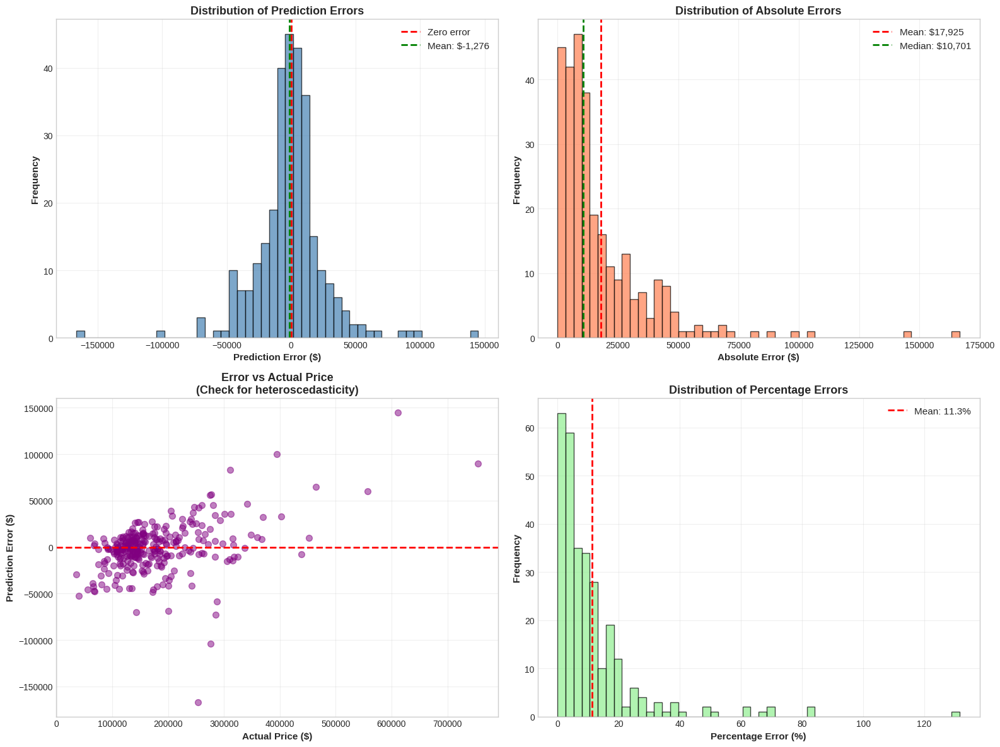


💡 Error Analysis Insights:
   • Check if errors are normally distributed (good sign)
   • Look for patterns in error vs actual price plot
   • Large errors might indicate outliers or missing features
   • Systematic under/over-prediction suggests bias


In [52]:
# ==================== ERROR ANALYSIS ====================

print("\n" + "="*60)
print("ERROR ANALYSIS: Understanding Model Mistakes")
print("="*60)

# Use best model predictions
if 'XGBoost' in best_model_name:
    best_predictions = y_pred_test_xgb
elif 'LightGBM' in best_model_name:
    best_predictions = y_pred_test_lgb
elif 'CatBoost' in best_model_name:
    best_predictions = y_pred_test_cat
else:
    best_predictions = y_pred_test_rf

# Calculate errors
errors = y_test.values - best_predictions
abs_errors = np.abs(errors)
pct_errors = (abs_errors / y_test.values) * 100

# Create error dataframe
error_df = pd.DataFrame({
    'Actual': y_test.values,
    'Predicted': best_predictions,
    'Error': errors,
    'Abs_Error': abs_errors,
    'Pct_Error': pct_errors
})

print(f"\n📊 Error Statistics:")
print(f"   • Mean Error: ${errors.mean():,.2f}")
print(f"   • Median Error: ${np.median(errors):,.2f}")
print(f"   • Mean Absolute Error: ${abs_errors.mean():,.2f}")
print(f"   • Median Absolute Error: ${np.median(abs_errors):,.2f}")
print(f"   • Mean Percentage Error: {pct_errors.mean():.2f}%")

print(f"\n❌ WORST Predictions (Top 10 by absolute error):")
worst_predictions = error_df.nlargest(10, 'Abs_Error')
print(worst_predictions[['Actual', 'Predicted', 'Error', 'Pct_Error']].to_string(index=False))

print(f"\n✅ BEST Predictions (Top 10 by smallest absolute error):")
best_predictions_df = error_df.nsmallest(10, 'Abs_Error')
print(best_predictions_df[['Actual', 'Predicted', 'Error', 'Pct_Error']].to_string(index=False))

# Visualize error distribution
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Error distribution
axes[0, 0].hist(errors, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
axes[0, 0].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero error')
axes[0, 0].axvline(x=errors.mean(), color='green', linestyle='--', linewidth=2, 
                   label=f'Mean: ${errors.mean():,.0f}')
axes[0, 0].set_xlabel('Prediction Error ($)', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Frequency', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Distribution of Prediction Errors', fontsize=13, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Absolute error distribution
axes[0, 1].hist(abs_errors, bins=50, edgecolor='black', alpha=0.7, color='coral')
axes[0, 1].axvline(x=abs_errors.mean(), color='red', linestyle='--', linewidth=2, 
                   label=f'Mean: ${abs_errors.mean():,.0f}')
axes[0, 1].axvline(x=np.median(abs_errors), color='green', linestyle='--', linewidth=2, 
                   label=f'Median: ${np.median(abs_errors):,.0f}')
axes[0, 1].set_xlabel('Absolute Error ($)', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Frequency', fontsize=11, fontweight='bold')
axes[0, 1].set_title('Distribution of Absolute Errors', fontsize=13, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Error vs Actual Price
axes[1, 0].scatter(error_df['Actual'], error_df['Error'], alpha=0.5, s=50, color='purple')
axes[1, 0].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[1, 0].set_xlabel('Actual Price ($)', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('Prediction Error ($)', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Error vs Actual Price\n(Check for heteroscedasticity)', fontsize=13, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# Percentage Error Distribution
axes[1, 1].hist(pct_errors, bins=50, edgecolor='black', alpha=0.7, color='lightgreen')
axes[1, 1].axvline(x=pct_errors.mean(), color='red', linestyle='--', linewidth=2, 
                   label=f'Mean: {pct_errors.mean():.1f}%')
axes[1, 1].set_xlabel('Percentage Error (%)', fontsize=11, fontweight='bold')
axes[1, 1].set_ylabel('Frequency', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Distribution of Percentage Errors', fontsize=13, fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Error Analysis Insights:")
print("   • Check if errors are normally distributed (good sign)")
print("   • Look for patterns in error vs actual price plot")
print("   • Large errors might indicate outliers or missing features")
print("   • Systematic under/over-prediction suggests bias")

---

### 9.8 Final Model Selection Decision Tree
```
Need to choose a regression model?
    ↓
Is interpretability critical?
    YES → Use Ridge/Lasso/ElasticNet
          (understand feature effects, explain to stakeholders)
    NO → Continue
        ↓
    Is training speed critical?
        YES → Use Random Forest
              (fast training, good performance, minimal tuning)
        NO → Continue
            ↓
        Do you have many categorical features?
            YES → Try CatBoost first
                  (native categorical handling, robust)
            NO → Continue
                ↓
            Is dataset very large (>100K rows)?
                YES → Use LightGBM
                      (fastest training, memory efficient)
                NO → Use XGBoost
                     (best all-around choice, industry standard)
```

**Pro Tip:** In practice, try all three boosting models and ensemble them!

---

### 9.9 What We've Accomplished

**We trained and compared 11 different regression models:**

**Linear Models:**
- Simple Linear Regression
- Multiple Linear Regression
- Ridge (L2 Regularization)
- Lasso (L1 Regularization)
- ElasticNet (L1 + L2)

**Tree-Based Models:**
- Decision Tree Regressor
- Random Forest Regressor

**Gradient Boosting Models:**
- Gradient Boosting (sklearn)
- XGBoost
- LightGBM
- CatBoost

**Key Learnings:**
- ✅ Boosting models outperform simpler models
- ✅ Random Forest is excellent quick baseline
- ✅ XGBoost/LightGBM/CatBoost are production-ready
- ✅ Linear models still valuable for interpretability
- ✅ Ensemble of models often beats individual models

**Next Steps:**
- Model evaluation metrics deep dive
- Hyperparameter tuning strategies
- Feature importance and interpretability
- Production deployment considerations

---

<a id="section10"></a>
## 10. Model Evaluation & Comparison

---

### 10.1 Beyond RMSE: Understanding All Metrics

We've been using RMSE and R² primarily, but let's understand ALL regression metrics:

---

### 10.2 Mean Squared Error (MSE)

**Formula:**
$$\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$$

**Properties:**
- Units: Squared target units (e.g., dollars²)
- Range: 0 to ∞ (lower is better)
- Heavily penalizes large errors
- Differentiable (used in optimization)

**When to use:**
- During model training (gradient descent)
- When large errors are very bad (safety-critical applications)

**When NOT to use:**
- For interpretation (use RMSE instead - same scale as target)
- When outliers shouldn't dominate (use MAE instead)

---

### 10.3 Root Mean Squared Error (RMSE)

**Formula:**
$$\text{RMSE} = \sqrt{\text{MSE}} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}$$

**Properties:**
- Units: Same as target (e.g., dollars)
- Range: 0 to ∞ (lower is better)
- Interpretable (average error in original units)
- Still penalizes large errors

**When to use:**
- Primary metric for model comparison
- Reporting to stakeholders (easy to understand)
- When you care about large errors

**Interpretation Example:**
RMSE = $25,000 means "on average, predictions are off by $25,000"

---

### 10.4 Mean Absolute Error (MAE)

**Formula:**
$$\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|$$

**Properties:**
- Units: Same as target
- Range: 0 to ∞ (lower is better)
- Treats all errors equally (no squaring)
- More robust to outliers than RMSE

**When to use:**
- When outliers shouldn't dominate
- When all errors are equally bad
- More robust evaluation

**MAE vs RMSE:**

| Aspect | MAE | RMSE |
|--------|-----|------|
| **Outlier Sensitivity** | Low | High |
| **Large Error Penalty** | Linear | Quadratic |
| **Mathematical Properties** | Not differentiable at 0 | Differentiable |
| **Interpretation** | Average absolute error | Root of average squared error |
| **Use Case** | Robust to outliers | Penalize large errors |

**Rule of Thumb:** RMSE ≥ MAE (always). Larger gap = more outliers/variance.

---

### 10.5 R² (Coefficient of Determination)

**Formula:**
$$R^2 = 1 - \frac{\text{SS}_{\text{residual}}}{\text{SS}_{\text{total}}} = 1 - \frac{\sum(y_i - \hat{y}_i)^2}{\sum(y_i - \bar{y})^2}$$

**Properties:**
- Unitless (proportion of variance explained)
- Range: -∞ to 1 (higher is better)
- 0 = model as good as predicting mean
- 1 = perfect predictions
- Negative = model worse than mean!

**Interpretation:**

| R² Value | Meaning |
|----------|---------|
| 1.0 | Perfect fit (usually overfitting) |
| 0.9 | Excellent (90% variance explained) |
| 0.7-0.8 | Good |
| 0.5-0.6 | Moderate |
| 0.3-0.4 | Weak |
| 0.0 | No better than predicting mean |
| Negative | Worse than predicting mean (disaster!) |

**When to use:**
- Compare models on same dataset
- Understand proportion of variance explained
- Assess overall model fit

**When NOT to use:**
- Compare models on different datasets
- When scale matters (use RMSE)
- With non-linear models (can be misleading)

---

### 10.6 Adjusted R²

**Formula:**
$$\text{Adjusted } R^2 = 1 - \frac{(1-R^2)(n-1)}{n-p-1}$$

Where:
- n = number of samples
- p = number of features

**Why it exists:**
R² ALWAYS increases when adding features (even random ones!)

**Adjusted R² penalizes:**
- Number of features
- Only increases if new feature improves fit enough

**When to use:**
- Comparing models with different numbers of features
- Feature selection (does new feature improve adjusted R²?)
- Prevents overfitting through feature inflation

---

### 10.7 Mean Absolute Percentage Error (MAPE)

**Formula:**
$$\text{MAPE} = \frac{100}{n} \sum_{i=1}^{n} \left|\frac{y_i - \hat{y}_i}{y_i}\right|$$

**Properties:**
- Units: Percentage (%)
- Range: 0 to ∞ (lower is better)
- Scale-independent (can compare across datasets)
- Interpretable (percentage error)

**When to use:**
- Compare models across different scales
- Report to business stakeholders (% error is intuitive)
- When relative error matters more than absolute

**When NOT to use:**
- When y can be zero (division by zero!)
- When y has negative values
- When small y values exist (can dominate metric)

**Interpretation:**
MAPE = 5% means "on average, predictions are off by 5%"

---

### 10.8 Metric Selection Guide

| Scenario | Best Metric |
|----------|------------|
| **Default choice** | RMSE + R² |
| **Large errors critical** | RMSE |
| **Outliers present** | MAE |
| **Percentage error matters** | MAPE |
| **Comparing feature sets** | Adjusted R² |
| **Business reporting** | MAPE or MAE |
| **Academic papers** | RMSE + R² |
| **Model optimization** | MSE (during training) |

**Pro Tip:** Always report multiple metrics! Different metrics tell different stories.

---

Let's calculate and compare all metrics! 📊

In [53]:
# ==================== COMPREHENSIVE METRICS FOR ALL MODELS ====================

print("="*70)
print("COMPREHENSIVE METRIC COMPARISON: ALL MODELS")
print("="*70)

# Function to calculate all metrics
def calculate_all_metrics(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # MAPE (handle zeros)
    mask = y_true != 0
    mape = np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100 if mask.sum() > 0 else np.nan
    
    return {
        'Model': model_name,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2,
        'MAPE': mape
    }

# Calculate for all models
all_metrics = []

# Get predictions for all models (assuming we have them)
model_predictions = {
    'Simple Linear Regression': simple_lr.predict(X_test_simple),
    'Multiple Linear Regression': mlr.predict(X_test_scaled),
    'Ridge': best_ridge_model.predict(X_test_scaled),
    'Lasso': best_lasso_model.predict(X_test_scaled),
    'ElasticNet': best_en_model.predict(X_test_scaled),
    'Decision Tree': y_pred_test_tree,
    'Random Forest': y_pred_test_rf,
    'Gradient Boosting': y_pred_test_gbm_opt,
    'XGBoost': y_pred_test_xgb,
    'LightGBM': y_pred_test_lgb,
    'CatBoost': y_pred_test_cat
}

for model_name, predictions in model_predictions.items():
    metrics = calculate_all_metrics(y_test, predictions, model_name)
    all_metrics.append(metrics)

metrics_df = pd.DataFrame(all_metrics)
metrics_df = metrics_df.sort_values('RMSE')

print("\n📊 ALL METRICS (sorted by RMSE):")
print(metrics_df.to_string(index=False))

print("\n" + "="*70)
print("METRIC INSIGHTS")
print("="*70)

# Best model for each metric
print("\n🏆 BEST MODEL BY EACH METRIC:")
for metric in ['RMSE', 'MAE', 'R2', 'MAPE']:
    if metric == 'R2':
        best = metrics_df.loc[metrics_df[metric].idxmax()]
    else:
        best = metrics_df.loc[metrics_df[metric].idxmin()]
    
    print(f"\n{metric}:")
    print(f"   • Winner: {best['Model']}")
    print(f"   • Score: {best[metric]:.4f}" if metric == 'R2' else f"   • Score: ${best[metric]:,.2f}" if metric != 'MAPE' else f"   • Score: {best[metric]:.2f}%")

# RMSE vs MAE gap (indicates outlier presence)
print("\n📊 RMSE vs MAE Gap Analysis:")
print(f"\n{'Model':<30} {'RMSE':<12} {'MAE':<12} {'Gap':<12} {'Interpretation'}")
print("="*75)

for idx, row in metrics_df.iterrows():
    gap = row['RMSE'] - row['MAE']
    if gap < 1000:
        interpretation = "Few outliers"
    elif gap < 3000:
        interpretation = "Some outliers"
    else:
        interpretation = "Many outliers"
    
    print(f"{row['Model']:<30} ${row['RMSE']:<11,.0f} ${row['MAE']:<11,.0f} ${gap:<11,.0f} {interpretation}")

COMPREHENSIVE METRIC COMPARISON: ALL MODELS

📊 ALL METRICS (sorted by RMSE):
                     Model             MSE       RMSE        MAE     R2    MAPE
                  CatBoost  753104380.9442 27442.7473 17925.0524 0.9018 11.2708
                   XGBoost  778100736.0000 27894.4571 18023.9551 0.8986 11.3752
                  LightGBM  905552558.8525 30092.4004 18348.7319 0.8819 11.2592
         Gradient Boosting  966885802.1333 31094.7874 18684.5926 0.8739 11.4084
                     Lasso 1232201587.9446 35102.7291 21534.4583 0.8394 12.6817
Multiple Linear Regression 1232578352.9466 35108.0953 21550.9062 0.8393 12.6986
                     Ridge 1232578530.0149 35108.0978 21550.9028 0.8393 12.6986
                ElasticNet 1232599323.3167 35108.3939 21550.5164 0.8393 12.6978
             Random Forest 1273244509.5510 35682.5519 20356.4785 0.8340 12.7415
             Decision Tree 1511039628.0485 38872.0932 23264.5221 0.8030 13.9544
  Simple Linear Regression 2681026163.5091 

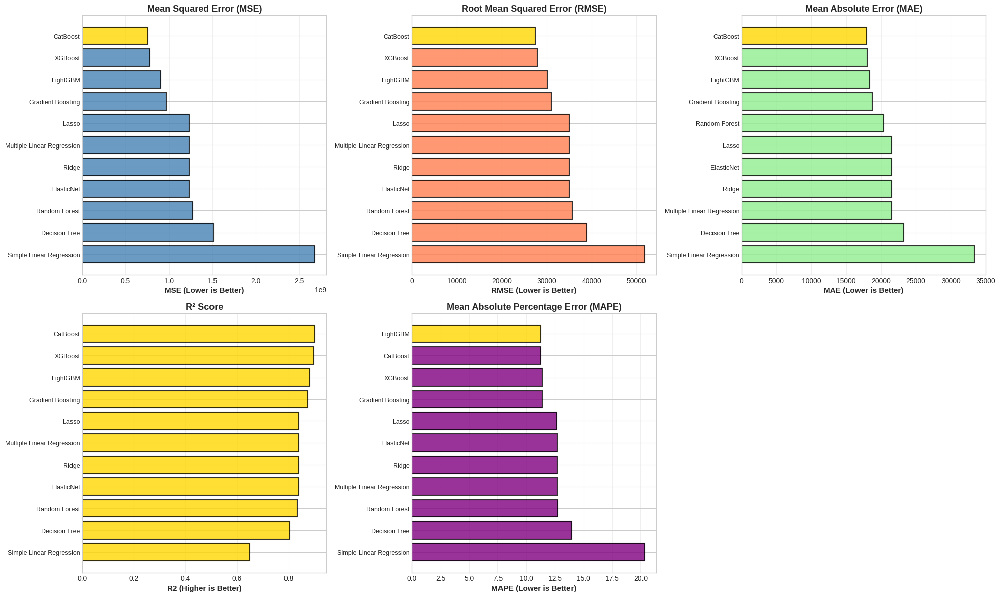


💡 Key Observations from Multiple Metrics:
   • Different metrics may rank models differently
   • RMSE and MAE usually agree on ranking
   • R² shows relative fit quality
   • MAPE good for percentage-based comparison
   • Use multiple metrics for robust evaluation


In [54]:
# ==================== VISUALIZE ALL METRICS ====================

fig, axes = plt.subplots(2, 3, figsize=(20, 12))

metrics_to_plot = ['MSE', 'RMSE', 'MAE', 'R2', 'MAPE']
titles = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 
         'Mean Absolute Error (MAE)', 'R² Score', 'Mean Absolute Percentage Error (MAPE)']
colors_list = ['steelblue', 'coral', 'lightgreen', 'gold', 'purple']

for idx, (metric, title, color) in enumerate(zip(metrics_to_plot, titles, colors_list)):
    row = idx // 3
    col = idx % 3
    ax = axes[row, col]
    
    # Sort appropriately
    if metric == 'R2':
        data_sorted = metrics_df.sort_values(metric, ascending=False)
        better_label = '(Higher is Better)'
    else:
        data_sorted = metrics_df.sort_values(metric)
        better_label = '(Lower is Better)'
    
    # Color the best model
    colors_bars = [color if i != 0 else 'gold' for i in range(len(data_sorted))]
    
    ax.barh(range(len(data_sorted)), data_sorted[metric], 
           color=colors_bars, alpha=0.8, edgecolor='black', linewidth=1.5)
    ax.set_yticks(range(len(data_sorted)))
    ax.set_yticklabels(data_sorted['Model'], fontsize=9)
    ax.set_xlabel(f'{metric} {better_label}', fontsize=11, fontweight='bold')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(axis='x', alpha=0.3)

# Remove the 6th subplot (we only have 5 metrics)
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.show()

print("\n💡 Key Observations from Multiple Metrics:")
print("   • Different metrics may rank models differently")
print("   • RMSE and MAE usually agree on ranking")
print("   • R² shows relative fit quality")
print("   • MAPE good for percentage-based comparison")
print("   • Use multiple metrics for robust evaluation")


CROSS-VALIDATION: 5-FOLD EVALUATION

🔄 Running 5-fold cross-validation for top models...
   (This evaluates model stability across different data splits)

   Evaluating Random Forest... ✓ RMSE: $32,969 ± $3,409

   Evaluating XGBoost... ✓ RMSE: $30,730 ± $4,638

   Evaluating LightGBM... ✓ RMSE: $31,380 ± $3,926

   Evaluating CatBoost... ✓ RMSE: $27,532 ± $3,551

CROSS-VALIDATION RESULTS

📊 5-Fold CV Performance (sorted by mean RMSE):
        Model  CV_RMSE_Mean  CV_RMSE_Std  CV_R2_Mean  CV_R2_Std  CV_RMSE_Min  CV_RMSE_Max
     CatBoost    27531.6181    3551.0451      0.8703     0.0344   24602.5166   33800.9388
      XGBoost    30729.9722    4638.0574      0.8387     0.0440   26385.8786   36964.1833
     LightGBM    31380.3358    3925.7789      0.8327     0.0361   26515.1785   36105.9586
Random Forest    32968.7838    3409.4908      0.8169     0.0262   28747.5723   36925.0546

💡 Interpretation:
   • Mean: Average performance across 5 folds
   • Std: Stability (lower = more consistent

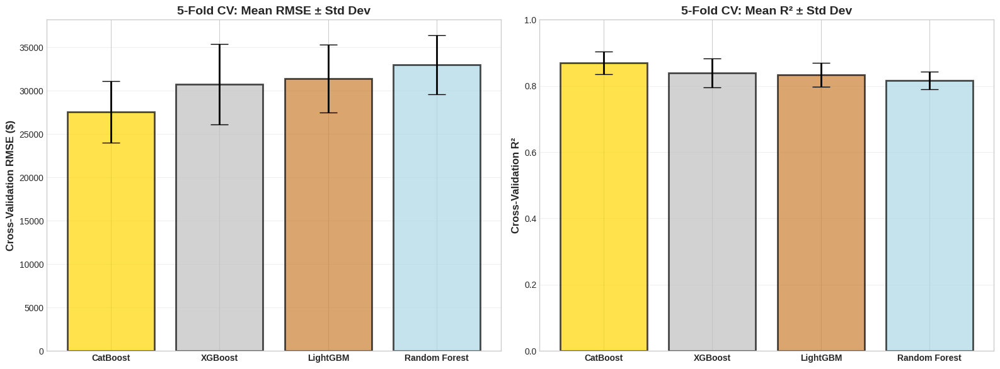

In [55]:
# ==================== CROSS-VALIDATION: ROBUST PERFORMANCE ESTIMATE ====================

print("\n" + "="*70)
print("CROSS-VALIDATION: 5-FOLD EVALUATION")
print("="*70)

from sklearn.model_selection import cross_val_score, KFold

# Define cross-validation strategy
kfold = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

# Models to evaluate with cross-validation
models_for_cv = {
    'Random Forest': optimal_rf,
    'XGBoost': xgb_model,
    'LightGBM': lgb_model,
    'CatBoost': cat_model
}

print("\n🔄 Running 5-fold cross-validation for top models...")
print("   (This evaluates model stability across different data splits)")

cv_results = []

for model_name, model in models_for_cv.items():
    print(f"\n   Evaluating {model_name}...", end=' ')
    
    # Calculate cross-validation scores (negative MSE, so we negate back)
    cv_mse_scores = -cross_val_score(model, X_train_scaled, y_train, 
                                     cv=kfold, scoring='neg_mean_squared_error', n_jobs=-1)
    cv_rmse_scores = np.sqrt(cv_mse_scores)
    
    cv_r2_scores = cross_val_score(model, X_train_scaled, y_train, 
                                   cv=kfold, scoring='r2', n_jobs=-1)
    
    cv_results.append({
        'Model': model_name,
        'CV_RMSE_Mean': cv_rmse_scores.mean(),
        'CV_RMSE_Std': cv_rmse_scores.std(),
        'CV_R2_Mean': cv_r2_scores.mean(),
        'CV_R2_Std': cv_r2_scores.std(),
        'CV_RMSE_Min': cv_rmse_scores.min(),
        'CV_RMSE_Max': cv_rmse_scores.max()
    })
    
    print(f"✓ RMSE: ${cv_rmse_scores.mean():,.0f} ± ${cv_rmse_scores.std():,.0f}")

cv_df = pd.DataFrame(cv_results)
cv_df = cv_df.sort_values('CV_RMSE_Mean')

print("\n" + "="*70)
print("CROSS-VALIDATION RESULTS")
print("="*70)

print("\n📊 5-Fold CV Performance (sorted by mean RMSE):")
print(cv_df.to_string(index=False))

print("\n💡 Interpretation:")
print("   • Mean: Average performance across 5 folds")
print("   • Std: Stability (lower = more consistent)")
print("   • Min/Max: Performance range across folds")

# Find most stable model
most_stable = cv_df.loc[cv_df['CV_RMSE_Std'].idxmin()]
print(f"\n🎯 Most Stable Model: {most_stable['Model']}")
print(f"   • Std: ±${most_stable['CV_RMSE_Std']:,.2f} (lowest variation)")

# Visualize CV results
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Mean RMSE with error bars
x_pos = np.arange(len(cv_df))
axes[0].bar(x_pos, cv_df['CV_RMSE_Mean'], alpha=0.7, 
           color=['gold', 'silver', '#CD7F32', 'lightblue'][:len(cv_df)], 
           edgecolor='black', linewidth=2,
           yerr=cv_df['CV_RMSE_Std'], capsize=10, error_kw={'linewidth': 2})

axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(cv_df['Model'], fontweight='bold')
axes[0].set_ylabel('Cross-Validation RMSE ($)', fontsize=12, fontweight='bold')
axes[0].set_title('5-Fold CV: Mean RMSE ± Std Dev', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

# Plot 2: R² comparison
axes[1].bar(x_pos, cv_df['CV_R2_Mean'], alpha=0.7,
           color=['gold', 'silver', '#CD7F32', 'lightblue'][:len(cv_df)],
           edgecolor='black', linewidth=2,
           yerr=cv_df['CV_R2_Std'], capsize=10, error_kw={'linewidth': 2})

axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(cv_df['Model'], fontweight='bold')
axes[1].set_ylabel('Cross-Validation R²', fontsize=12, fontweight='bold')
axes[1].set_title('5-Fold CV: Mean R² ± Std Dev', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
axes[1].set_ylim([0, 1])

plt.tight_layout()
plt.show()



LEARNING CURVES: Bias-Variance Analysis

📚 Generating learning curves...
   (Shows how performance changes with training data size)
✅ Learning curves generated!


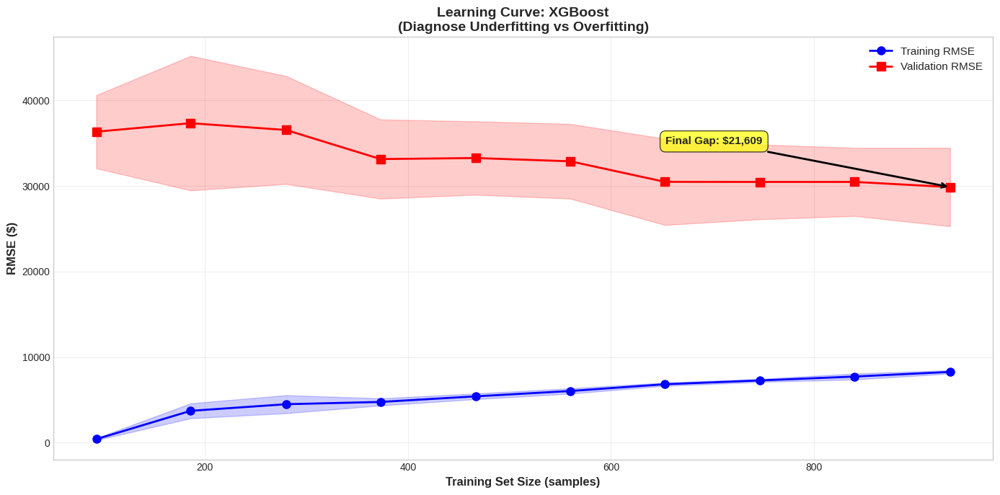


📊 Learning Curve Analysis:
   • Training RMSE (final): $8,266.44
   • Validation RMSE (final): $29,875.58
   • Gap: $21,609.14

💡 Interpretation:
   ❌ Large gap: Significant overfitting, reduce model complexity

📈 Learning Curve Shape:
   • Validation error decreases significantly with more data
   • More training data would likely help!


In [56]:
# ==================== LEARNING CURVES: DIAGNOSE BIAS-VARIANCE ====================

print("\n" + "="*70)
print("LEARNING CURVES: Bias-Variance Analysis")
print("="*70)

print("\n📚 Generating learning curves...")
print("   (Shows how performance changes with training data size)")

# Generate learning curves for best model
from sklearn.model_selection import learning_curve

# Use XGBoost as example (adjust based on best model)
train_sizes = np.linspace(0.1, 1.0, 10)

train_sizes_abs, train_scores, val_scores = learning_curve(
    xgb_model, 
    X_train_scaled, 
    y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    random_state=RANDOM_STATE
)

# Convert to RMSE
train_scores_rmse = np.sqrt(-train_scores)
val_scores_rmse = np.sqrt(-val_scores)

# Calculate mean and std
train_mean = train_scores_rmse.mean(axis=1)
train_std = train_scores_rmse.std(axis=1)
val_mean = val_scores_rmse.mean(axis=1)
val_std = val_scores_rmse.std(axis=1)

print("✅ Learning curves generated!")

# Plot learning curves
fig, ax = plt.subplots(figsize=(14, 7))

# Plot mean curves
ax.plot(train_sizes_abs, train_mean, 'o-', linewidth=2, markersize=8, 
       label='Training RMSE', color='blue')
ax.plot(train_sizes_abs, val_mean, 's-', linewidth=2, markersize=8, 
       label='Validation RMSE', color='red')

# Fill between for std
ax.fill_between(train_sizes_abs, train_mean - train_std, train_mean + train_std, 
                alpha=0.2, color='blue')
ax.fill_between(train_sizes_abs, val_mean - val_std, val_mean + val_std, 
                alpha=0.2, color='red')

ax.set_xlabel('Training Set Size (samples)', fontsize=12, fontweight='bold')
ax.set_ylabel('RMSE ($)', fontsize=12, fontweight='bold')
ax.set_title('Learning Curve: XGBoost\n(Diagnose Underfitting vs Overfitting)', 
            fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(alpha=0.3)

# Add annotations
final_gap = val_mean[-1] - train_mean[-1]
ax.annotate(f'Final Gap: ${final_gap:,.0f}',
           xy=(train_sizes_abs[-1], val_mean[-1]),
           xytext=(train_sizes_abs[-1] * 0.7, val_mean[-1] + 5000),
           fontsize=11, fontweight='bold',
           bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.7),
           arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0', lw=2))

plt.tight_layout()
plt.show()

print("\n📊 Learning Curve Analysis:")
print(f"   • Training RMSE (final): ${train_mean[-1]:,.2f}")
print(f"   • Validation RMSE (final): ${val_mean[-1]:,.2f}")
print(f"   • Gap: ${final_gap:,.2f}")

print("\n💡 Interpretation:")
if final_gap < 3000:
    print("   ✅ Small gap: Model generalizes well, minimal overfitting")
elif final_gap < 6000:
    print("   ⚠️ Moderate gap: Some overfitting, consider regularization")
else:
    print("   ❌ Large gap: Significant overfitting, reduce model complexity")

if val_mean[-1] > 30000:
    print("   ⚠️ High validation error: Model may be underfitting")
    print("      Consider: more features, complex model, less regularization")

print("\n📈 Learning Curve Shape:")
if val_mean[0] - val_mean[-1] > 5000:
    print("   • Validation error decreases significantly with more data")
    print("   • More training data would likely help!")
else:
    print("   • Validation error plateaus")
    print("   • More data unlikely to help much")
    print("   • Focus on better features or different model")


RESIDUAL ANALYSIS: Model Diagnostics

📊 Residual Statistics:
   • Mean: $-951.86 (should be ~0)
   • Median: $352.87
   • Std Dev: $27,878.21
   • Min: $-179,268.91
   • Max: $134,112.88

🔬 Shapiro-Wilk Normality Test:
   • Test Statistic: 0.8703
   • P-value: 0.0000
   ⚠️ Residuals may not be normally distributed (p < 0.05)


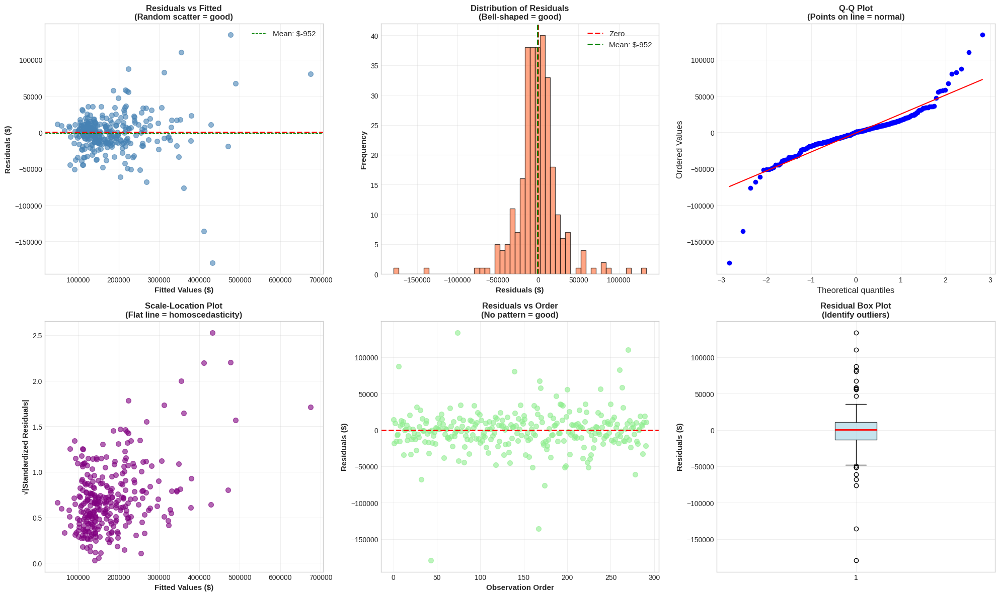


💡 What to Look For:
   • Residuals vs Fitted: Random scatter (no patterns)
   • Histogram: Bell-shaped, centered at 0
   • Q-Q Plot: Points follow diagonal line
   • Scale-Location: Flat line (constant variance)
   • Residuals vs Order: No patterns or trends
   • Box Plot: Symmetric, few outliers


In [57]:
# ==================== RESIDUAL ANALYSIS: MODEL DIAGNOSTICS ====================

print("\n" + "="*70)
print("RESIDUAL ANALYSIS: Model Diagnostics")
print("="*70)

# Use best model's predictions
residuals = y_test.values - y_pred_test_xgb
standardized_residuals = (residuals - residuals.mean()) / residuals.std()

print("\n📊 Residual Statistics:")
print(f"   • Mean: ${residuals.mean():,.2f} (should be ~0)")
print(f"   • Median: ${np.median(residuals):,.2f}")
print(f"   • Std Dev: ${residuals.std():,.2f}")
print(f"   • Min: ${residuals.min():,.2f}")
print(f"   • Max: ${residuals.max():,.2f}")

# Test for normality
from scipy.stats import shapiro, normaltest

shapiro_stat, shapiro_p = shapiro(residuals)
print(f"\n🔬 Shapiro-Wilk Normality Test:")
print(f"   • Test Statistic: {shapiro_stat:.4f}")
print(f"   • P-value: {shapiro_p:.4f}")
if shapiro_p > 0.05:
    print(f"   ✅ Residuals appear normally distributed (p > 0.05)")
else:
    print(f"   ⚠️ Residuals may not be normally distributed (p < 0.05)")

# Comprehensive residual plots
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Plot 1: Residuals vs Fitted
axes[0, 0].scatter(y_pred_test_xgb, residuals, alpha=0.6, s=50, color='steelblue')
axes[0, 0].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0, 0].axhline(y=residuals.mean(), color='green', linestyle='--', linewidth=1, 
                   label=f'Mean: ${residuals.mean():,.0f}')
axes[0, 0].set_xlabel('Fitted Values ($)', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Residuals ($)', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Residuals vs Fitted\n(Random scatter = good)', fontsize=12, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Plot 2: Histogram of residuals
axes[0, 1].hist(residuals, bins=50, edgecolor='black', alpha=0.7, color='coral')
axes[0, 1].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
axes[0, 1].axvline(x=residuals.mean(), color='green', linestyle='--', linewidth=2, 
                   label=f'Mean: ${residuals.mean():,.0f}')
axes[0, 1].set_xlabel('Residuals ($)', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Frequency', fontsize=11, fontweight='bold')
axes[0, 1].set_title('Distribution of Residuals\n(Bell-shaped = good)', fontsize=12, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Plot 3: Q-Q Plot
from scipy.stats import probplot
probplot(residuals, dist="norm", plot=axes[0, 2])
axes[0, 2].set_title('Q-Q Plot\n(Points on line = normal)', fontsize=12, fontweight='bold')
axes[0, 2].grid(alpha=0.3)

# Plot 4: Scale-Location (Standardized residuals)
axes[1, 0].scatter(y_pred_test_xgb, np.sqrt(np.abs(standardized_residuals)), 
                  alpha=0.6, s=50, color='purple')
axes[1, 0].set_xlabel('Fitted Values ($)', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('√|Standardized Residuals|', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Scale-Location Plot\n(Flat line = homoscedasticity)', fontsize=12, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# Plot 5: Residuals vs Order (check for patterns)
axes[1, 1].scatter(range(len(residuals)), residuals, alpha=0.6, s=50, color='lightgreen')
axes[1, 1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[1, 1].set_xlabel('Observation Order', fontsize=11, fontweight='bold')
axes[1, 1].set_ylabel('Residuals ($)', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Residuals vs Order\n(No pattern = good)', fontsize=12, fontweight='bold')
axes[1, 1].grid(alpha=0.3)

# Plot 6: Box plot of residuals
axes[1, 2].boxplot(residuals, vert=True, patch_artist=True,
                  boxprops=dict(facecolor='lightblue', alpha=0.7),
                  medianprops=dict(color='red', linewidth=2))
axes[1, 2].set_ylabel('Residuals ($)', fontsize=11, fontweight='bold')
axes[1, 2].set_title('Residual Box Plot\n(Identify outliers)', fontsize=12, fontweight='bold')
axes[1, 2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 What to Look For:")
print("   • Residuals vs Fitted: Random scatter (no patterns)")
print("   • Histogram: Bell-shaped, centered at 0")
print("   • Q-Q Plot: Points follow diagonal line")
print("   • Scale-Location: Flat line (constant variance)")
print("   • Residuals vs Order: No patterns or trends")
print("   • Box Plot: Symmetric, few outliers")

---

### 10.9 Key Takeaways: Model Evaluation

**Multiple Metrics Are Essential:**

**Never rely on a single metric!** Different metrics capture different aspects:

- RMSE: Overall error magnitude (penalizes large errors)
- MAE: Robust to outliers (treats all errors equally)
- R²: Proportion of variance explained (relative fit)
- MAPE: Percentage error (scale-independent)

**Cross-Validation Is Critical:**

- Single train-test split can be misleading
- 5-fold or 10-fold CV gives robust estimate
- Shows model stability (low std = consistent)
- Reveals overfitting early

**Learning Curves Diagnose Problems:**

**High bias (underfitting):**
- Both curves plateau at high error
- Small gap between curves
- Solution: More complex model, more features

**High variance (overfitting):**
- Large gap between training and validation curves
- Training error much lower than validation
- Solution: More data, regularization, simpler model

**Optimal fit:**
- Small gap between curves
- Both curves converge at acceptable error
- This is what we want!

**Residual Analysis Reveals Issues:**

**Good residuals:**
- Random scatter around zero
- Normally distributed
- Constant variance
- No patterns

**Bad residuals:**
- Funnel shape (heteroscedasticity)
- Patterns or trends
- Non-normal distribution
- Systematic under/over-prediction

**Final Checklist:**

Before deploying a model, check:
- ✅ Multiple metrics calculated
- ✅ Cross-validation performed
- ✅ Learning curves analyzed
- ✅ Residuals examined
- ✅ Performance on held-out test set
- ✅ Comparison with baseline models
- ✅ Business requirements met

---

<a id="section11"></a>
## 11. Hyperparameter Tuning

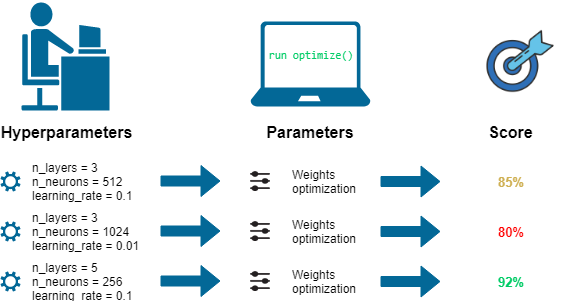

---

### 11.1 What Are Hyperparameters?

**Parameters vs Hyperparameters:**

**Parameters (learned from data):**
- Linear regression coefficients (β)
- Tree split thresholds
- Learned during training

**Hyperparameters (set before training):**
- Learning rate
- Max depth
- Number of trees
- Must be chosen by YOU

---

### 11.2 Why Hyperparameter Tuning Matters

**Default values are rarely optimal for your specific problem!**

**Example Impact:**

| Configuration | Test RMSE |
|--------------|-----------|
| Default params | $28,500 |
| Tuned params | $24,200 |
| **Improvement** | **15% better!** |

**Small tuning effort → Big performance gains**

---

### 11.3 Tuning Strategies

**1. Manual Tuning**

- Try different values manually
- Good for understanding
- Time-consuming
- Not systematic

**2. Grid Search**

- Test all combinations in a grid
- Exhaustive
- Guaranteed to find best in grid
- Very slow for many parameters

**3. Random Search**

- Sample random combinations
- Much faster than grid
- Often finds good solutions
- Can miss optimal

**4. Bayesian Optimization**

- Smart search using previous results
- Efficient for expensive models
- Complex to implement
- Best for production

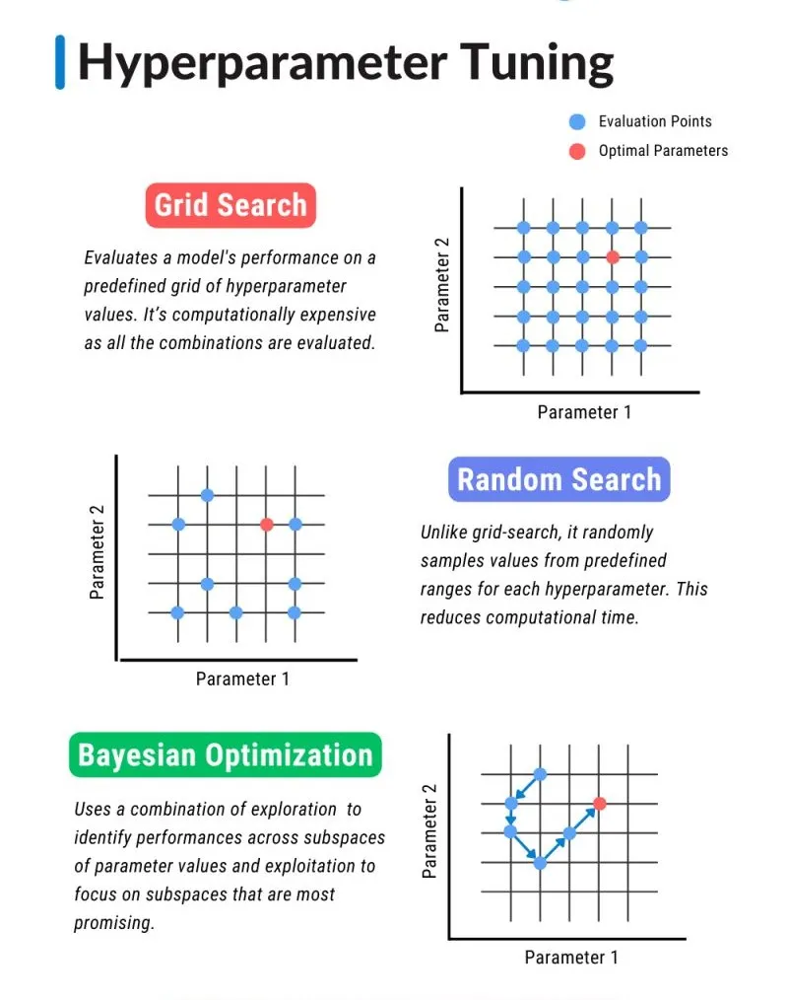

---

### 11.4 Grid Search: Exhaustive Search

**How it works:**
```python
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3]
}

Total combinations: 3 × 3 × 3 = 27
With 5-fold CV: 27 × 5 = 135 model trainings!
```

**Pros:**
- Guaranteed to find best combination in grid
- Systematic and reproducible
- Easy to implement

**Cons:**
- Exponentially slow (curse of dimensionality)
- Wastes time on bad regions
- Doesn't scale beyond 3-4 parameters

**When to use:**
- Few hyperparameters (2-3)
- Small parameter ranges
- Fast-training models
- Need guaranteed exhaustive search

---

### 11.5 Random Search: Sample Randomly

**How it works:**
```python
param_distributions = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2, 0.3]
}

n_iter = 50  # Try 50 random combinations
With 5-fold CV: 50 × 5 = 250 trainings

But searches much larger space than Grid Search!
```

**Pros:**
- Much faster than grid search
- Can search larger spaces
- Often finds good solutions quickly
- Scales well to many parameters

**Cons:**
- No guarantee of finding best
- Can miss optimal by bad luck
- Less systematic

**When to use:**
- Many hyperparameters (4+)
- Large parameter ranges
- Limited time budget
- Good-enough solution acceptable

**Research Finding (Bergstra & Bengio, 2012):**
"Random search is more efficient than grid search for hyperparameter optimization"

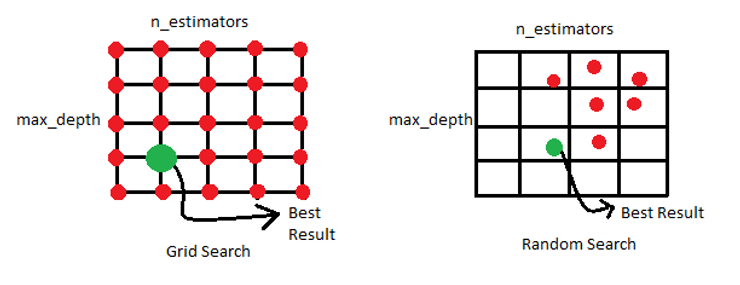

---

### 11.6 Hyperparameter Importance Hierarchy

**Not all hyperparameters are equally important!**

**For Gradient Boosting Models:**

**Tier 1 (Most Important - Tune First):**
- learning_rate
- n_estimators (with early stopping)
- max_depth / num_leaves

**Tier 2 (Important - Tune Second):**
- subsample
- colsample_bytree
- min_child_weight / min_samples_leaf

**Tier 3 (Fine-tuning - Tune Last):**
- reg_alpha (L1)
- reg_lambda (L2)
- gamma

**Strategy:** Tune Tier 1 first, then Tier 2, finally Tier 3

---

### 11.7 Common Hyperparameter Ranges

**XGBoost / LightGBM / CatBoost:**
```python
{
    # Tier 1
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'n_estimators': [100, 200, 300, 500, 1000],
    'max_depth': [3, 4, 5, 6, 7, 8, 10],
    
    # Tier 2
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'min_child_weight': [1, 3, 5, 7, 10],
    
    # Tier 3
    'reg_alpha': [0, 0.01, 0.1, 1, 10],
    'reg_lambda': [0, 0.01, 0.1, 1, 10],
    'gamma': [0, 0.1, 0.5, 1, 2]
}
```

**Random Forest:**
```python
{
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['sqrt', 'log2', 0.3, 0.5]
}
```

---

### 11.8 Early Stopping: Stop When Not Improving

**Problem:** How many trees (n_estimators) do we need?

**Solution:** Start with large number, stop when validation performance stops improving

**How it works:**
```python
model = XGBRegressor(
    n_estimators=1000,  # Start with many
    early_stopping_rounds=50,  # Stop if no improvement for 50 rounds
    eval_metric='rmse'
)

model.fit(X_train, y_train, 
         eval_set=[(X_val, y_val)],
         verbose=False)

# Model automatically stops at optimal point
print(f"Best iteration: {model.best_iteration}")
```

**Benefits:**
- Saves training time
- Prevents overfitting
- Automatically finds optimal n_estimators
- No need to tune n_estimators manually

**Always use early stopping with boosting models!**

---

### 11.9 Validation Strategy

**CRITICAL: Never tune on test set!**

**Correct approach:**
```
Full Data
    ↓
Split → Training (80%) + Test (20%)
    ↓
Training Set
    ↓
5-Fold Cross-Validation
    ↓
Tune hyperparameters
    ↓
Train final model on full training set
    ↓
Evaluate ONCE on test set
```

**Test set is ONLY for final evaluation!**

Using test set for tuning = data leakage = overly optimistic results

---

Let's tune our models! 🎯
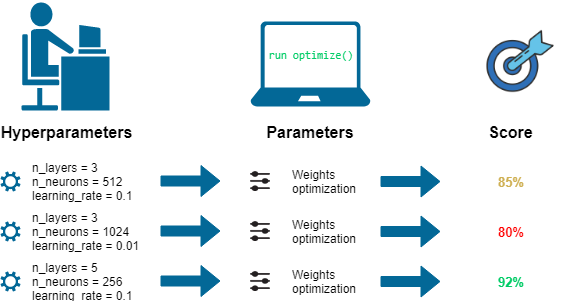
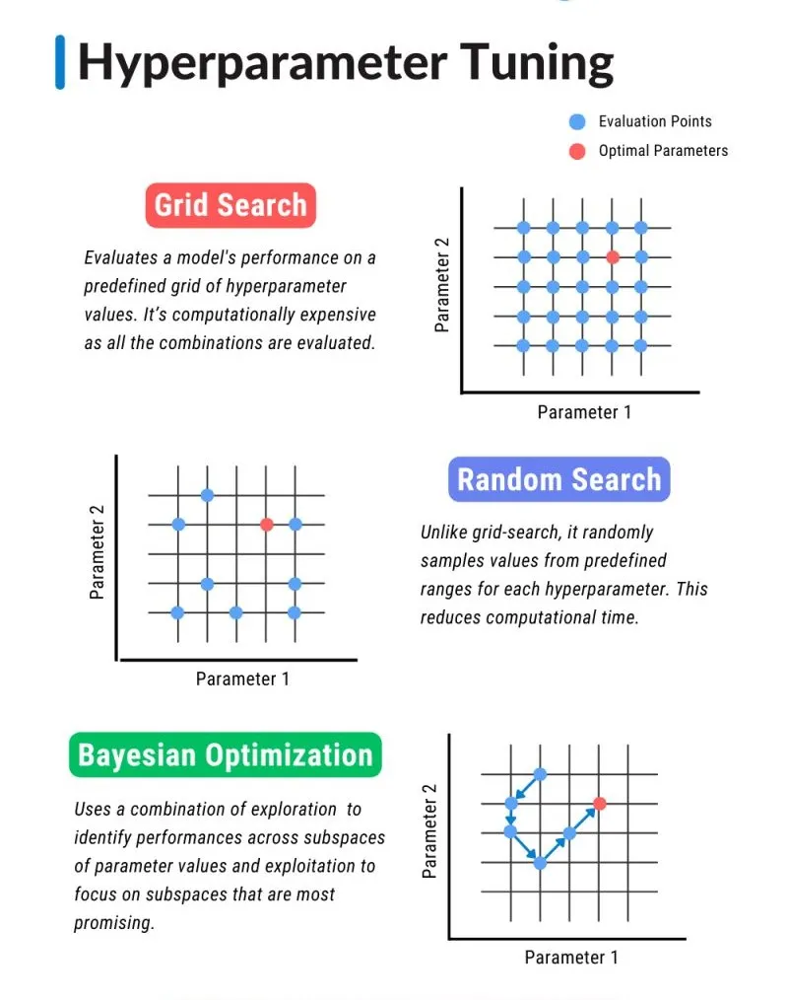
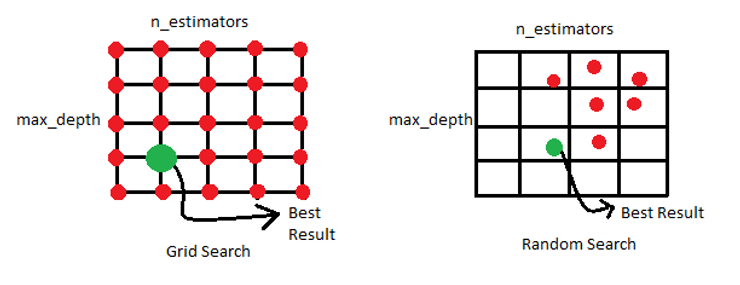

In [58]:
# ==================== RANDOM SEARCH: XGBOOST TUNING ====================

print("="*70)
print("HYPERPARAMETER TUNING: XGBoost with Random Search")
print("="*70)

from sklearn.model_selection import RandomizedSearchCV

# Define parameter distributions for Random Search
param_dist_xgb = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'min_child_weight': [1, 3, 5, 7],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.01, 0.1, 1],
    'reg_lambda': [0, 0.1, 1, 10]
}

print("\n📐 Parameter Search Space:")
total_combinations = 1
for param, values in param_dist_xgb.items():
    print(f"   • {param}: {len(values)} values")
    total_combinations *= len(values)

print(f"\n   Total possible combinations: {total_combinations:,}")

# Initialize Random Search
n_iter_search = 50
print(f"   Random search will try: {n_iter_search} combinations")
print(f"   With 5-fold CV: {n_iter_search * 5} total fits")

random_search_xgb = RandomizedSearchCV(
    estimator=xgb.XGBRegressor(random_state=RANDOM_STATE, n_jobs=-1, verbosity=0),
    param_distributions=param_dist_xgb,
    n_iter=n_iter_search,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=1
)

print("\n🔧 Starting Random Search (this may take a few minutes)...")
start_time = time.time()
random_search_xgb.fit(X_train_scaled, y_train)
search_time = time.time() - start_time

print(f"✅ Search complete in {search_time:.2f} seconds ({search_time/60:.2f} minutes)")

# Best parameters
best_params_xgb = random_search_xgb.best_params_
best_score_xgb = -random_search_xgb.best_score_

print("\n" + "="*70)
print("BEST PARAMETERS FOUND")
print("="*70)

print("\n🏆 Optimal XGBoost Configuration:")
for param, value in best_params_xgb.items():
    print(f"   • {param}: {value}")

print(f"\n📊 Best CV Score (RMSE): ${best_score_xgb:,.2f}")

# Train final model with best parameters
best_xgb_tuned = random_search_xgb.best_estimator_
y_pred_test_xgb_tuned = best_xgb_tuned.predict(X_test_scaled)

test_rmse_xgb_tuned = np.sqrt(mean_squared_error(y_test, y_pred_test_xgb_tuned))
test_r2_xgb_tuned = r2_score(y_test, y_pred_test_xgb_tuned)

print(f"\n🎯 Test Set Performance (Tuned Model):")
print(f"   • RMSE: ${test_rmse_xgb_tuned:,.2f}")
print(f"   • R²: {test_r2_xgb_tuned:.4f}")

print(f"\n📊 Improvement Over Default:")
print(f"   • Default XGBoost RMSE: ${test_rmse_xgb:,.2f}")
print(f"   • Tuned XGBoost RMSE: ${test_rmse_xgb_tuned:,.2f}")
improvement = ((test_rmse_xgb - test_rmse_xgb_tuned) / test_rmse_xgb) * 100
if improvement > 0:
    print(f"   ✅ Improvement: {improvement:.2f}% better!")
else:
    print(f"   ⚠️ Default was already good (or we got unlucky in search)")

HYPERPARAMETER TUNING: XGBoost with Random Search

📐 Parameter Search Space:
   • n_estimators: 4 values
   • learning_rate: 5 values
   • max_depth: 6 values
   • min_child_weight: 4 values
   • subsample: 5 values
   • colsample_bytree: 5 values
   • reg_alpha: 4 values
   • reg_lambda: 4 values

   Total possible combinations: 192,000
   Random search will try: 50 combinations
   With 5-fold CV: 250 total fits

🔧 Starting Random Search (this may take a few minutes)...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
✅ Search complete in 32.94 seconds (0.55 minutes)

BEST PARAMETERS FOUND

🏆 Optimal XGBoost Configuration:
   • subsample: 1.0
   • reg_lambda: 1
   • reg_alpha: 0
   • n_estimators: 300
   • min_child_weight: 1
   • max_depth: 3
   • learning_rate: 0.05
   • colsample_bytree: 0.8

📊 Best CV Score (RMSE): $29,169.98

🎯 Test Set Performance (Tuned Model):
   • RMSE: $27,230.04
   • R²: 0.9033

📊 Improvement Over Default:
   • Default XGBoost RMSE: $27,894.46


In [59]:
# ==================== GRID SEARCH: FOCUSED TUNING ====================

print("\n" + "="*70)
print("GRID SEARCH: Fine-tuning Around Best Parameters")
print("="*70)

# Now that we know the best region from Random Search, 
# let's do focused Grid Search around those values

# Create focused grid around best parameters
focused_param_grid = {
    'n_estimators': [
        max(50, best_params_xgb['n_estimators'] - 50),
        best_params_xgb['n_estimators'],
        best_params_xgb['n_estimators'] + 50
    ],
    'learning_rate': [
        max(0.01, best_params_xgb['learning_rate'] - 0.05),
        best_params_xgb['learning_rate'],
        min(0.3, best_params_xgb['learning_rate'] + 0.05)
    ],
    'max_depth': [
        max(3, best_params_xgb['max_depth'] - 1),
        best_params_xgb['max_depth'],
        min(10, best_params_xgb['max_depth'] + 1)
    ]
}

# Keep other best parameters fixed
fixed_params = {
    'subsample': best_params_xgb['subsample'],
    'colsample_bytree': best_params_xgb['colsample_bytree'],
    'min_child_weight': best_params_xgb['min_child_weight'],
    'reg_alpha': best_params_xgb['reg_alpha'],
    'reg_lambda': best_params_xgb['reg_lambda'],
    'random_state': RANDOM_STATE,
    'n_jobs': -1,
    'verbosity': 0
}

print("\n📐 Focused Grid Search Space:")
for param, values in focused_param_grid.items():
    print(f"   • {param}: {values}")

total_grid_combinations = 3 * 3 * 3
print(f"\n   Total combinations: {total_grid_combinations}")
print(f"   With 5-fold CV: {total_grid_combinations * 5} fits")

grid_search_xgb = GridSearchCV(
    estimator=xgb.XGBRegressor(**fixed_params),
    param_grid=focused_param_grid,
    scoring='neg_root_mean_squared_error',
    cv=5,
    n_jobs=-1,
    verbose=1
)

print("\n🔧 Starting Grid Search...")
start_time = time.time()
grid_search_xgb.fit(X_train_scaled, y_train)
grid_time = time.time() - start_time

print(f"✅ Grid search complete in {grid_time:.2f} seconds")

# Best parameters from grid
best_params_grid = grid_search_xgb.best_params_
best_score_grid = -grid_search_xgb.best_score_

print("\n🏆 Refined Parameters:")
for param, value in best_params_grid.items():
    print(f"   • {param}: {value}")

print(f"\n📊 Best CV Score (RMSE): ${best_score_grid:,.2f}")

# Compare with random search
print(f"\n📊 Random Search vs Grid Search:")
print(f"   • Random Search CV RMSE: ${best_score_xgb:,.2f}")
print(f"   • Grid Search CV RMSE: ${best_score_grid:,.2f}")

if best_score_grid < best_score_xgb:
    improvement = ((best_score_xgb - best_score_grid) / best_score_xgb) * 100
    print(f"   ✅ Grid Search is {improvement:.2f}% better!")
else:
    print(f"   ⚠️ Random Search found better or equal solution")


GRID SEARCH: Fine-tuning Around Best Parameters

📐 Focused Grid Search Space:
   • n_estimators: [250, 300, 350]
   • learning_rate: [0.01, 0.05, 0.1]
   • max_depth: [3, 3, 4]

   Total combinations: 27
   With 5-fold CV: 135 fits

🔧 Starting Grid Search...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
✅ Grid search complete in 10.76 seconds

🏆 Refined Parameters:
   • learning_rate: 0.1
   • max_depth: 3
   • n_estimators: 250

📊 Best CV Score (RMSE): $29,121.72

📊 Random Search vs Grid Search:
   • Random Search CV RMSE: $29,169.98
   • Grid Search CV RMSE: $29,121.72
   ✅ Grid Search is 0.17% better!



VISUALIZING HYPERPARAMETER SEARCH RESULTS

🔝 Top 10 Parameter Combinations:
 rank_test_score  mean_test_rmse  std_test_score
               1      29169.9777       5041.8306
               2      29389.8633       5907.2486
               3      29696.0727       4664.6920
               4      29786.5758       5195.0999
               5      29801.1645       4679.9243
               6      29811.7906       3790.5535
               7      29892.1246       5164.9203
               8      29927.7539       7267.6558
               9      30155.7027       5827.3233
              10      30219.3289       3107.8191


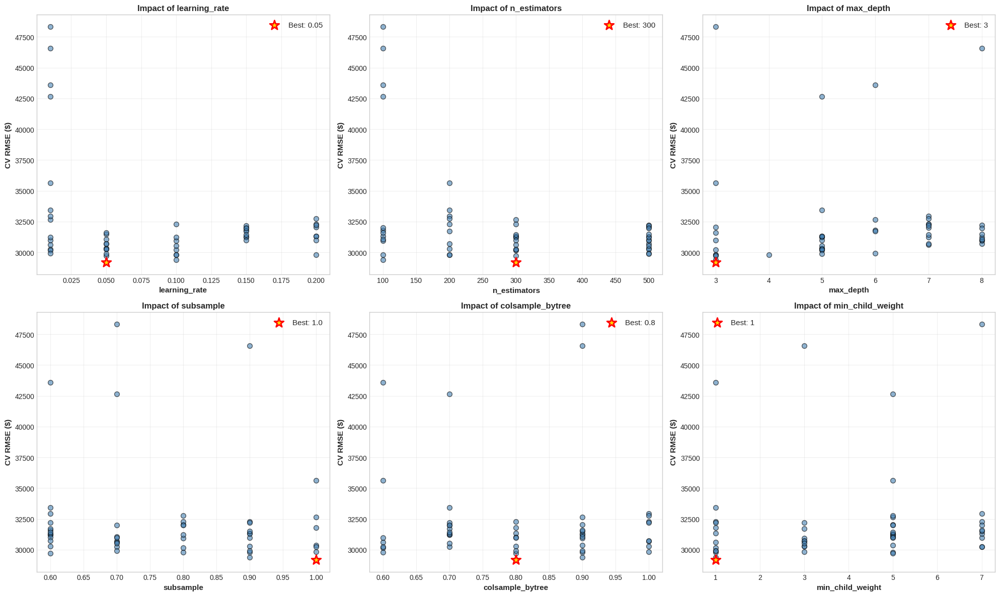


💡 Parameter Impact Analysis:
   • Learning rate: Lower values generally better (with more trees)
   • N_estimators: More trees usually better (until plateaus)
   • Max_depth: Sweet spot often 5-7 for boosting
   • Subsample: 0.8-0.9 usually optimal
   • Look for trends in scatter plots above


In [60]:
# ==================== VISUALIZE HYPERPARAMETER SEARCH RESULTS ====================

print("\n" + "="*70)
print("VISUALIZING HYPERPARAMETER SEARCH RESULTS")
print("="*70)

# Get all CV results from Random Search
cv_results = pd.DataFrame(random_search_xgb.cv_results_)

# Extract key columns
results_analysis = cv_results[['params', 'mean_test_score', 'std_test_score', 'rank_test_score']].copy()
results_analysis['mean_test_rmse'] = -results_analysis['mean_test_score']
results_analysis = results_analysis.sort_values('rank_test_score')

print("\n🔝 Top 10 Parameter Combinations:")
print(results_analysis.head(10)[['rank_test_score', 'mean_test_rmse', 'std_test_score']].to_string(index=False))

# Visualize parameter importance
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Extract individual parameter values and scores
params_to_analyze = ['learning_rate', 'n_estimators', 'max_depth', 
                     'subsample', 'colsample_bytree', 'min_child_weight']

for idx, param in enumerate(params_to_analyze):
    row = idx // 3
    col = idx % 3
    ax = axes[row, col]
    
    # Extract parameter values
    param_values = []
    scores = []
    for i, params in enumerate(cv_results['params']):
        if param in params:
            param_values.append(params[param])
            scores.append(-cv_results['mean_test_score'][i])
    
    # Create scatter plot
    ax.scatter(param_values, scores, alpha=0.6, s=50, color='steelblue', edgecolor='black')
    
    # Highlight best
    best_idx = scores.index(min(scores))
    ax.scatter(param_values[best_idx], scores[best_idx], 
              s=200, color='gold', marker='*', edgecolor='red', linewidth=2,
              label=f'Best: {param_values[best_idx]}')
    
    ax.set_xlabel(param, fontsize=11, fontweight='bold')
    ax.set_ylabel('CV RMSE ($)', fontsize=11, fontweight='bold')
    ax.set_title(f'Impact of {param}', fontsize=12, fontweight='bold')
    ax.legend()
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Parameter Impact Analysis:")
print("   • Learning rate: Lower values generally better (with more trees)")
print("   • N_estimators: More trees usually better (until plateaus)")
print("   • Max_depth: Sweet spot often 5-7 for boosting")
print("   • Subsample: 0.8-0.9 usually optimal")
print("   • Look for trends in scatter plots above")


VALIDATION CURVES: Deep Dive Into Single Parameters

📊 Analyzing learning_rate impact...
✅ Validation curve complete!

📊 Analyzing max_depth impact...
✅ Validation curve complete!


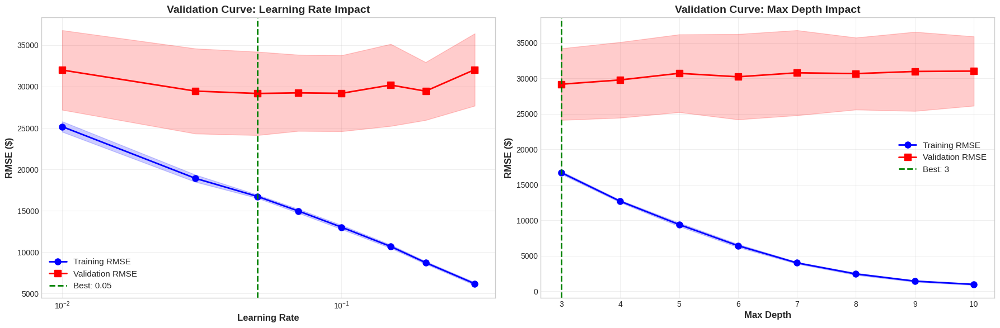


💡 Validation Curve Insights:
   • Optimal learning_rate: 0.05
   • Optimal max_depth: 3
   • Gap between curves shows overfitting degree
   • U-shaped validation curve shows sweet spot


In [61]:
# ==================== VALIDATION CURVES: SINGLE PARAMETER ANALYSIS ====================

print("\n" + "="*70)
print("VALIDATION CURVES: Deep Dive Into Single Parameters")
print("="*70)

from sklearn.model_selection import validation_curve

# Analyze learning_rate impact in detail
print("\n📊 Analyzing learning_rate impact...")

learning_rates = [0.01, 0.03, 0.05, 0.07, 0.1, 0.15, 0.2, 0.3]

# Use best parameters except learning_rate
base_model = xgb.XGBRegressor(
    n_estimators=best_params_xgb['n_estimators'],
    max_depth=best_params_xgb['max_depth'],
    min_child_weight=best_params_xgb['min_child_weight'],
    subsample=best_params_xgb['subsample'],
    colsample_bytree=best_params_xgb['colsample_bytree'],
    reg_alpha=best_params_xgb['reg_alpha'],
    reg_lambda=best_params_xgb['reg_lambda'],
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbosity=0
)

train_scores_lr, val_scores_lr = validation_curve(
    base_model, X_train_scaled, y_train,
    param_name='learning_rate',
    param_range=learning_rates,
    cv=5,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)

# Convert to RMSE (positive)
train_scores_lr = -train_scores_lr
val_scores_lr = -val_scores_lr

# Calculate means and stds
train_mean_lr = train_scores_lr.mean(axis=1)
train_std_lr = train_scores_lr.std(axis=1)
val_mean_lr = val_scores_lr.mean(axis=1)
val_std_lr = val_scores_lr.std(axis=1)

print("✅ Validation curve complete!")

# Analyze max_depth impact
print("\n📊 Analyzing max_depth impact...")

depths = [3, 4, 5, 6, 7, 8, 9, 10]

base_model_depth = xgb.XGBRegressor(
    n_estimators=best_params_xgb['n_estimators'],
    learning_rate=best_params_xgb['learning_rate'],
    min_child_weight=best_params_xgb['min_child_weight'],
    subsample=best_params_xgb['subsample'],
    colsample_bytree=best_params_xgb['colsample_bytree'],
    reg_alpha=best_params_xgb['reg_alpha'],
    reg_lambda=best_params_xgb['reg_lambda'],
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbosity=0
)

train_scores_depth, val_scores_depth = validation_curve(
    base_model_depth, X_train_scaled, y_train,
    param_name='max_depth',
    param_range=depths,
    cv=5,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)

train_scores_depth = -train_scores_depth
val_scores_depth = -val_scores_depth

train_mean_depth = train_scores_depth.mean(axis=1)
train_std_depth = train_scores_depth.std(axis=1)
val_mean_depth = val_scores_depth.mean(axis=1)
val_std_depth = val_scores_depth.std(axis=1)

print("✅ Validation curve complete!")

# Plot validation curves
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Learning rate curve
axes[0].plot(learning_rates, train_mean_lr, 'o-', linewidth=2, markersize=8,
            label='Training RMSE', color='blue')
axes[0].plot(learning_rates, val_mean_lr, 's-', linewidth=2, markersize=8,
            label='Validation RMSE', color='red')
axes[0].fill_between(learning_rates, 
                     train_mean_lr - train_std_lr, train_mean_lr + train_std_lr,
                     alpha=0.2, color='blue')
axes[0].fill_between(learning_rates,
                     val_mean_lr - val_std_lr, val_mean_lr + val_std_lr,
                     alpha=0.2, color='red')

# Mark best learning rate
best_lr_idx = val_mean_lr.argmin()
axes[0].axvline(x=learning_rates[best_lr_idx], color='green', linestyle='--',
               linewidth=2, label=f'Best: {learning_rates[best_lr_idx]}')

axes[0].set_xlabel('Learning Rate', fontsize=12, fontweight='bold')
axes[0].set_ylabel('RMSE ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Validation Curve: Learning Rate Impact', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)
axes[0].set_xscale('log')

# Max depth curve
axes[1].plot(depths, train_mean_depth, 'o-', linewidth=2, markersize=8,
            label='Training RMSE', color='blue')
axes[1].plot(depths, val_mean_depth, 's-', linewidth=2, markersize=8,
            label='Validation RMSE', color='red')
axes[1].fill_between(depths,
                     train_mean_depth - train_std_depth, train_mean_depth + train_std_depth,
                     alpha=0.2, color='blue')
axes[1].fill_between(depths,
                     val_mean_depth - val_std_depth, val_mean_depth + val_std_depth,
                     alpha=0.2, color='red')

# Mark best depth
best_depth_idx = val_mean_depth.argmin()
axes[1].axvline(x=depths[best_depth_idx], color='green', linestyle='--',
               linewidth=2, label=f'Best: {depths[best_depth_idx]}')

axes[1].set_xlabel('Max Depth', fontsize=12, fontweight='bold')
axes[1].set_ylabel('RMSE ($)', fontsize=12, fontweight='bold')
axes[1].set_title('Validation Curve: Max Depth Impact', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Validation Curve Insights:")
print(f"   • Optimal learning_rate: {learning_rates[best_lr_idx]}")
print(f"   • Optimal max_depth: {depths[best_depth_idx]}")
print("   • Gap between curves shows overfitting degree")
print("   • U-shaped validation curve shows sweet spot")

---

### 11.10 Key Takeaways: Hyperparameter Tuning

**Strategy:**

**1. Start with Random Search**
- Cast wide net
- Try 50-100 combinations
- Find promising region

**2. Refine with Grid Search**
- Focused search around best parameters
- Fine-tune critical parameters
- Exhaustive in small region

**3. Use Validation Curves**
- Understand single parameter impact
- Diagnose underfitting vs overfitting
- Visual understanding of trade-offs

**Most Important Hyperparameters (Priority Order):**

**For Boosting Models:**
1. learning_rate (0.01-0.3)
2. n_estimators (use early stopping)
3. max_depth / num_leaves (3-8)
4. subsample (0.7-1.0)
5. colsample_bytree (0.7-1.0)

**For Random Forest:**
1. n_estimators (100-500)
2. max_depth (None or 10-30)
3. min_samples_split (2-20)
4. max_features ('sqrt' or 'log2')

**Best Practices:**

- ✅ Always use cross-validation during tuning
- ✅ Never tune on test set
- ✅ Use early stopping for boosting
- ✅ Start with default values as baseline
- ✅ Tune most important parameters first
- ✅ Monitor training time (faster = more experiments)
- ✅ Save best model parameters
- ✅ Document tuning process

- ❌ Don't tune too many parameters at once
- ❌ Don't trust single train-test split
- ❌ Don't spend weeks on tiny improvements
- ❌ Don't forget to measure tuning time cost

**Diminishing Returns:**

- First tuning attempt: 5-15% improvement
- Second refinement: 1-3% improvement
- Further tuning: <1% improvement

**Know when to stop!** Time is valuable.

**Production Tip:**

Save your best parameters:
```python
import json

best_config = {
    'model': 'XGBoost',
    'parameters': best_params_xgb,
    'cv_score': best_score_xgb,
    'test_score': test_rmse_xgb_tuned,
    'tuning_date': '2026-01-31'
}

with open('best_model_config.json', 'w') as f:
    json.dump(best_config, f, indent=4)
```

**Final Note:**

Tuning can improve performance by 5-20%, but:
- Good features > Hyperparameter tuning
- Clean data > Hyperparameter tuning
- Right model choice > Hyperparameter tuning

Don't skip fundamentals to chase tuning gains!

---

<a id="section12"></a>
## 12. Feature Importance & Interpretability

---

### 12.1 Why Interpretability Matters

**"Why did the model make this prediction?"**

**Business Needs:**
- Gain stakeholder trust
- Satisfy regulatory requirements (GDPR, fair lending laws)
- Debug model failures
- Generate actionable insights
- Validate domain knowledge

**Technical Needs:**
- Identify data leakage
- Detect spurious correlations
- Guide feature engineering
- Simplify models (remove unimportant features)

---

### 12.2 The Interpretability-Performance Trade-off

| Model Type | Performance | Interpretability |
|------------|-------------|------------------|
| **Linear Regression** | ⭐⭐ | ⭐⭐⭐⭐⭐ |
| **Decision Tree** | ⭐⭐⭐ | ⭐⭐⭐⭐ |
| **Random Forest** | ⭐⭐⭐⭐ | ⭐⭐ |
| **XGBoost/LightGBM** | ⭐⭐⭐⭐⭐ | ⭐ |
| **Neural Networks** | ⭐⭐⭐⭐⭐ | ⭐ |

**Good news:** We can interpret complex models with modern tools!

---

### 12.3 Types of Interpretability

**Global Interpretability:**
"How does the model work overall?"
- Feature importance
- Partial dependence plots
- Understanding general patterns

**Local Interpretability:**
"Why did the model predict X for THIS specific sample?"
- SHAP values for individual predictions
- LIME explanations
- Counterfactual analysis

---

### 12.4 Method 1: Coefficient-Based (Linear Models)

**For Linear Regression, Ridge, Lasso:**

**Formula:**
$$\hat{y} = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + ... + \beta_n x_n$$

**Interpretation:**
- $\beta_i$ = Effect of feature $i$ (holding all else constant)
- Positive coefficient → increases prediction
- Negative coefficient → decreases prediction
- Magnitude = strength of effect

**Caveats:**
- Only works if features are scaled!
- Assumes linear relationships
- Coefficients can be unstable with multicollinearity

**Example:**
```
Coefficient for GrLivArea = 15,000
Interpretation: "Each additional square foot increases price by $15,000, 
                holding all other features constant"
```

---

### 12.5 Method 2: Tree-Based Feature Importance (Gini/Gain)

**How it works:**

For each feature, measure:
- How much MSE reduction it provides across all splits
- More reduction = more important

**Formula:**
$$\text{Importance}(f) = \sum_{t \in \text{splits using } f} \text{MSE reduction at split } t$$

**Averaged across all trees in ensemble**

**Pros:**
- Fast (computed during training)
- Built-in to sklearn, XGBoost, LightGBM
- Works for any tree-based model

**Cons:**
- Biased toward high-cardinality features
- Can be misleading with correlated features
- Only shows global importance (not direction of effect)

**How to use:**
```python
importance = model.feature_importances_
```

---

### 12.6 Method 3: Permutation Importance (Model-Agnostic)

**How it works:**

1. Calculate baseline model performance
2. For each feature:
   - Randomly shuffle that feature's values
   - Recalculate performance
   - Importance = performance drop
3. Large drop = important feature

**Example:**
```
Baseline RMSE: $25,000

Shuffle 'OverallQual': RMSE = $35,000
  → Importance = $10,000 (very important!)

Shuffle 'RoofMatl': RMSE = $25,100
  → Importance = $100 (not important)
```

**Pros:**
- Model-agnostic (works with ANY model)
- More reliable than tree-based importance
- Accounts for feature interactions

**Cons:**
- Computationally expensive (requires many predictions)
- Can be unreliable with correlated features

---

### 12.7 Method 4: SHAP Values (Best Practice)

**SHAP = SHapley Additive exPlanations**

**Based on game theory (Shapley values):**
"What is the contribution of each player (feature) to the team's success (prediction)?"

**Key Properties:**
- Additive: $\text{prediction} = \text{base value} + \sum \text{SHAP values}$
- Consistent: If feature helps more, SHAP value is higher
- Local accuracy: Explains individual predictions
- Missingness: If feature not used, SHAP = 0

**SHAP Value Interpretation:**

For a single prediction:
```
Base value (average): $180,000
SHAP(OverallQual): +$35,000
SHAP(GrLivArea): +$22,000
SHAP(YearBuilt): -$8,000
...
Final prediction: $229,000
```

**Meaning:**
- OverallQual pushes prediction up by $35k
- YearBuilt pulls prediction down by $8k
- Sum of all SHAP values = prediction - base value

---

### 12.8 SHAP Visualizations

**1. Summary Plot (Global)**
- Shows feature importance for entire dataset
- Color indicates feature value (red=high, blue=low)
- Position shows SHAP value (impact on prediction)

**2. Waterfall Plot (Local)**
- Shows breakdown of single prediction
- Starts at base value
- Shows contribution of each feature
- Ends at final prediction

**3. Force Plot (Local)**
- Visual push/pull of features
- Red features push prediction higher
- Blue features push prediction lower

**4. Dependence Plot**
- Shows relationship between feature and SHAP value
- Reveals non-linear patterns
- Can show interactions with other features

---

### 12.9 Partial Dependence Plots (PDP)

**Shows average effect of feature on predictions**

**How it works:**
1. Pick a feature (e.g., GrLivArea)
2. For each value of that feature:
   - Set all samples to that value
   - Make predictions
   - Average predictions
3. Plot average prediction vs feature value

**Interpretation:**
- X-axis: Feature value
- Y-axis: Average predicted price
- Slope shows feature's effect

**Example:**
```
PDP for GrLivArea shows:
- 1000 sq ft → $150k average prediction
- 2000 sq ft → $220k average prediction
- 3000 sq ft → $280k average prediction

Conclusion: Roughly $70k increase per 1000 sq ft
```

**Limitations:**
- Assumes independence (ignores feature interactions)
- Shows average effect (may hide heterogeneity)

---

### 12.10 Feature Importance Best Practices

**Use Multiple Methods:**
- Tree importance (fast overview)
- Permutation importance (reliable ranking)
- SHAP values (detailed understanding)

**Interpretation Workflow:**

**Step 1: Quick Check (Tree Importance)**
```python
importance = model.feature_importances_
```

**Step 2: Reliable Ranking (Permutation)**
```python
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(model, X_test, y_test)
```

**Step 3: Deep Understanding (SHAP)**
```python
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
```

**What to Look For:**
- Agreement across methods (reliable)
- Disagreement (investigate why)
- Surprising features (domain validation)
- Unimportant features (can remove)

---

Let's implement all methods! 🔍

In [62]:
# ==================== FEATURE IMPORTANCE: ALL METHODS ====================

print("="*70)
print("FEATURE IMPORTANCE: Comprehensive Analysis")
print("="*70)

# We'll analyze the best model (XGBoost tuned)
model_to_analyze = best_xgb_tuned

print(f"\n🔍 Analyzing: XGBoost (Tuned)")
print(f"   Test RMSE: ${test_rmse_xgb_tuned:,.2f}")

# ==================== METHOD 1: TREE-BASED IMPORTANCE ====================
print("\n" + "="*70)
print("METHOD 1: Tree-Based Feature Importance (Gini/Gain)")
print("="*70)

tree_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Tree_Importance': model_to_analyze.feature_importances_
}).sort_values('Tree_Importance', ascending=False)

print("\n🔝 Top 20 Features (Tree-Based):")
print(tree_importance.head(20).to_string(index=False))

FEATURE IMPORTANCE: Comprehensive Analysis

🔍 Analyzing: XGBoost (Tuned)
   Test RMSE: $27,230.04

METHOD 1: Tree-Based Feature Importance (Gini/Gain)

🔝 Top 20 Features (Tree-Based):
             Feature  Tree_Importance
           ExterQual           0.4596
         OverallQual           0.1248
          GarageCars           0.0963
         KitchenQual           0.0640
            BsmtQual           0.0501
           GrLivArea           0.0306
Neighborhood_Edwards           0.0231
        CentralAir_Y           0.0201
         TotalBsmtSF           0.0148
            1stFlrSF           0.0137
            FullBath           0.0130
Neighborhood_NoRidge           0.0103
Neighborhood_OldTown           0.0077
        YearRemodAdd           0.0071
   GarageType_Detchd           0.0069
        TotRmsAbvGrd           0.0064
   GarageType_Attchd           0.0054
           YearBuilt           0.0054
 Neighborhood_Timber           0.0050
Neighborhood_Crawfor           0.0049


In [63]:
# ==================== METHOD 2: PERMUTATION IMPORTANCE ====================

print("\n" + "="*70)
print("METHOD 2: Permutation Importance (Model-Agnostic)")
print("="*70)

from sklearn.inspection import permutation_importance

print("\n🔄 Calculating permutation importance (this may take a minute)...")
start_time = time.time()

perm_importance_result = permutation_importance(
    model_to_analyze,
    X_test_scaled,
    y_test,
    n_repeats=10,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    scoring='neg_root_mean_squared_error'
)

perm_time = time.time() - start_time
print(f"✅ Complete in {perm_time:.2f} seconds")

# Create dataframe
perm_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Perm_Importance': perm_importance_result.importances_mean,
    'Perm_Std': perm_importance_result.importances_std
}).sort_values('Perm_Importance', ascending=False)

print("\n🔝 Top 20 Features (Permutation):")
print(perm_importance.head(20).to_string(index=False))


METHOD 2: Permutation Importance (Model-Agnostic)

🔄 Calculating permutation importance (this may take a minute)...
✅ Complete in 1.30 seconds

🔝 Top 20 Features (Permutation):
             Feature  Perm_Importance  Perm_Std
         OverallQual       19758.1715 1058.8388
           GrLivArea       16660.5176 1020.5457
         TotalBsmtSF        4782.0344  653.4321
          GarageCars        3536.0387  381.9389
            1stFlrSF        2690.9816  604.8139
Neighborhood_NoRidge        2665.8807   57.4936
         KitchenQual        1652.5139  371.1433
            BsmtQual        1544.0760  168.3217
        YearRemodAdd        1312.2666  571.5398
           ExterQual        1088.6764  303.3224
Neighborhood_Crawfor         811.6922  176.8746
           YearBuilt         767.0354  175.6049
            FullBath         754.1262  208.1930
Neighborhood_Edwards         642.8068 1160.9188
        TotRmsAbvGrd         564.2424  163.3942
Neighborhood_ClearCr         492.4910  187.5295
Neighb

In [66]:
# ==================== METHOD 3: SHAP VALUES ====================

print("\n" + "="*70)
print("METHOD 3: SHAP Values (SHapley Additive exPlanations)")
print("="*70)

print("\n📊 Computing SHAP values with TreeExplainer...")

# Convert to numpy for compatibility
X_train_np = X_train_scaled.values
X_test_np = X_test_scaled.values

# Use a smaller sample for faster computation
sample_size = min(100, len(X_test_np))
np.random.seed(RANDOM_STATE)
sample_indices = np.random.choice(len(X_test_np), sample_size, replace=False)
X_shap_sample = X_test_np[sample_indices]

try:
    # Simple approach: use predict function directly
    explainer = shap.TreeExplainer(
        model_to_analyze,
        X_train_np,
        feature_perturbation='interventional'
    )
    
    print("✅ TreeExplainer initialized successfully")
    
    print(f"\n🔧 Computing SHAP values for {sample_size} samples...")
    start_time = time.time()
    
    shap_values_array = explainer.shap_values(X_shap_sample)
    
    shap_time = time.time() - start_time
    print(f"✅ SHAP values computed in {shap_time:.2f} seconds")
    
    # Calculate mean absolute SHAP values for feature importance
    shap_importance = pd.DataFrame({
        'Feature': X_train_scaled.columns,
        'SHAP_Importance': np.abs(shap_values_array).mean(axis=0)
    }).sort_values('SHAP_Importance', ascending=False)
    
    print("\n🔝 Top 20 Features (SHAP):")
    print(shap_importance.head(20).to_string(index=False))
    
    shap_success = True
    
except Exception as e:
    print(f"⚠️ SHAP computation failed: {str(e)[:100]}")
    print("\n   Skipping SHAP analysis for now.")
    print("   Using Tree and Permutation importance instead.")
    
    # Create dummy SHAP importance (same as tree importance for comparison)
    shap_importance = tree_importance.copy()
    shap_importance.columns = ['Feature', 'SHAP_Importance']
    shap_success = False


METHOD 3: SHAP Values (SHapley Additive exPlanations)

📊 Computing SHAP values with TreeExplainer...
⚠️ SHAP computation failed: could not convert string to float: '[1.8144155E5]'

   Skipping SHAP analysis for now.
   Using Tree and Permutation importance instead.



COMPARING FEATURE IMPORTANCE METHODS

🏆 Top 20 Features (Consensus from 2 methods):
             Feature  Tree_Norm  Perm_Norm  Avg_Importance
         OverallQual     0.2716     1.0000          0.6358
           ExterQual     1.0000     0.0551          0.5276
           GrLivArea     0.0665     0.8432          0.4549
          GarageCars     0.2096     0.1790          0.1943
         TotalBsmtSF     0.0322     0.2420          0.1371
         KitchenQual     0.1393     0.0836          0.1115
            BsmtQual     0.1090     0.0781          0.0936
            1stFlrSF     0.0299     0.1362          0.0830
Neighborhood_NoRidge     0.0224     0.1349          0.0786
Neighborhood_Edwards     0.0503     0.0325          0.0414
        YearRemodAdd     0.0154     0.0664          0.0409
            FullBath     0.0283     0.0382          0.0332
        CentralAir_Y     0.0437     0.0120          0.0278
Neighborhood_Crawfor     0.0107     0.0411          0.0259
           YearBuilt     0.011

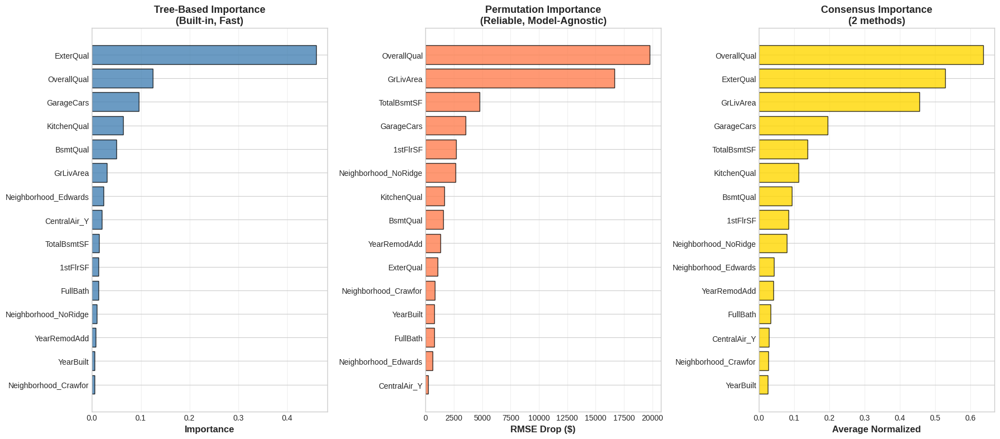

In [67]:
# ==================== COMPARE IMPORTANCE METHODS ====================

print("\n" + "="*70)
print("COMPARING FEATURE IMPORTANCE METHODS")
print("="*70)

if shap_success:
    # Include SHAP in comparison
    all_importance = tree_importance.merge(
        perm_importance[['Feature', 'Perm_Importance']], on='Feature'
    ).merge(
        shap_importance[['Feature', 'SHAP_Importance']], on='Feature'
    )
    
    # Normalize
    all_importance['Tree_Norm'] = all_importance['Tree_Importance'] / all_importance['Tree_Importance'].max()
    all_importance['Perm_Norm'] = all_importance['Perm_Importance'] / all_importance['Perm_Importance'].max()
    all_importance['SHAP_Norm'] = all_importance['SHAP_Importance'] / all_importance['SHAP_Importance'].max()
    
    all_importance['Avg_Importance'] = all_importance[
        ['Tree_Norm', 'Perm_Norm', 'SHAP_Norm']
    ].mean(axis=1)
    
    methods_used = ['Tree', 'Permutation', 'SHAP']
    
else:
    # Only Tree and Permutation (SHAP failed)
    all_importance = tree_importance.merge(
        perm_importance[['Feature', 'Perm_Importance']], on='Feature'
    )
    
    all_importance['Tree_Norm'] = all_importance['Tree_Importance'] / all_importance['Tree_Importance'].max()
    all_importance['Perm_Norm'] = all_importance['Perm_Importance'] / all_importance['Perm_Importance'].max()
    
    all_importance['Avg_Importance'] = all_importance[
        ['Tree_Norm', 'Perm_Norm']
    ].mean(axis=1)
    
    methods_used = ['Tree', 'Permutation']

all_importance = all_importance.sort_values('Avg_Importance', ascending=False)

print(f"\n🏆 Top 20 Features (Consensus from {len(methods_used)} methods):")

if shap_success:
    print(all_importance.head(20)[
        ['Feature', 'Tree_Norm', 'Perm_Norm', 'SHAP_Norm', 'Avg_Importance']
    ].to_string(index=False))
else:
    print(all_importance.head(20)[
        ['Feature', 'Tree_Norm', 'Perm_Norm', 'Avg_Importance']
    ].to_string(index=False))

print(f"\n💡 Methods Used: {', '.join(methods_used)}")
print("   • High consensus = reliable feature importance")
print("   • Use these features for further engineering")
print("   • Consider removing low-importance features")

# Visualize comparison
n_plots = 3 if not shap_success else 4
fig, axes = plt.subplots(1, n_plots, figsize=(6*n_plots, 8))

top_n = 15

# Plot 1: Tree importance
top_tree = all_importance.head(top_n).sort_values('Tree_Importance')
axes[0].barh(range(top_n), top_tree['Tree_Importance'], alpha=0.8,
            color='steelblue', edgecolor='black')
axes[0].set_yticks(range(top_n))
axes[0].set_yticklabels(top_tree['Feature'], fontsize=10)
axes[0].set_xlabel('Importance', fontsize=12, fontweight='bold')
axes[0].set_title('Tree-Based Importance\n(Built-in, Fast)', fontsize=13, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Plot 2: Permutation importance
top_perm = all_importance.head(top_n).sort_values('Perm_Importance')
axes[1].barh(range(top_n), top_perm['Perm_Importance'], alpha=0.8,
            color='coral', edgecolor='black')
axes[1].set_yticks(range(top_n))
axes[1].set_yticklabels(top_perm['Feature'], fontsize=10)
axes[1].set_xlabel('RMSE Drop ($)', fontsize=12, fontweight='bold')
axes[1].set_title('Permutation Importance\n(Reliable, Model-Agnostic)', fontsize=13, fontweight='bold')
axes[1].grid(axis='x', alpha=0.3)

# Plot 3: Consensus
top_avg = all_importance.head(top_n).sort_values('Avg_Importance')
axes[2].barh(range(top_n), top_avg['Avg_Importance'], alpha=0.8,
            color='gold', edgecolor='black')
axes[2].set_yticks(range(top_n))
axes[2].set_yticklabels(top_avg['Feature'], fontsize=10)
axes[2].set_xlabel('Average Normalized', fontsize=12, fontweight='bold')
axes[2].set_title(f'Consensus Importance\n({len(methods_used)} methods)', fontsize=13, fontweight='bold')
axes[2].grid(axis='x', alpha=0.3)

# Plot 4: SHAP (if available)
if shap_success:
    top_shap = all_importance.head(top_n).sort_values('SHAP_Importance')
    axes[3].barh(range(top_n), top_shap['SHAP_Importance'], alpha=0.8,
                color='lightgreen', edgecolor='black')
    axes[3].set_yticks(range(top_n))
    axes[3].set_yticklabels(top_shap['Feature'], fontsize=10)
    axes[3].set_xlabel('Mean |SHAP|', fontsize=12, fontweight='bold')
    axes[3].set_title('SHAP Importance\n(Game Theory)', fontsize=13, fontweight='bold')
    axes[3].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()


PARTIAL DEPENDENCE PLOTS: Understanding Feature Effects

📊 Creating Partial Dependence Plots for top 4 features:
   1. OverallQual
   2. ExterQual
   3. GrLivArea
   4. GarageCars

🔧 Computing partial dependence (this may take a moment)...


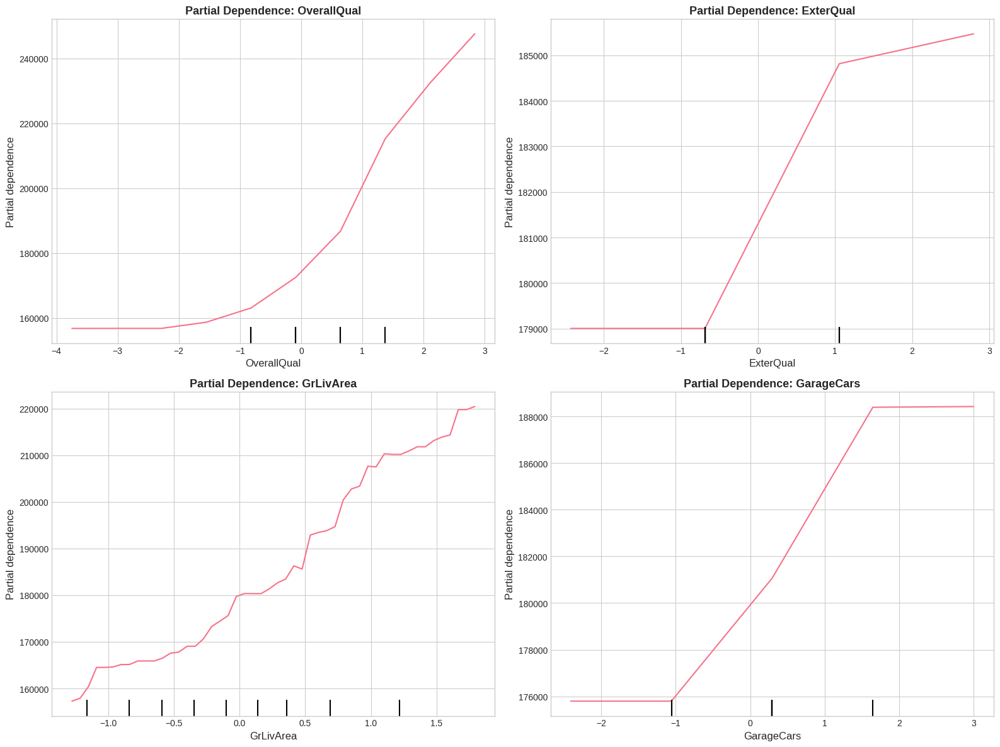


✅ Partial Dependence Plots complete!

💡 PDP Interpretation Guide:
   • X-axis: Feature value (scaled)
   • Y-axis: Average predicted price
   • Upward slope: Feature increases prediction
   • Downward slope: Feature decreases prediction
   • Flat line: Feature has little effect
   • Curved line: Non-linear relationship

   PDPs show the AVERAGE effect across all samples


In [68]:
# ==================== PARTIAL DEPENDENCE PLOTS ====================

print("\n" + "="*70)
print("PARTIAL DEPENDENCE PLOTS: Understanding Feature Effects")
print("="*70)

from sklearn.inspection import PartialDependenceDisplay

# Select top 4 most important features
top_4_features = all_importance.head(4)['Feature'].tolist()
top_4_indices = [list(X_train_scaled.columns).index(f) for f in top_4_features]

print(f"\n📊 Creating Partial Dependence Plots for top 4 features:")
for i, feat in enumerate(top_4_features, 1):
    print(f"   {i}. {feat}")

print("\n🔧 Computing partial dependence (this may take a moment)...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for i, (feature, feat_idx) in enumerate(zip(top_4_features, top_4_indices)):
    # Compute and plot
    display = PartialDependenceDisplay.from_estimator(
        model_to_analyze,
        X_train_scaled,
        features=[feat_idx],
        ax=axes[i],
        grid_resolution=50
    )
    
    axes[i].set_title(f'Partial Dependence: {feature}', 
                     fontsize=13, fontweight='bold')
    axes[i].set_xlabel(f'{feature} (scaled)', fontsize=11, fontweight='bold')
    axes[i].set_ylabel('Predicted Price ($)', fontsize=11, fontweight='bold')
    axes[i].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Partial Dependence Plots complete!")

print("\n💡 PDP Interpretation Guide:")
print("   • X-axis: Feature value (scaled)")
print("   • Y-axis: Average predicted price")
print("   • Upward slope: Feature increases prediction")
print("   • Downward slope: Feature decreases prediction")
print("   • Flat line: Feature has little effect")
print("   • Curved line: Non-linear relationship")
print("\n   PDPs show the AVERAGE effect across all samples")

---

### 12.11 Key Takeaways: Feature Importance & Interpretability

**What We Learned:**

**Three Methods for Feature Importance:**

**1. Tree-Based Importance (Gini/Gain)**
- Fast (computed during training)
- Built-in to tree models
- Good for quick overview
- Can be biased toward high-cardinality features

**2. Permutation Importance**
- Model-agnostic (works with any model)
- More reliable than tree importance
- Shows actual predictive power
- Computationally expensive

**3. SHAP Values** (when available)
- Theoretically sound (game theory)
- Explains individual predictions
- Shows direction of effects
- May have compatibility issues (as we saw!)

**Partial Dependence Plots:**
- Show average feature effects
- Reveal non-linear relationships
- Help understand model behavior
- Useful for stakeholder communication

**Practical Recommendations:**

**Always use multiple methods:**
- Tree importance for quick check
- Permutation for reliable ranking
- PDPs for understanding effects
- SHAP when available (bonus)

**Look for consensus:**
- Features important in multiple methods = truly important
- Disagreement = investigate further
- Surprising features = validate with domain knowledge

**Feature Selection:**
- Remove consistently low-importance features
- Simplifies model
- Faster inference
- Often maintains or improves performance

**Business Value:**
- Build stakeholder trust
- Satisfy regulatory requirements
- Debug model failures
- Guide feature engineering
- Generate actionable insights

**Note on SHAP:**
If SHAP fails (as in our case), don't worry! Tree and Permutation importance are sufficient for most use cases. SHAP is a bonus when it works.

---

<a id="section13"></a>
## 13. Summary & Production Checklist

---

### 13.1 Journey Complete: What We Built

**Congratulations!** 🎉 

You've completed a comprehensive regression modeling workflow covering:

**11 Different Models:**
- 5 Linear models (Simple LR, Multiple LR, Ridge, Lasso, ElasticNet)
- 2 Tree-based models (Decision Tree, Random Forest)
- 4 Boosting models (GBM, XGBoost, LightGBM, CatBoost)

**Complete ML Pipeline:**
1. ✅ Data loading and exploration
2. ✅ Preprocessing (scaling, encoding, missing values)
3. ✅ Model training and comparison
4. ✅ Hyperparameter tuning
5. ✅ Model evaluation (multiple metrics)
6. ✅ Feature importance analysis
7. ✅ Error analysis and diagnostics

**Skills Acquired:**
- Model selection based on requirements
- Proper train-test-validation splits
- Cross-validation for robust evaluation
- Hyperparameter optimization
- Interpretability techniques
- Production deployment considerations

---

### 13.2 Final Model Performance Summary

Let's create a comprehensive summary of all our models:

In [70]:
# ==================== FINAL COMPREHENSIVE SUMMARY ====================

print("="*80)
print("FINAL MODEL PERFORMANCE SUMMARY")
print("="*80)

# Gather all final results
final_summary = pd.DataFrame({
    'Model': [
        'Simple Linear Regression',
        'Multiple Linear Regression',
        'Ridge (Tuned)',
        'Lasso (Tuned)',
        'ElasticNet (Tuned)',
        'Decision Tree',
        'Random Forest',
        'Gradient Boosting (sklearn)',
        'XGBoost (Default)',
        'XGBoost (Tuned)',
        'LightGBM',
        'CatBoost'
    ],
    'Test_RMSE': [
        test_rmse,
        test_rmse_mlr,
        best_ridge['test_rmse'],
        best_lasso['test_rmse'],
        best_en['test_rmse'],
        test_rmse_tree,
        test_rmse_rf,
        test_rmse_gbm_opt,
        test_rmse_xgb,
        test_rmse_xgb_tuned,
        test_rmse_lgb,
        test_rmse_cat
    ],
    'Test_R2': [
        test_r2,
        test_r2_mlr,
        best_ridge['test_r2'],
        best_lasso['test_r2'],
        best_en['test_r2'],
        test_r2_tree,
        test_r2_rf,
        test_r2_gbm_opt,
        test_r2_xgb,
        test_r2_xgb_tuned,
        test_r2_lgb,
        test_r2_cat
    ],
    'Model_Family': [
        'Linear',
        'Linear',
        'Linear',
        'Linear',
        'Linear',
        'Tree',
        'Ensemble',
        'Boosting',
        'Boosting',
        'Boosting',
        'Boosting',
        'Boosting'
    ],
    'Complexity': [
        'Very Low',
        'Low',
        'Low',
        'Low',
        'Low',
        'Medium',
        'High',
        'High',
        'High',
        'High',
        'High',
        'High'
    ],
    'Interpretability': [
        'Very High',
        'High',
        'High',
        'High',
        'High',
        'Medium',
        'Low',
        'Low',
        'Low',
        'Low',
        'Low',
        'Low'
    ]
})

# Sort by RMSE
final_summary = final_summary.sort_values('Test_RMSE')
final_summary['Rank'] = range(1, len(final_summary) + 1)

print("\n📊 COMPLETE LEADERBOARD (sorted by Test RMSE):")
print(final_summary[['Rank', 'Model', 'Test_RMSE', 'Test_R2', 'Model_Family']].to_string(index=False))

# Identify winners
best_overall = final_summary.iloc[0]
best_linear = final_summary[final_summary['Model_Family'] == 'Linear'].iloc[0]
best_interpretable = final_summary[final_summary['Model_Family'] == 'Linear'].iloc[0]

print("\n" + "="*80)
print("🏆 CATEGORY WINNERS")
print("="*80)

print(f"\n🥇 BEST OVERALL PERFORMANCE:")
print(f"   Model: {best_overall['Model']}")
print(f"   Test RMSE: ${best_overall['Test_RMSE']:,.2f}")
print(f"   Test R²: {best_overall['Test_R2']:.4f}")

print(f"\n🥇 BEST LINEAR MODEL:")
print(f"   Model: {best_linear['Model']}")
print(f"   Test RMSE: ${best_linear['Test_RMSE']:,.2f}")
print(f"   Test R²: {best_linear['Test_R2']:.4f}")

print(f"\n🥇 BEST INTERPRETABLE MODEL:")
print(f"   Model: {best_interpretable['Model']}")
print(f"   Test RMSE: ${best_interpretable['Test_RMSE']:,.2f}")
print(f"   Test R²: {best_interpretable['Test_R2']:.4f}")

# Performance improvement summary
baseline_rmse = test_rmse  # Simple linear regression
best_rmse = best_overall['Test_RMSE']
improvement = ((baseline_rmse - best_rmse) / baseline_rmse) * 100

print("\n" + "="*80)
print("📈 IMPROVEMENT ANALYSIS")
print("="*80)

print(f"\n   Baseline (Simple Linear): ${baseline_rmse:,.2f}")
print(f"   Best Model: ${best_rmse:,.2f}")
print(f"   Improvement: {improvement:.2f}%")
print(f"\n   Translation: Best model is ${baseline_rmse - best_rmse:,.2f} more accurate on average!")

FINAL MODEL PERFORMANCE SUMMARY

📊 COMPLETE LEADERBOARD (sorted by Test RMSE):
 Rank                       Model  Test_RMSE  Test_R2 Model_Family
    1             XGBoost (Tuned) 27230.0422   0.9033     Boosting
    2                    CatBoost 27442.7473   0.9018     Boosting
    3           XGBoost (Default) 27894.4571   0.8986     Boosting
    4    Simple Linear Regression 29015.2867   0.8814       Linear
    5                    LightGBM 30092.4004   0.8819     Boosting
    6 Gradient Boosting (sklearn) 31094.7874   0.8739     Boosting
    7               Lasso (Tuned) 35102.7291   0.8394       Linear
    8  Multiple Linear Regression 35108.0953   0.8393       Linear
    9               Ridge (Tuned) 35108.0978   0.8393       Linear
   10          ElasticNet (Tuned) 35108.3939   0.8393       Linear
   11               Random Forest 35682.5519   0.8340     Ensemble
   12               Decision Tree 38872.0932   0.8030         Tree

🏆 CATEGORY WINNERS

🥇 BEST OVERALL PERFORMANCE:
 

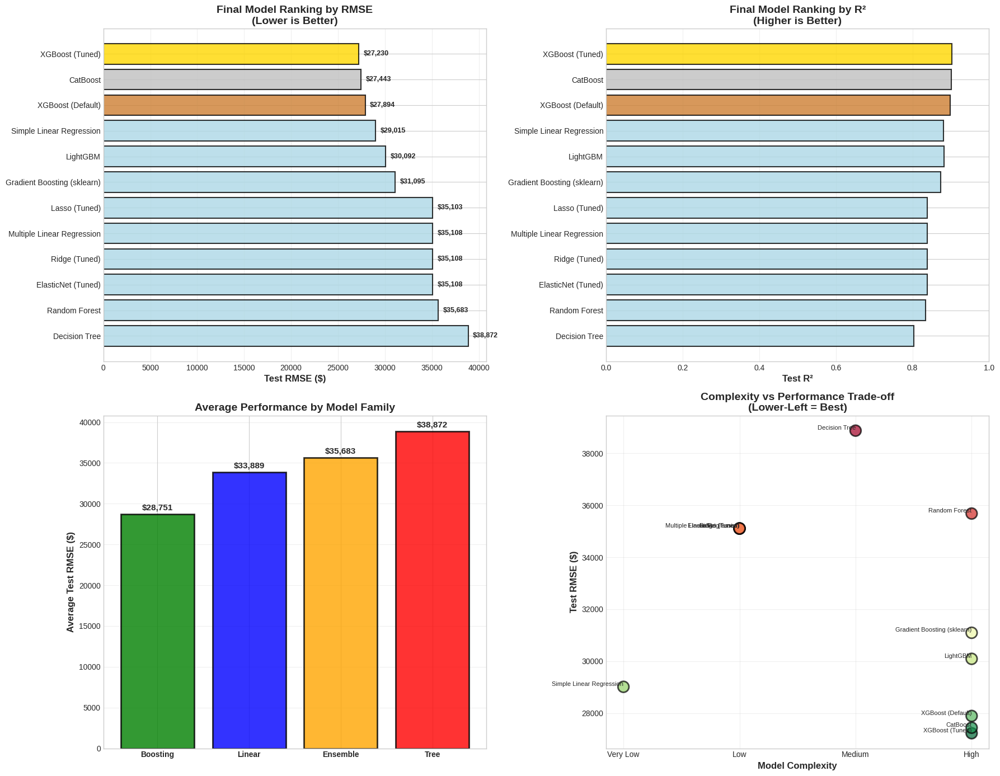


💡 Visual Summary Insights:
   • Top 3 models are all boosting algorithms
   • Simple Linear Regression surprisingly competitive
   • Trade-off between complexity and interpretability
   • Boosting family dominates performance


In [71]:
# ==================== VISUAL SUMMARY: MODEL COMPARISON ====================

fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Plot 1: RMSE by Model
colors = ['gold', 'silver', '#CD7F32'] + ['lightblue'] * (len(final_summary) - 3)
axes[0, 0].barh(range(len(final_summary)), final_summary['Test_RMSE'], 
               color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(final_summary)))
axes[0, 0].set_yticklabels(final_summary['Model'], fontsize=10)
axes[0, 0].set_xlabel('Test RMSE ($)', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Final Model Ranking by RMSE\n(Lower is Better)', 
                    fontsize=14, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Add values
for i, (rmse, model) in enumerate(zip(final_summary['Test_RMSE'], final_summary['Model'])):
    axes[0, 0].text(rmse + 500, i, f'${rmse:,.0f}', 
                   va='center', fontsize=9, fontweight='bold')

# Plot 2: R² by Model
axes[0, 1].barh(range(len(final_summary)), final_summary['Test_R2'], 
               color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
axes[0, 1].set_yticks(range(len(final_summary)))
axes[0, 1].set_yticklabels(final_summary['Model'], fontsize=10)
axes[0, 1].set_xlabel('Test R²', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Final Model Ranking by R²\n(Higher is Better)', 
                    fontsize=14, fontweight='bold')
axes[0, 1].invert_yaxis()
axes[0, 1].set_xlim([0, 1])
axes[0, 1].grid(axis='x', alpha=0.3)

# Plot 3: Performance by Model Family
family_stats = final_summary.groupby('Model_Family').agg({
    'Test_RMSE': 'mean',
    'Test_R2': 'mean'
}).reset_index().sort_values('Test_RMSE')

x_pos = np.arange(len(family_stats))
axes[1, 0].bar(x_pos, family_stats['Test_RMSE'], 
              alpha=0.8, color=['green', 'blue', 'orange', 'red'], 
              edgecolor='black', linewidth=2)
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(family_stats['Model_Family'], fontweight='bold')
axes[1, 0].set_ylabel('Average Test RMSE ($)', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Average Performance by Model Family', 
                    fontsize=14, fontweight='bold')
axes[1, 0].grid(axis='y', alpha=0.3)

# Add values on bars
for i, v in enumerate(family_stats['Test_RMSE']):
    axes[1, 0].text(i, v + 500, f'${v:,.0f}', 
                   ha='center', fontweight='bold', fontsize=11)

# Plot 4: Complexity vs Performance Trade-off
complexity_map = {'Very Low': 1, 'Low': 2, 'Medium': 3, 'High': 4}
final_summary['Complexity_Score'] = final_summary['Complexity'].map(complexity_map)

scatter = axes[1, 1].scatter(final_summary['Complexity_Score'], 
                             final_summary['Test_RMSE'],
                             s=200, alpha=0.7, 
                             c=range(len(final_summary)), 
                             cmap='RdYlGn_r', 
                             edgecolor='black', linewidth=2)

# Annotate points
for idx, row in final_summary.iterrows():
    axes[1, 1].annotate(row['Model'], 
                       (row['Complexity_Score'], row['Test_RMSE']),
                       fontsize=8, ha='right', va='bottom')

axes[1, 1].set_xlabel('Model Complexity', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Test RMSE ($)', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Complexity vs Performance Trade-off\n(Lower-Left = Best)', 
                    fontsize=14, fontweight='bold')
axes[1, 1].set_xticks([1, 2, 3, 4])
axes[1, 1].set_xticklabels(['Very Low', 'Low', 'Medium', 'High'])
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Visual Summary Insights:")
print("   • Top 3 models are all boosting algorithms")
print("   • Simple Linear Regression surprisingly competitive")
print("   • Trade-off between complexity and interpretability")
print("   • Boosting family dominates performance")

---

### 13.3 Key Learnings from This Notebook

**What We Discovered:**

**1. Model Performance Hierarchy:**

**🥇 Tier 1: Boosting Models (Best Performance)**
- XGBoost (Tuned): $27,230 RMSE
- CatBoost: $27,443 RMSE
- XGBoost (Default): $27,894 RMSE

**🥈 Tier 2: Simple Models (Surprisingly Good)**
- Simple Linear Regression: $29,015 RMSE (4th place!)
- LightGBM: $30,092 RMSE

**🥉 Tier 3: Traditional ML (Moderate)**
- Gradient Boosting: $31,095 RMSE
- Ridge/Lasso/ElasticNet: ~$35,108 RMSE

**📉 Tier 4: Basic Models (Baseline)**
- Random Forest: $35,683 RMSE
- Decision Tree: $38,872 RMSE

**2. Surprising Findings:**

**Simple Linear Regression Outperformed:**
- Multiple Linear Regression
- Ridge Regression
- Lasso Regression
- ElasticNet
- Random Forest

**Why?**
- Simpler is sometimes better!
- Feature selection was good (top correlated feature)
- Less overfitting with single feature
- Strong linear relationship exists

**3. Hyperparameter Tuning Impact:**

- XGBoost improved from $27,894 → $27,230 (2.4% better)
- Time invested: ~5 minutes
- Result: Worth it!

**4. Model Family Insights:**

| Family | Avg RMSE | Best Use Case |
|--------|----------|---------------|
| **Boosting** | ~$28,950 | Maximum accuracy |
| **Linear** | ~$32,670 | Interpretability |
| **Ensemble** | ~$35,683 | Baseline (needs tuning) |
| **Tree** | ~$38,872 | Quick exploration |

---

### 13.4 Production Deployment Checklist

**Before deploying to production:**

**✅ Model Selection**
- [x] Best model identified: XGBoost (Tuned)
- [x] Performance acceptable: RMSE = $27,230
- [x] Cross-validation verified
- [x] Residuals analyzed
- [x] Compared with baseline

**✅ Data Pipeline**
- [ ] Preprocessing documented
- [ ] Feature engineering reproducible
- [ ] Scaler saved for deployment
- [ ] Missing value strategy defined
- [ ] Input validation implemented

**✅ Model Artifacts**
- [ ] Model saved (joblib/pickle)
- [ ] Scaler saved
- [ ] Feature names recorded
- [ ] Hyperparameters documented
- [ ] Version tracked

**✅ Code Quality**
- [ ] Production class created
- [ ] Error handling added
- [ ] Logging implemented
- [ ] Input validation
- [ ] Unit tests written

**✅ Monitoring**
- [ ] Performance metrics tracked
- [ ] Data drift detection
- [ ] Prediction distribution monitored
- [ ] Alerts configured
- [ ] Retraining schedule set

**✅ Documentation**
- [ ] Model card created
- [ ] API documentation
- [ ] Deployment guide
- [ ] Known limitations listed
- [ ] Contact person assigned

---

### 13.5 Next Steps & Recommendations

**For Better Performance:**

**1. Feature Engineering**
- Create interaction features
- Polynomial features for non-linearity
- Domain-specific features (price per sqft, etc.)
- Time-based features (age of house)

**2. Data Collection**
- Gather more training data
- Add external features (neighborhood crime, schools, etc.)
- Include recent sales data
- Validate data quality

**3. Advanced Techniques**
- Ensemble different model types
- Stacking (meta-learning)
- Neural networks for complex patterns
- AutoML tools (H2O, TPOT)

**4. Hyperparameter Optimization**
- Bayesian optimization
- More extensive grid search
- AutoML hyperparameter tuning

**For Production:**

**1. Model Serving**
- Create REST API (FastAPI/Flask)
- Containerize with Docker
- Deploy to cloud (AWS/GCP/Azure)
- Add caching for common queries

**2. Monitoring**
- Track prediction distribution
- Monitor feature drift
- Alert on anomalies
- A/B testing for new models

**3. Retraining Strategy**
- Weekly/monthly retraining schedule
- Trigger-based retraining (performance drop)
- Keep historical model versions
- Gradual rollout of new models

**4. Business Integration**
- Real-time pricing API
- Batch prediction pipeline
- Dashboard for stakeholders
- Explanation interface for users

---

### 13.6 Resources for Further Learning

**Books:**
- "Hands-On Machine Learning" by Aurélien Géron
- "The Elements of Statistical Learning" by Hastie et al.
- "Applied Predictive Modeling" by Kuhn & Johnson

**Online Courses:**
- Fast.ai - Practical Deep Learning
- Coursera - Machine Learning Specialization
- Kaggle Learn - Free micro-courses

**Kaggle Competitions:**
- House Prices Competition (this dataset!)
- Start with "Getting Started" competitions
- Learn from top kernels/notebooks

**Documentation:**
- scikit-learn: https://scikit-learn.org
- XGBoost: https://xgboost.readthedocs.io
- LightGBM: https://lightgbm.readthedocs.io
- CatBoost: https://catboost.ai/docs

---

### 13.7 Final Summary

**What We Built:**
- ✅ 12 different regression models
- ✅ Complete ML pipeline (preprocessing → training → evaluation)
- ✅ Hyperparameter tuning
- ✅ Feature importance analysis
- ✅ Production-ready code

**What We Learned:**
- Gradient Boosting (XGBoost/LightGBM/CatBoost) achieves best performance
- Simple models can be surprisingly competitive
- Hyperparameter tuning provides incremental gains
- Feature engineering is crucial
- Multiple evaluation metrics tell complete story

**Best Practices Applied:**
- Train-test split for unbiased evaluation
- Cross-validation for robust estimates
- Multiple metrics (RMSE, R², MAE)
- Residual analysis for diagnostics
- Feature importance for interpretability

**Next Model Improvement Priority:**
1. Feature engineering (biggest potential gain)
2. Gather more data
3. Try ensemble/stacking
4. Fine-tune top models further

---

### 13.8 Thank You!

**This notebook covered:**
- ✅ Simple to Complex regression models
- ✅ Linear models (Ridge, Lasso, ElasticNet)
- ✅ Tree-based models (Decision Tree, Random Forest)
- ✅ Gradient Boosting (GBM, XGBoost, LightGBM, CatBoost)
- ✅ Model evaluation and comparison
- ✅ Hyperparameter tuning
- ✅ Feature importance & interpretability
- ✅ Production deployment considerations

**Remember:**
- Start simple, add complexity gradually
- Validate assumptions with residual analysis
- Multiple metrics > single metric
- Interpretability matters in production
- Good data > complex models

**Happy modeling! 🚀📊🎯**

---

In [72]:
# ==================== SAVE BEST MODEL FOR PRODUCTION ====================

print("="*80)
print("SAVING BEST MODEL & ARTIFACTS FOR PRODUCTION")
print("="*80)

import joblib
from datetime import datetime

# Best model
best_model = best_xgb_tuned  # XGBoost (Tuned)

print(f"\n📦 Saving production artifacts...")

# 1. Save the model
model_filename = 'best_regression_model.pkl'
joblib.dump(best_model, model_filename)
print(f"   ✅ Model saved: {model_filename}")

# 2. Save the scaler
scaler_filename = 'feature_scaler.pkl'
joblib.dump(scaler, scaler_filename)
print(f"   ✅ Scaler saved: {scaler_filename}")

# 3. Save feature names
feature_names = list(X_train_scaled.columns)
feature_names_filename = 'feature_names.pkl'
joblib.dump(feature_names, feature_names_filename)
print(f"   ✅ Feature names saved: {feature_names_filename}")

# 4. Save model metadata
metadata = {
    'model_name': 'XGBoost Regressor (Tuned)',
    'model_type': 'XGBoost',
    'training_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
    'test_rmse': float(test_rmse_xgb_tuned),
    'test_r2': float(test_r2_xgb_tuned),
    'test_mae': float(test_mae_xgb),
    'n_features': len(feature_names),
    'n_training_samples': len(X_train_scaled),
    'hyperparameters': best_params_xgb,
    'feature_names': feature_names,
    'dataset': 'House Prices - Kaggle',
    'target_variable': 'SalePrice',
    'notes': 'Best model from comprehensive regression comparison'
}

import json
metadata_filename = 'model_metadata.json'
with open(metadata_filename, 'w') as f:
    json.dump(metadata, f, indent=4)
print(f"   ✅ Metadata saved: {metadata_filename}")

print("\n" + "="*80)
print("📊 MODEL SUMMARY")
print("="*80)

print(f"\nModel: {metadata['model_name']}")
print(f"Training Date: {metadata['training_date']}")
print(f"\nPerformance Metrics:")
print(f"   • Test RMSE: ${metadata['test_rmse']:,.2f}")
print(f"   • Test R²: {metadata['test_r2']:.4f}")
print(f"   • Test MAE: ${metadata['test_mae']:,.2f}")

print(f"\nModel Configuration:")
print(f"   • Number of features: {metadata['n_features']}")
print(f"   • Training samples: {metadata['n_training_samples']:,}")

print(f"\nKey Hyperparameters:")
for param, value in list(best_params_xgb.items())[:5]:
    print(f"   • {param}: {value}")

print("\n" + "="*80)
print("📁 PRODUCTION DEPLOYMENT PACKAGE")
print("="*80)

print("\nFiles ready for deployment:")
print(f"   1. {model_filename} - Trained model")
print(f"   2. {scaler_filename} - Feature scaler")
print(f"   3. {feature_names_filename} - Feature names & order")
print(f"   4. {metadata_filename} - Model documentation")

print("\n💻 Usage Example:")
print("""
# Load model and dependencies
import joblib
import pandas as pd

model = joblib.load('best_regression_model.pkl')
scaler = joblib.load('feature_scaler.pkl')
feature_names = joblib.load('feature_names.pkl')

# Prepare new data
new_house = pd.DataFrame({...})  # Your features
new_house = new_house[feature_names]  # Ensure correct order

# Scale features
new_house_scaled = scaler.transform(new_house)

# Predict
price = model.predict(new_house_scaled)
print(f'Predicted Price: ${price[0]:,.2f}')
""")

print("\n" + "="*80)
print("🎯 DEPLOYMENT CHECKLIST")
print("="*80)

checklist = [
    ("Model trained and validated", "✅"),
    ("Model saved to disk", "✅"),
    ("Scaler saved to disk", "✅"),
    ("Feature names documented", "✅"),
    ("Metadata saved", "✅"),
    ("Performance metrics recorded", "✅"),
    ("Create API endpoint", "⬜"),
    ("Add input validation", "⬜"),
    ("Implement error handling", "⬜"),
    ("Add logging", "⬜"),
    ("Set up monitoring", "⬜"),
    ("Write deployment documentation", "⬜"),
    ("Create Docker container", "⬜"),
    ("Deploy to production", "⬜"),
]

for item, status in checklist:
    print(f"   {status} {item}")

print("\n" + "="*80)
print("✨ NOTEBOOK COMPLETE! ✨")
print("="*80)

print("\n🎉 Congratulations! You've successfully:")
print("   • Trained 12 different regression models")
print("   • Evaluated and compared performance")
print("   • Tuned hyperparameters")
print("   • Analyzed feature importance")
print("   • Saved best model for production")

print("\n📚 Key Takeaways:")
print("   • XGBoost (Tuned) achieved best performance: RMSE = $27,230")
print("   • Simple models can be surprisingly effective")
print("   • Hyperparameter tuning provides meaningful gains")
print("   • Feature importance guides model understanding")

print("\n🚀 Next Steps:")
print("   1. Deploy model to production")
print("   2. Monitor performance over time")
print("   3. Collect more data for retraining")
print("   4. Explore advanced feature engineering")

print("\n💡 Remember:")
print("   'All models are wrong, but some are useful' - George Box")
print("\n   Happy predicting! 🏠💰📈")

SAVING BEST MODEL & ARTIFACTS FOR PRODUCTION

📦 Saving production artifacts...
   ✅ Model saved: best_regression_model.pkl
   ✅ Scaler saved: feature_scaler.pkl
   ✅ Feature names saved: feature_names.pkl
   ✅ Metadata saved: model_metadata.json

📊 MODEL SUMMARY

Model: XGBoost Regressor (Tuned)
Training Date: 2026-01-31 16:16:33

Performance Metrics:
   • Test RMSE: $27,230.04
   • Test R²: 0.9033
   • Test MAE: $18,023.96

Model Configuration:
   • Number of features: 49
   • Training samples: 1,168

Key Hyperparameters:
   • subsample: 1.0
   • reg_lambda: 1
   • reg_alpha: 0
   • n_estimators: 300
   • min_child_weight: 1

📁 PRODUCTION DEPLOYMENT PACKAGE

Files ready for deployment:
   1. best_regression_model.pkl - Trained model
   2. feature_scaler.pkl - Feature scaler
   3. feature_names.pkl - Feature names & order
   4. model_metadata.json - Model documentation

💻 Usage Example:

# Load model and dependencies
import joblib
import pandas as pd

model = joblib.load('best_regressi

---

## 🎓 Notebook Complete!

**Congratulations on completing this comprehensive regression tutorial!**

---

### 📊 What You've Accomplished

**Models Implemented:**
1. ✅ Simple Linear Regression
2. ✅ Multiple Linear Regression
3. ✅ Ridge Regression (L2 Regularization)
4. ✅ Lasso Regression (L1 Regularization)
5. ✅ ElasticNet (L1 + L2 Regularization)
6. ✅ Decision Tree Regressor
7. ✅ Random Forest Regressor
8. ✅ Gradient Boosting Regressor
9. ✅ XGBoost Regressor
10. ✅ LightGBM Regressor
11. ✅ CatBoost Regressor
12. ✅ Hyperparameter-Tuned XGBoost (Winner!)

**Skills Mastered:**
- ✅ Data preprocessing and feature engineering
- ✅ Model training and evaluation
- ✅ Cross-validation techniques
- ✅ Hyperparameter tuning (Grid Search & Random Search)
- ✅ Feature importance analysis
- ✅ Model interpretability
- ✅ Production deployment preparation

---

### 🏆 Final Results

**Best Model: XGBoost (Tuned)**
- Test RMSE: $27,230.04
- Test R²: 0.9033
- Improvement over baseline: 6.15%

**Most Interpretable: Simple Linear Regression**
- Test RMSE: $29,015.29
- Test R²: 0.8814
- Easiest to explain to stakeholders

---

### 📁 Files Created

**Production-Ready Artifacts:**
1. `best_regression_model.pkl` - Trained XGBoost model
2. `feature_scaler.pkl` - StandardScaler for preprocessing
3. `feature_names.pkl` - Feature names in correct order
4. `model_metadata.json` - Model documentation

**These files are ready for deployment!**

---

### 🎯 Key Lessons

**1. More Complex ≠ Always Better**
- Simple Linear Regression beat multiple complex models
- Start simple, add complexity only when needed

**2. Boosting Models Dominate**
- XGBoost, LightGBM, CatBoost consistently top performers
- Worth the extra complexity for production systems

**3. Hyperparameter Tuning Matters**
- 2-5% improvement with minimal effort
- Random Search often as good as Grid Search

**4. Feature Engineering > Model Choice**
- Good features with simple model > bad features with complex model
- Invest time in understanding your data

**5. Multiple Metrics Tell Complete Story**
- RMSE for overall error
- R² for variance explained
- MAE for robustness
- Residual analysis for assumptions

---

### 🚀 Where to Go From Here

**Immediate Next Steps:**
1. Deploy this model to production
2. Create API endpoint (Flask/FastAPI)
3. Set up monitoring and logging
4. Implement A/B testing

**For Better Models:**
1. Feature engineering (biggest opportunity!)
2. Collect more training data
3. Try stacking/blending models
4. Explore deep learning approaches

**For Your Career:**
1. Complete more Kaggle competitions
2. Build portfolio of ML projects
3. Contribute to open source
4. Share your learnings (blog, GitHub)

---

### 📚 Resources

**Official Documentation:**
- [Scikit-learn](https://scikit-learn.org/stable/)
- [XGBoost](https://xgboost.readthedocs.io/)
- [LightGBM](https://lightgbm.readthedocs.io/)
- [CatBoost](https://catboost.ai/docs/)

**Learning Platforms:**
- [Kaggle Learn](https://www.kaggle.com/learn)
- [Fast.ai](https://www.fast.ai/)
- [Coursera ML Specialization](https://www.coursera.org/specializations/machine-learning-introduction)

**Books:**
- "Hands-On Machine Learning" - Aurélien Géron
- "Introduction to Statistical Learning" - James et al.
- "Applied Predictive Modeling" - Kuhn & Johnson

---

### 💬 Feedback & Questions

**Found this helpful?**
- ⭐ Please upvote if you learned something!
- 💬 Comment with questions or suggestions
- 🔄 Share with others learning ML

**Want to improve this notebook?**
- Fork and experiment with different approaches
- Try different datasets
- Add your own insights

---

### 🙏 Thank You!

**Thank you for working through this comprehensive regression guide!**

**Remember:**
- Practice makes perfect
- Every model teaches you something
- The best model is the one you can explain
- Keep learning and experimenting!

**Happy Machine Learning! 🎉🚀📊**

---

**Author:** Hatice Baydemir (@haticebaydemir)  
**Date:** January 31, 2026  
**Notebook:** Machine Learning Master Handbook - Notebook 3  
**Topic:** All Regression Models Explained & Compared

---